# Generative Models

In [1]:
from tqdm import tqdm
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
from glob import glob



## Dataset

In [ ]:
!wget 'https://surfdrive.surf.nl/files/index.php/s/LXBrnGGvUISlckW/download'

!mv 'download' 'face_dataset_64x64.npy'

--2022-11-18 08:52:55--  https://surfdrive.surf.nl/files/index.php/s/LXBrnGGvUISlckW/download
Resolving surfdrive.surf.nl (surfdrive.surf.nl)... 145.100.27.67, 2001:610:108:203b:0:a11:da7a:5afe
Connecting to surfdrive.surf.nl (surfdrive.surf.nl)|145.100.27.67|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 503083136 (480M) [application/octet-stream]
Saving to: ‘download’

download            100%[===================>] 479.78M  15.3MB/s    in 33s     

2022-11-18 08:53:29 (14.3 MB/s) - ‘download’ saved [503083136/503083136]



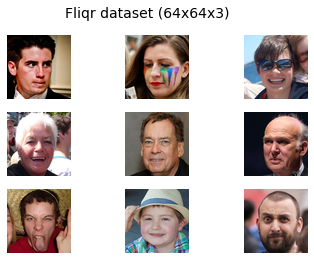

In [ ]:
def load_real_samples(scale=False):
    X = np.load('face_dataset_64x64.npy')[:20000, :, :, :]
    # Scale samples in range [-127, 127]
    if scale:
        X = (X - 127.5) * 2
    return X / 255.

def grid_plot(images, epoch='', name='', n=3, save=False, scale=False):
    if scale:
        images = (images + 1) / 2.0
    for index in range(n * n):
        plt.subplot(n, n, 1 + index)
        plt.axis('off')
        plt.imshow(images[index])
    fig = plt.gcf()
    fig.suptitle(name + '  '+ str(epoch), fontsize=14)
    if save:
        filename = 'results/generated_plot_e%03d_f.png' % (epoch+1)
        plt.savefig(filename)
        plt.close()
    plt.show()


dataset = load_real_samples()
grid_plot(dataset[np.random.randint(0, 1000, 9)], name='Fliqr dataset (64x64x3)', n=3)

In [ ]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape

def build_conv_net(in_shape, out_shape, n_downsampling_layers=4, filters=128, out_activation='sigmoid'):
    """
    Build a basic convolutional network
    """
    model = tf.keras.Sequential()
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')

    model.add(Conv2D(input_shape=in_shape, **default_args, filters=filters))

    for _ in range(n_downsampling_layers):
        model.add(Conv2D(**default_args, filters=filters))

    model.add(Flatten())
    model.add(Dense(out_shape, activation=out_activation) )
    model.summary()
    return model


def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='sigmoid'):
    """
    Build a deconvolutional network for decoding/upscaling latent vectors

    When building the deconvolutional architecture, usually it is best to use the same layer sizes that 
    were used in the downsampling network and the Conv2DTranspose layers are used instead of Conv2D layers. 
    Using identical layers and hyperparameters ensures that the dimensionality of our output matches the
    shape of our input images. 
    """

    model = tf.keras.Sequential()
    model.add(Dense(4 * 4 * 64, input_dim=latent_dim)) 
    model.add(Reshape((4, 4, 64))) # This matches the output size of the downsampling architecture
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')
    
    for i in range(n_upsampling_layers):
        model.add(Conv2DTranspose(**default_args, filters=filters))

    # This last convolutional layer converts back to 3 channel RGB image
    model.add(Conv2D(filters=3, kernel_size=(3,3), activation=activation_out, padding='same'))
    model.summary()
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 128)       3584      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_3 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_4 (Conv2D)           (None, 2, 2, 128)         147584    
                                                                 
 flatten (Flatten)           (None, 512)               0         
                                                                 
 dense (Dense)               (None, 512)               2

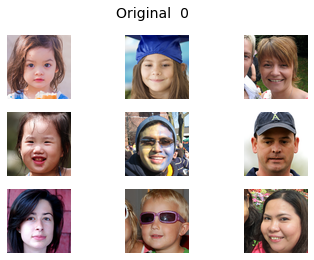

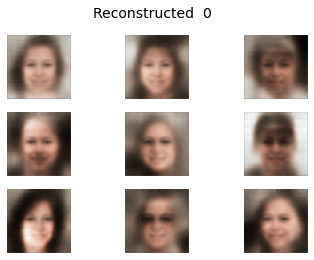


Epoch:  1
1/1 [==============================] - 0s 19ms/step


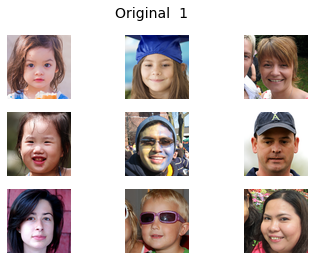

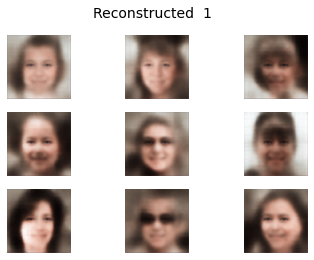


Epoch:  2
1/1 [==============================] - 0s 17ms/step


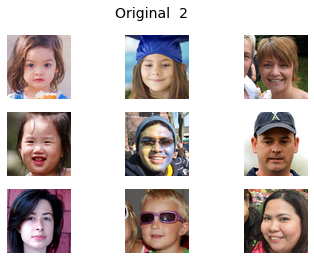

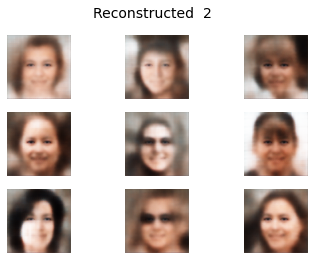


Epoch:  3
1/1 [==============================] - 0s 18ms/step


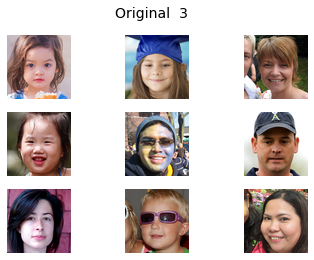

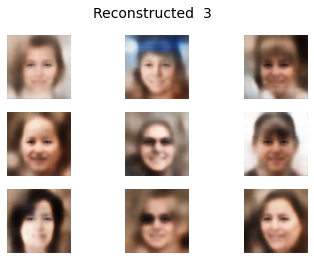


Epoch:  4
1/1 [==============================] - 0s 21ms/step


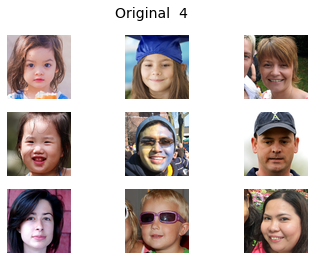

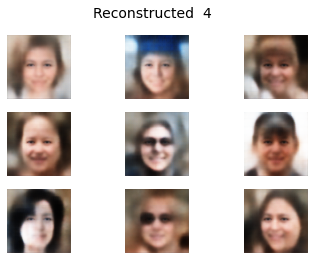


Epoch:  5
1/1 [==============================] - 0s 16ms/step


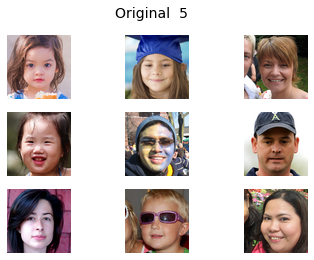

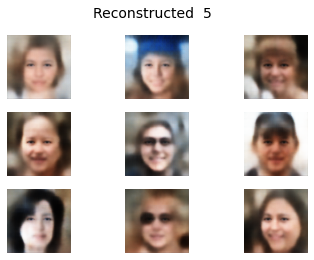


Epoch:  6
1/1 [==============================] - 0s 18ms/step


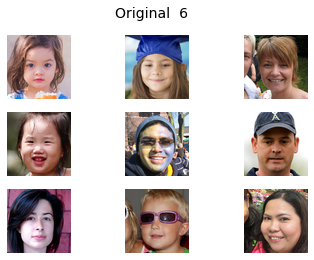

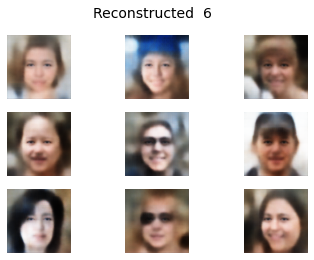


Epoch:  7
1/1 [==============================] - 0s 17ms/step


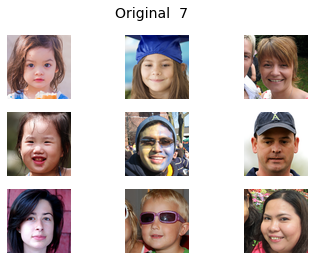

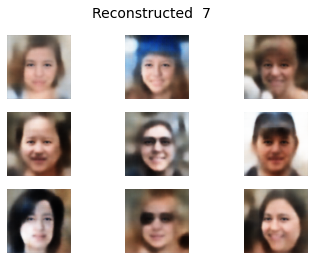


Epoch:  8
1/1 [==============================] - 0s 19ms/step


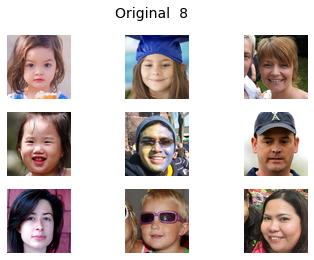

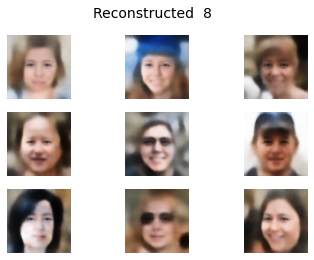


Epoch:  9
1/1 [==============================] - 0s 17ms/step


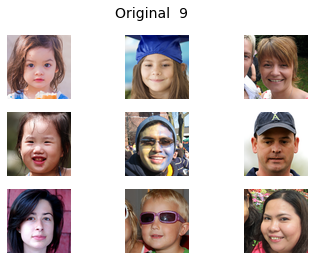

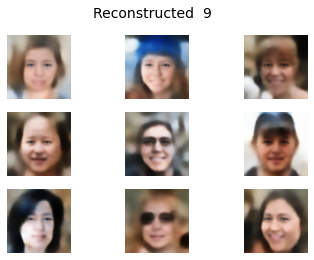

In [ ]:
def build_convolutional_autoencoder(data_shape, latent_dim, filters=128):
    encoder = build_conv_net(in_shape=data_shape, out_shape=latent_dim, filters=filters)
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)

    # We connect encoder and decoder into a single model
    autoencoder = tf.keras.Sequential([encoder, decoder])
    
    # Binary crossentropy loss - pairwise comparison between input and output pixels
    autoencoder.compile(loss='binary_crossentropy', optimizer='adam')

    return autoencoder


# Defining the model dimensions and building it
image_size = dataset.shape[1:]
latent_dim = 512
num_filters = 128
cae = build_convolutional_autoencoder(image_size, latent_dim, num_filters)

for epoch in range(10):
    print('\nEpoch: ', epoch)

    # Note that (X=y) when training autoencoders!
    # In this case we only care about qualitative performance, we don't split into train/test sets
    cae.fit(x=dataset, y=dataset, epochs=1, batch_size=64)
    
    samples = dataset[:9]
    reconstructed = cae.predict(samples)
    grid_plot(samples, epoch, name='Original', n=3, save=False)
    grid_plot(reconstructed, epoch, name='Reconstructed', n=3, save=False)

In [ ]:
class Sampling(tf.keras.layers.Layer):
    """
    Custom layer for the variational autoencoder
    It takes two vectors as input - one for means and other for variances of the latent variables described by a multimodal gaussian
    Its output is a latent vector randomly sampled from this distribution
    """
    def call(self, inputs):
        z_mean, z_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_var) * epsilon

def build_vae(data_shape, latent_dim, filters=128):

    # Building the encoder - starts with a simple downsampling convolutional network  
    encoder = build_conv_net(data_shape, latent_dim*2, filters=filters)
    
    # Adding special sampling layer that uses the reparametrization trick 
    z_mean = Dense(latent_dim)(encoder.output)
    z_var = Dense(latent_dim)(encoder.output)
    z = Sampling()([z_mean, z_var])
    
    # Connecting the two encoder parts
    encoder = tf.keras.Model(inputs=encoder.input, outputs=z)

    # Defining the decoder which is a regular upsampling deconvolutional network
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)
    vae = tf.keras.Model(inputs=encoder.input, outputs=decoder(z))
    
    # Adding the special loss term
    kl_loss = -0.5 * tf.reduce_sum(z_var - tf.square(z_mean) - tf.exp(z_var) + 1)
    vae.add_loss(kl_loss/tf.cast(tf.keras.backend.prod(data_shape), tf.float32))

    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy')

    return encoder, decoder, vae


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 32, 128)       3584      
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_8 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_9 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_10 (Conv2D)          (None, 2, 2, 128)         147584    
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 64)               

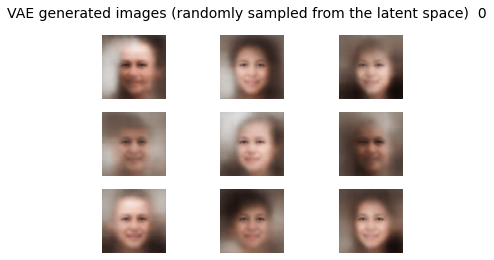

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5989


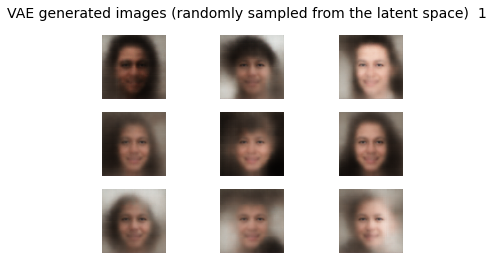

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5966


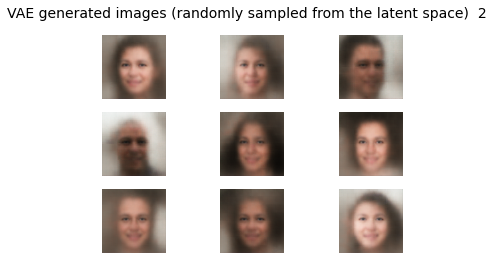

2500/2500 [==============================] - 29s 11ms/step - loss: 0.5956


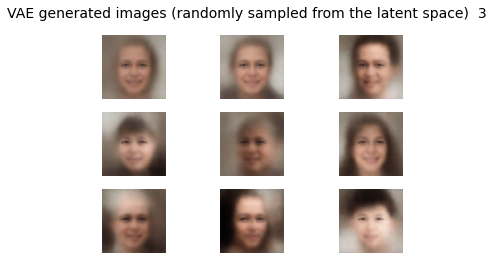

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5947


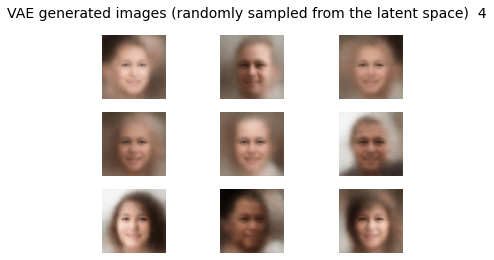

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5943


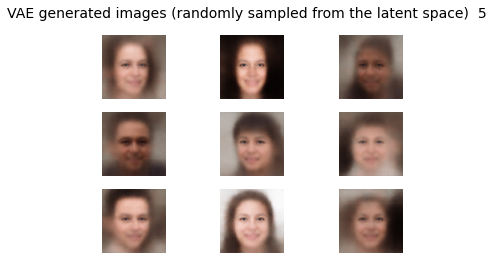

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5939


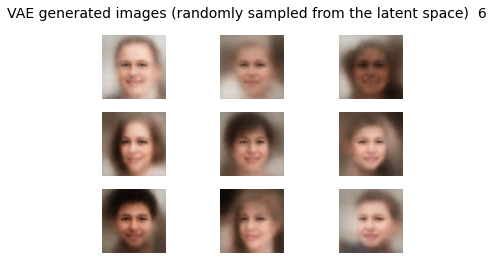

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5935


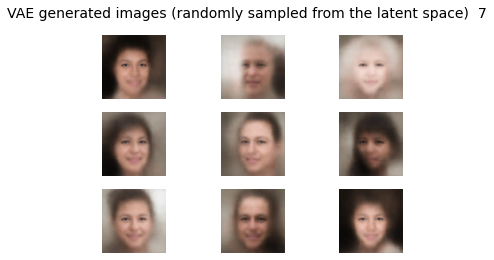

2500/2500 [==============================] - 28s 11ms/step - loss: 0.5933


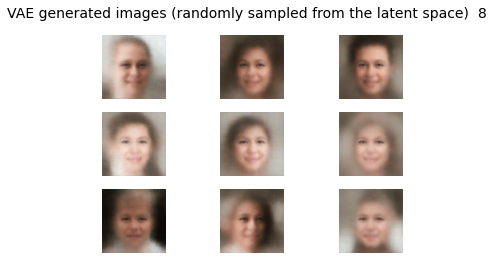

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5931


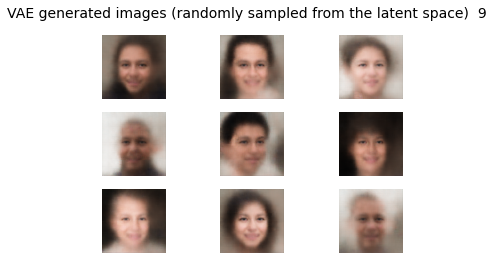

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5930


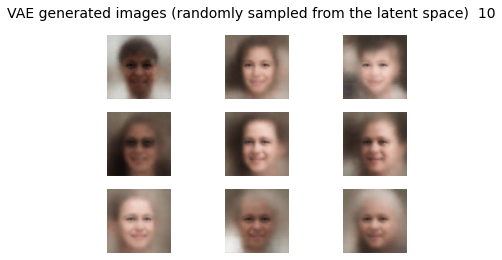

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5928


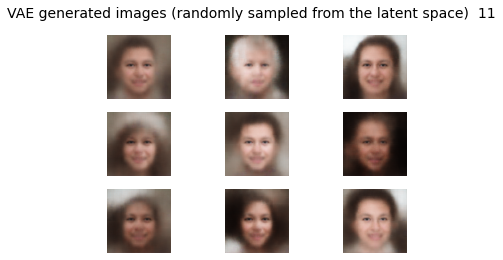

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5926


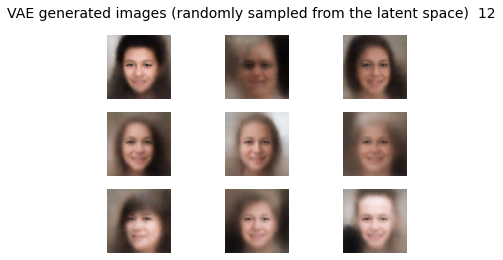

2500/2500 [==============================] - 29s 11ms/step - loss: 0.5924


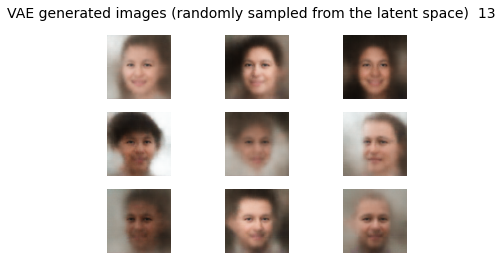

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5922


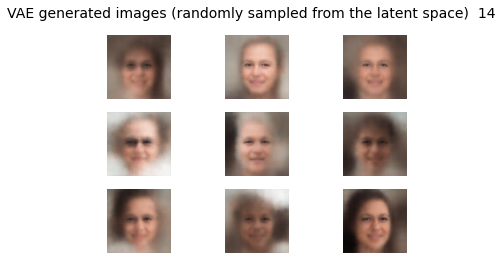

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5921


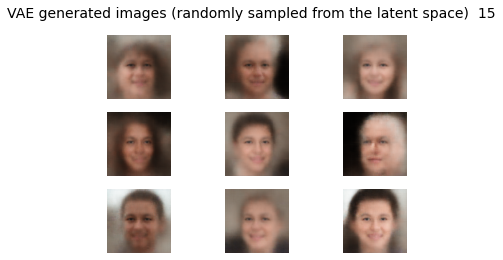

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5920


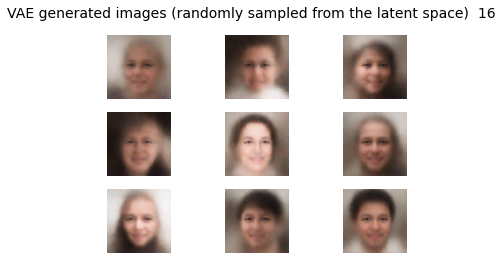

2500/2500 [==============================] - 30s 12ms/step - loss: 0.5918


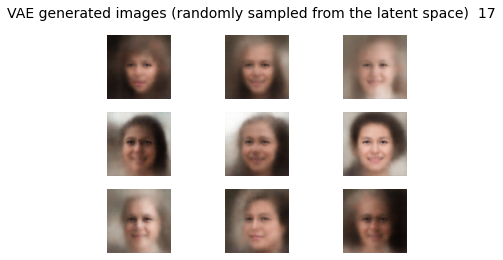

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5917


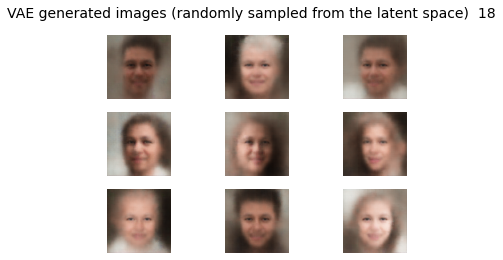

2500/2500 [==============================] - 29s 12ms/step - loss: 0.5916


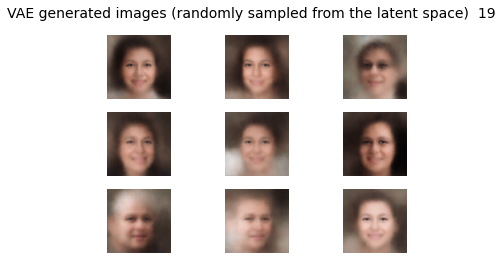

In [ ]:
# Training the VAE model

latent_dim = 32
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, filters=128)

# Generate random vectors that we will use to sample our latent space
for epoch in range(20):
    latent_vectors = np.random.randn(9, latent_dim)
    vae.fit(x=dataset, y=dataset, epochs=1, batch_size=8)
    
    images = decoder(latent_vectors)
    grid_plot(images, epoch, name='VAE generated images (randomly sampled from the latent space)', n=3, save=False)

In [ ]:
def build_gan(data_shape, latent_dim, filters=128, lr=0.0002, beta_1=0.5):
    optimizer = tf.optimizers.Adam(learning_rate=lr, beta_1=beta_1)

    # Usually thew GAN generator has tanh activation function in the output layer
    generator = build_deconv_net(latent_dim, activation_out='tanh', filters=filters)
    
    # Build and compile the discriminator
    discriminator = build_conv_net(in_shape=data_shape, out_shape=1, filters=filters) # Single output for binary classification
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    # End-to-end GAN model for training the generator
    discriminator.trainable = False
    true_fake_prediction = discriminator(generator.output)
    GAN = tf.keras.Model(inputs=generator.input, outputs=true_fake_prediction)
    GAN = tf.keras.models.Sequential([generator, discriminator])
    GAN.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    return discriminator, generator, GAN


In [ ]:
def run_generator(generator, n_samples=100):
    """
    Run the generator model and generate n samples of synthetic images using random latent vectors
    """
    latent_dim = generator.layers[0].input_shape[-1]
    generator_input = np.random.randn(n_samples, latent_dim)

    return generator.predict(generator_input)
    

def get_batch(generator, dataset, batch_size=64):
    """
    Gets a single batch of samples (X) and labels (y) for the training the discriminator.
    One half from the real dataset (labeled as 1s), the other created by the generator model (labeled as 0s).
    """
    batch_size //= 2 # Split evenly among fake and real samples

    fake_data = run_generator(generator, n_samples=batch_size)
    real_data = dataset[np.random.randint(0, dataset.shape[0], batch_size)]

    X = np.concatenate([fake_data, real_data], axis=0)
    y = np.concatenate([np.zeros([batch_size, 1]), np.ones([batch_size, 1])], axis=0)

    return X, y


def train_gan(generator, discriminator, gan, dataset, latent_dim, n_epochs=20, batch_size=64):

    batches_per_epoch = int(dataset.shape[0] / batch_size / 2)
    for epoch in range(n_epochs):
        for batch in tqdm(range(batches_per_epoch)):
            
            # 1) Train discriminator both on real and synthesized images
            X, y = get_batch(generator, dataset, batch_size=batch_size)
            discriminator_loss = discriminator.train_on_batch(X, y)

            # 2) Train generator (note that now the label of synthetic images is reversed to 1)
            X_gan = np.random.randn(batch_size, latent_dim)
            y_gan = np.ones([batch_size, 1])
            generator_loss = gan.train_on_batch(X_gan, y_gan)

        noise = np.random.randn(16, latent_dim)
        images = generator.predict(noise)
        grid_plot(images, epoch, name='GAN generated images', n=3, save=False, scale=True)


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 1024)              263168    
                                                                 
 reshape_2 (Reshape)         (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 8, 8, 128)        73856     
 ranspose)                                                       
                                                                 
 conv2d_transpose_9 (Conv2DT  (None, 16, 16, 128)      147584    
 ranspose)                                                       
                                                                 
 conv2d_transpose_10 (Conv2D  (None, 32, 32, 128)      147584    
 Transpose)                                                      
                                                      

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 119ms/step


  1%|          | 1/156 [00:01<03:48,  1.47s/it]

1/1 [==============================] - 0s 13ms/step


  1%|▏         | 2/156 [00:01<01:46,  1.44it/s]

1/1 [==============================] - 0s 13ms/step


  2%|▏         | 3/156 [00:01<01:07,  2.26it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:01<00:49,  3.09it/s]

1/1 [==============================] - 0s 13ms/step


  3%|▎         | 5/156 [00:02<00:38,  3.95it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 6/156 [00:02<00:31,  4.74it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 7/156 [00:02<00:27,  5.35it/s]

1/1 [==============================] - 0s 13ms/step


  5%|▌         | 8/156 [00:02<00:25,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:02<00:23,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▋         | 10/156 [00:02<00:21,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:02<00:21,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 12/156 [00:02<00:20,  6.94it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 13/156 [00:03<00:19,  7.18it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 14/156 [00:03<00:19,  7.33it/s]

1/1 [==============================] - 0s 13ms/step


 10%|▉         | 15/156 [00:03<00:18,  7.51it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:03<00:18,  7.50it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:03<00:18,  7.63it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 18/156 [00:03<00:17,  7.72it/s]

1/1 [==============================] - 0s 13ms/step


 12%|█▏        | 19/156 [00:03<00:17,  7.80it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 20/156 [00:04<00:17,  7.72it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:04<00:17,  7.62it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:04<00:17,  7.51it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:04<00:17,  7.46it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 24/156 [00:04<00:17,  7.59it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:04<00:17,  7.65it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:04<00:17,  7.56it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 27/156 [00:04<00:16,  7.61it/s]

1/1 [==============================] - 0s 13ms/step


 18%|█▊        | 28/156 [00:05<00:16,  7.65it/s]

1/1 [==============================] - 0s 13ms/step


 19%|█▊        | 29/156 [00:05<00:16,  7.54it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 30/156 [00:05<00:16,  7.63it/s]

1/1 [==============================] - 0s 17ms/step


 20%|█▉        | 31/156 [00:05<00:17,  7.30it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:05<00:16,  7.41it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 33/156 [00:05<00:16,  7.44it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:16,  7.44it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:06<00:15,  7.60it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 36/156 [00:06<00:15,  7.57it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:06<00:16,  7.42it/s]

1/1 [==============================] - 0s 13ms/step


 24%|██▍       | 38/156 [00:06<00:15,  7.51it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:06<00:15,  7.45it/s]

1/1 [==============================] - 0s 13ms/step


 26%|██▌       | 40/156 [00:06<00:15,  7.51it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:15,  7.59it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 42/156 [00:06<00:15,  7.50it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 43/156 [00:07<00:15,  7.37it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:07<00:15,  7.44it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:07<00:14,  7.49it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 46/156 [00:07<00:14,  7.55it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:14,  7.46it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 48/156 [00:07<00:14,  7.45it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 49/156 [00:07<00:14,  7.24it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 50/156 [00:08<00:14,  7.16it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 51/156 [00:08<00:14,  7.27it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 52/156 [00:08<00:14,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 53/156 [00:08<00:14,  7.22it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 54/156 [00:08<00:14,  7.09it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:13,  7.27it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:08<00:13,  7.23it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:08<00:13,  7.34it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 58/156 [00:09<00:13,  7.43it/s]

1/1 [==============================] - 0s 13ms/step


 38%|███▊      | 59/156 [00:09<00:13,  7.31it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 60/156 [00:09<00:13,  7.33it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 61/156 [00:09<00:12,  7.34it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 62/156 [00:09<00:12,  7.33it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 63/156 [00:09<00:12,  7.44it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 64/156 [00:09<00:12,  7.43it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 65/156 [00:10<00:12,  7.43it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 66/156 [00:10<00:12,  7.40it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 67/156 [00:10<00:11,  7.50it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 68/156 [00:10<00:11,  7.41it/s]

1/1 [==============================] - 0s 13ms/step


 44%|████▍     | 69/156 [00:10<00:11,  7.38it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 70/156 [00:10<00:11,  7.34it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 71/156 [00:10<00:11,  7.43it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:11<00:11,  7.47it/s]

1/1 [==============================] - 0s 13ms/step


 47%|████▋     | 73/156 [00:11<00:10,  7.59it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:11<00:11,  7.43it/s]

1/1 [==============================] - 0s 17ms/step


 48%|████▊     | 75/156 [00:11<00:10,  7.40it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:11<00:10,  7.37it/s]

1/1 [==============================] - 0s 13ms/step


 49%|████▉     | 77/156 [00:11<00:10,  7.47it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:11<00:10,  7.34it/s]

1/1 [==============================] - 0s 21ms/step


 51%|█████     | 79/156 [00:11<00:10,  7.21it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 80/156 [00:12<00:10,  7.19it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:10,  7.36it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:12<00:10,  7.32it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 83/156 [00:12<00:09,  7.32it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:12<00:09,  7.23it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  7.07it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 86/156 [00:12<00:09,  7.05it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 87/156 [00:13<00:09,  7.01it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:13<00:09,  7.00it/s]

1/1 [==============================] - 0s 19ms/step


 57%|█████▋    | 89/156 [00:13<00:09,  7.10it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:13<00:09,  7.13it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 91/156 [00:13<00:09,  7.11it/s]

1/1 [==============================] - 0s 13ms/step


 59%|█████▉    | 92/156 [00:13<00:08,  7.25it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:13<00:08,  7.29it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 94/156 [00:14<00:08,  7.26it/s]

1/1 [==============================] - 0s 13ms/step


 61%|██████    | 95/156 [00:14<00:08,  7.37it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:14<00:08,  7.38it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 97/156 [00:14<00:08,  7.34it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 98/156 [00:14<00:07,  7.39it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 99/156 [00:14<00:07,  7.36it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:14<00:07,  7.28it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 101/156 [00:15<00:07,  7.24it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:15<00:07,  7.24it/s]

1/1 [==============================] - 0s 13ms/step


 66%|██████▌   | 103/156 [00:15<00:07,  7.37it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 104/156 [00:15<00:07,  7.30it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:15<00:07,  7.26it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:15<00:06,  7.38it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 107/156 [00:15<00:06,  7.34it/s]

1/1 [==============================] - 0s 13ms/step


 69%|██████▉   | 108/156 [00:15<00:06,  7.24it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:16<00:06,  7.36it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:16<00:06,  7.30it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 111/156 [00:16<00:06,  7.26it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 112/156 [00:16<00:05,  7.35it/s]

1/1 [==============================] - 0s 13ms/step


 72%|███████▏  | 113/156 [00:16<00:05,  7.29it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:16<00:05,  7.20it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▎  | 115/156 [00:16<00:05,  7.25it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 116/156 [00:17<00:05,  7.09it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:17<00:05,  7.09it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 118/156 [00:17<00:05,  7.11it/s]

1/1 [==============================] - 0s 13ms/step


 76%|███████▋  | 119/156 [00:17<00:05,  7.02it/s]

1/1 [==============================] - 0s 13ms/step


 77%|███████▋  | 120/156 [00:17<00:05,  7.07it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 121/156 [00:17<00:04,  7.26it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:17<00:04,  7.27it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:18<00:04,  7.20it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:18<00:04,  7.35it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 125/156 [00:18<00:04,  7.38it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:18<00:04,  7.30it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:18<00:03,  7.44it/s]

1/1 [==============================] - 0s 13ms/step


 82%|████████▏ | 128/156 [00:18<00:03,  7.42it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:18<00:03,  7.32it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 130/156 [00:19<00:03,  7.25it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 131/156 [00:19<00:03,  7.35it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 132/156 [00:19<00:03,  7.40it/s]

1/1 [==============================] - 0s 13ms/step


 85%|████████▌ | 133/156 [00:19<00:03,  7.35it/s]

1/1 [==============================] - 0s 13ms/step


 86%|████████▌ | 134/156 [00:19<00:03,  7.33it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:19<00:02,  7.44it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 136/156 [00:19<00:02,  7.39it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:19<00:02,  7.47it/s]

1/1 [==============================] - 0s 13ms/step


 88%|████████▊ | 138/156 [00:20<00:02,  7.26it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:20<00:02,  7.32it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 140/156 [00:20<00:02,  7.26it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 141/156 [00:20<00:02,  7.18it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:20<00:01,  7.17it/s]

1/1 [==============================] - 0s 13ms/step


 92%|█████████▏| 143/156 [00:20<00:01,  7.14it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:20<00:01,  7.11it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 145/156 [00:21<00:01,  7.24it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 146/156 [00:21<00:01,  7.26it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▍| 147/156 [00:21<00:01,  7.19it/s]

1/1 [==============================] - 0s 13ms/step


 95%|█████████▍| 148/156 [00:21<00:01,  7.21it/s]

1/1 [==============================] - 0s 13ms/step


 96%|█████████▌| 149/156 [00:21<00:00,  7.16it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:21<00:00,  7.19it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 151/156 [00:21<00:00,  7.28it/s]

1/1 [==============================] - 0s 13ms/step


 97%|█████████▋| 152/156 [00:22<00:00,  7.32it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:22<00:00,  7.26it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:22<00:00,  7.35it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 155/156 [00:22<00:00,  7.40it/s]

1/1 [==============================] - 0s 13ms/step


100%|██████████| 156/156 [00:22<00:00,  6.91it/s]


1/1 [==============================] - 0s 219ms/step


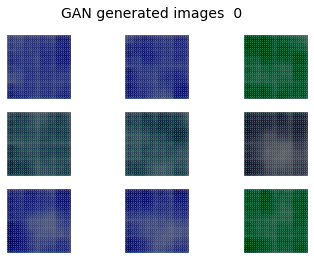

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 15ms/step


  1%|          | 1/156 [00:00<00:24,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:22,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/156 [00:00<00:22,  6.91it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/156 [00:00<00:22,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 5/156 [00:00<00:21,  7.08it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:00<00:20,  7.18it/s]

1/1 [==============================] - 0s 13ms/step


  4%|▍         | 7/156 [00:00<00:20,  7.17it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:20,  7.09it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:01<00:20,  7.15it/s]

1/1 [==============================] - 0s 13ms/step


  6%|▋         | 10/156 [00:01<00:20,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:20,  7.10it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 12/156 [00:01<00:20,  7.12it/s]

1/1 [==============================] - 0s 13ms/step


  8%|▊         | 13/156 [00:01<00:19,  7.21it/s]

1/1 [==============================] - 0s 16ms/step


  9%|▉         | 14/156 [00:01<00:19,  7.25it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:19,  7.24it/s]

1/1 [==============================] - 0s 18ms/step


 10%|█         | 16/156 [00:02<00:19,  7.12it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:19,  7.26it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 18/156 [00:02<00:18,  7.28it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 19/156 [00:02<00:19,  7.09it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:02<00:18,  7.17it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:02<00:18,  7.24it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 22/156 [00:03<00:18,  7.20it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:18,  7.27it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 24/156 [00:03<00:18,  7.13it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 25/156 [00:03<00:18,  7.10it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 26/156 [00:03<00:18,  7.06it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 27/156 [00:03<00:18,  7.08it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 28/156 [00:03<00:18,  7.02it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:18,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.99it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:17,  7.06it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:04<00:17,  7.12it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 33/156 [00:04<00:17,  7.04it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 34/156 [00:04<00:17,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 22%|██▏       | 35/156 [00:04<00:17,  6.99it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 36/156 [00:05<00:17,  7.00it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▎       | 37/156 [00:05<00:17,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▍       | 38/156 [00:05<00:17,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:05<00:16,  7.01it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 40/156 [00:05<00:16,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:05<00:16,  7.09it/s]

1/1 [==============================] - 0s 13ms/step


 27%|██▋       | 42/156 [00:05<00:15,  7.16it/s]

1/1 [==============================] - 0s 13ms/step


 28%|██▊       | 43/156 [00:06<00:16,  7.04it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:06<00:16,  6.86it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:16,  6.86it/s]

1/1 [==============================] - 0s 13ms/step


 29%|██▉       | 46/156 [00:06<00:15,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:06<00:15,  7.04it/s]

1/1 [==============================] - 0s 13ms/step


 31%|███       | 48/156 [00:06<00:15,  7.15it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 49/156 [00:06<00:15,  7.02it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 50/156 [00:07<00:15,  6.96it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 51/156 [00:07<00:15,  6.87it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 52/156 [00:07<00:14,  6.98it/s]

1/1 [==============================] - 0s 13ms/step


 34%|███▍      | 53/156 [00:07<00:14,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▍      | 54/156 [00:07<00:14,  6.93it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:07<00:14,  6.81it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 56/156 [00:07<00:14,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.97it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:08<00:13,  7.05it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 59/156 [00:08<00:13,  7.09it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:08<00:13,  7.11it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 61/156 [00:08<00:13,  7.05it/s]

1/1 [==============================] - 0s 18ms/step


 40%|███▉      | 62/156 [00:08<00:13,  7.03it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 63/156 [00:08<00:13,  7.10it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 64/156 [00:09<00:12,  7.16it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 65/156 [00:09<00:12,  7.11it/s]

1/1 [==============================] - 0s 18ms/step


 42%|████▏     | 66/156 [00:09<00:12,  7.05it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 67/156 [00:09<00:12,  7.11it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 68/156 [00:09<00:12,  6.96it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:09<00:12,  7.08it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 70/156 [00:09<00:12,  7.07it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:10<00:12,  7.06it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:10<00:11,  7.03it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:10<00:11,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 74/156 [00:10<00:11,  6.96it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:10<00:11,  7.03it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:10<00:11,  7.12it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 77/156 [00:10<00:11,  7.05it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:11<00:11,  7.07it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:11<00:10,  7.03it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 80/156 [00:11<00:10,  6.91it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 81/156 [00:11<00:10,  6.94it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:11<00:10,  6.90it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:11<00:10,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 84/156 [00:11<00:10,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  6.98it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:12<00:09,  7.04it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 87/156 [00:12<00:09,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:12<00:09,  7.04it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 89/156 [00:12<00:09,  7.04it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:12<00:09,  7.02it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 91/156 [00:12<00:09,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


 59%|█████▉    | 92/156 [00:13<00:09,  7.00it/s]

1/1 [==============================] - 0s 14ms/step


 60%|█████▉    | 93/156 [00:13<00:08,  7.01it/s]

1/1 [==============================] - 0s 17ms/step


 60%|██████    | 94/156 [00:13<00:08,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:13<00:08,  6.99it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 96/156 [00:13<00:08,  7.05it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:13<00:08,  6.98it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:13<00:08,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 99/156 [00:14<00:08,  6.88it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 100/156 [00:14<00:08,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 101/156 [00:14<00:08,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:14<00:07,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:14<00:07,  6.92it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 104/156 [00:14<00:07,  6.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 105/156 [00:14<00:07,  6.95it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 106/156 [00:15<00:07,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▊   | 107/156 [00:15<00:07,  6.95it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 108/156 [00:15<00:07,  6.85it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:15<00:06,  6.88it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:15<00:06,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 111/156 [00:15<00:06,  6.86it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 112/156 [00:15<00:06,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:16<00:06,  6.92it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:16<00:06,  6.97it/s]

1/1 [==============================] - 0s 13ms/step


 74%|███████▎  | 115/156 [00:16<00:05,  7.00it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:16<00:05,  6.91it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:16<00:05,  6.92it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:16<00:05,  6.89it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 119/156 [00:16<00:05,  6.98it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 120/156 [00:17<00:05,  7.00it/s]

1/1 [==============================] - 0s 13ms/step


 78%|███████▊  | 121/156 [00:17<00:05,  6.91it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 122/156 [00:17<00:04,  6.93it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 123/156 [00:17<00:04,  6.94it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 124/156 [00:17<00:04,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:17<00:04,  6.98it/s]

1/1 [==============================] - 0s 13ms/step


 81%|████████  | 126/156 [00:17<00:04,  7.04it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 127/156 [00:18<00:04,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:18<00:03,  7.04it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:18<00:03,  6.98it/s]

1/1 [==============================] - 0s 13ms/step


 83%|████████▎ | 130/156 [00:18<00:03,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:18<00:03,  6.94it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:18<00:03,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 133/156 [00:18<00:03,  7.05it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:19<00:03,  7.06it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:19<00:03,  6.98it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 136/156 [00:19<00:02,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 137/156 [00:19<00:02,  7.04it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:19<00:02,  7.05it/s]

1/1 [==============================] - 0s 13ms/step


 89%|████████▉ | 139/156 [00:19<00:02,  7.12it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 140/156 [00:19<00:02,  7.11it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:20<00:02,  7.10it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 142/156 [00:20<00:01,  7.03it/s]

1/1 [==============================] - 0s 13ms/step


 92%|█████████▏| 143/156 [00:20<00:01,  7.03it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 144/156 [00:20<00:01,  6.95it/s]

1/1 [==============================] - 0s 14ms/step


 93%|█████████▎| 145/156 [00:20<00:01,  7.00it/s]

1/1 [==============================] - 0s 13ms/step


 94%|█████████▎| 146/156 [00:20<00:01,  6.98it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:20<00:01,  7.04it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 148/156 [00:21<00:01,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:21<00:00,  7.05it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 150/156 [00:21<00:00,  6.98it/s]

1/1 [==============================] - 0s 14ms/step


 97%|█████████▋| 151/156 [00:21<00:00,  7.03it/s]

1/1 [==============================] - 0s 13ms/step


 97%|█████████▋| 152/156 [00:21<00:00,  7.00it/s]

1/1 [==============================] - 0s 14ms/step


 98%|█████████▊| 153/156 [00:21<00:00,  6.99it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:21<00:00,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:22<00:00,  7.04it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 156/156 [00:22<00:00,  7.01it/s]


1/1 [==============================] - 0s 18ms/step


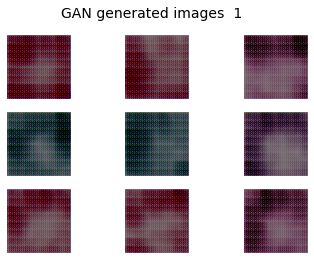

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:23,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


  1%|▏         | 2/156 [00:00<00:23,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:22,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 5/156 [00:00<00:22,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 6/156 [00:00<00:22,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:22,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:01<00:21,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 10/156 [00:01<00:21,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 11/156 [00:01<00:21,  6.76it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 12/156 [00:01<00:21,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:01<00:21,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 14/156 [00:02<00:21,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:20,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 10%|█         | 16/156 [00:02<00:20,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:02<00:20,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 18/156 [00:02<00:20,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 19/156 [00:02<00:20,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 20/156 [00:02<00:20,  6.75it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:19,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 22/156 [00:03<00:19,  6.85it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 23/156 [00:03<00:19,  6.84it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 24/156 [00:03<00:19,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:03<00:19,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:03<00:19,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 18%|█▊        | 28/156 [00:04<00:18,  6.85it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:18,  6.88it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.55it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:04<00:20,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:04<00:20,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:34,  3.56it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:05<00:30,  3.93it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:05<00:28,  4.28it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:25,  4.66it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 38/156 [00:06<00:23,  4.98it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 39/156 [00:06<00:22,  5.11it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 40/156 [00:06<00:22,  5.18it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 41/156 [00:06<00:22,  5.04it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:22,  5.11it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 43/156 [00:07<00:21,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:07<00:21,  5.29it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:20,  5.30it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 46/156 [00:07<00:19,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 47/156 [00:07<00:19,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 48/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.01it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 50/156 [00:08<00:16,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:08<00:16,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 35%|███▍      | 54/156 [00:08<00:15,  6.48it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 55/156 [00:09<00:15,  6.60it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:15,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:09<00:14,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:09<00:14,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:09<00:14,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 61/156 [00:09<00:13,  6.86it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:10<00:13,  6.91it/s]

1/1 [==============================] - 0s 13ms/step


 40%|████      | 63/156 [00:10<00:13,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 64/156 [00:10<00:13,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:13,  6.87it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:10<00:12,  6.94it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:12,  6.91it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:10<00:12,  6.99it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:11<00:12,  6.96it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 70/156 [00:11<00:12,  6.95it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:11<00:12,  6.97it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 72/156 [00:11<00:12,  6.82it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.77it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 75/156 [00:12<00:12,  6.68it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:12<00:11,  6.72it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 77/156 [00:12<00:11,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:12<00:11,  6.75it/s]

1/1 [==============================] - 0s 18ms/step


 51%|█████     | 79/156 [00:12<00:11,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:13<00:10,  6.94it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:13<00:10,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:13<00:10,  6.76it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 85/156 [00:13<00:10,  6.61it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 86/156 [00:13<00:10,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:14<00:09,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:14<00:09,  6.85it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 91/156 [00:14<00:09,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:09,  6.81it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.89it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.87it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 95/156 [00:14<00:08,  6.87it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 96/156 [00:15<00:08,  6.88it/s]

1/1 [==============================] - 0s 13ms/step


 62%|██████▏   | 97/156 [00:15<00:08,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 98/156 [00:15<00:08,  6.88it/s]

1/1 [==============================] - 0s 13ms/step


 63%|██████▎   | 99/156 [00:15<00:08,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 101/156 [00:15<00:07,  6.98it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:15<00:07,  6.93it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:16<00:07,  6.94it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:16<00:07,  6.93it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:16<00:07,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:16<00:07,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 109/156 [00:17<00:06,  6.90it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:17<00:06,  6.87it/s]

1/1 [==============================] - 0s 14ms/step


 71%|███████   | 111/156 [00:17<00:06,  6.90it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 112/156 [00:17<00:06,  6.85it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 113/156 [00:17<00:06,  6.87it/s]

1/1 [==============================] - 0s 18ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.93it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:17<00:05,  6.98it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:18<00:05,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:18<00:05,  6.97it/s]

1/1 [==============================] - 0s 22ms/step


 76%|███████▌  | 118/156 [00:18<00:05,  6.80it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 119/156 [00:18<00:05,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 120/156 [00:18<00:05,  6.92it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.96it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:18<00:04,  6.94it/s]

1/1 [==============================] - 0s 13ms/step


 79%|███████▉  | 123/156 [00:19<00:04,  7.02it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 124/156 [00:19<00:04,  6.94it/s]

1/1 [==============================] - 0s 14ms/step


 80%|████████  | 125/156 [00:19<00:04,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:19<00:04,  6.97it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:19<00:04,  7.03it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 128/156 [00:19<00:03,  7.05it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:19<00:03,  7.02it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:20<00:03,  6.98it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.93it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.99it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 133/156 [00:20<00:03,  7.00it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.97it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.91it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:20<00:02,  6.88it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:21<00:02,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 140/156 [00:21<00:02,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:21<00:02,  6.54it/s]

1/1 [==============================] - 0s 18ms/step


 91%|█████████ | 142/156 [00:21<00:02,  6.65it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 143/156 [00:21<00:01,  6.79it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  6.87it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▍| 147/156 [00:22<00:01,  6.73it/s]

1/1 [==============================] - 0s 13ms/step


 95%|█████████▍| 148/156 [00:22<00:01,  6.71it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:22<00:01,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:22<00:00,  6.78it/s]

1/1 [==============================] - 0s 18ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.60it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  6.58it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▊| 154/156 [00:23<00:00,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▉| 155/156 [00:23<00:00,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:23<00:00,  6.53it/s]

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 18ms/step


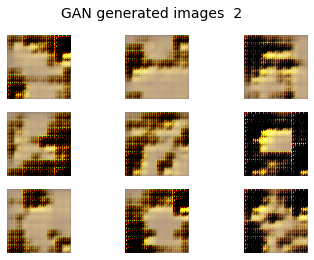

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:24,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:22,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:00<00:22,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 7/156 [00:01<00:21,  6.79it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.63it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:22,  6.40it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.36it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.43it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:21,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:21,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 17/156 [00:02<00:21,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 18/156 [00:02<00:20,  6.65it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 19/156 [00:02<00:20,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 20/156 [00:03<00:20,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 21/156 [00:03<00:20,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 14%|█▍        | 22/156 [00:03<00:20,  6.60it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 24/156 [00:03<00:19,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:03<00:19,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 26/156 [00:03<00:19,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:18,  6.63it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 31/156 [00:04<00:18,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:04<00:18,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 33/156 [00:05<00:18,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:18,  6.71it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:17,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 38/156 [00:05<00:17,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


 25%|██▌       | 39/156 [00:05<00:17,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:17,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:16,  6.84it/s]

1/1 [==============================] - 0s 14ms/step


 27%|██▋       | 42/156 [00:06<00:16,  6.81it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:06<00:16,  6.66it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 45/156 [00:06<00:16,  6.67it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:06<00:16,  6.69it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:07<00:16,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 48/156 [00:07<00:15,  6.79it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:07<00:15,  6.76it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.59it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 51/156 [00:07<00:15,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 52/156 [00:07<00:15,  6.72it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 53/156 [00:07<00:15,  6.71it/s]

1/1 [==============================] - 0s 13ms/step


 35%|███▍      | 54/156 [00:08<00:15,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:08<00:14,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:08<00:14,  6.89it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 57/156 [00:08<00:14,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:08<00:14,  6.75it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 59/156 [00:08<00:14,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 61/156 [00:09<00:13,  6.81it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 62/156 [00:09<00:13,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 40%|████      | 63/156 [00:09<00:13,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:09<00:13,  6.77it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:09<00:13,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 66/156 [00:09<00:13,  6.78it/s]

1/1 [==============================] - 0s 14ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 68/156 [00:10<00:12,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▍     | 69/156 [00:10<00:12,  6.86it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 70/156 [00:10<00:12,  6.83it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:10<00:12,  6.79it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:10<00:12,  6.74it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 73/156 [00:10<00:12,  6.75it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.82it/s]

1/1 [==============================] - 0s 16ms/step


 48%|████▊     | 75/156 [00:11<00:11,  6.88it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:11<00:11,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 77/156 [00:11<00:11,  6.80it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:11<00:11,  6.79it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 79/156 [00:11<00:11,  6.78it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 80/156 [00:11<00:11,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 82/156 [00:12<00:10,  6.80it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 83/156 [00:12<00:10,  6.82it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 84/156 [00:12<00:10,  6.76it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:12<00:10,  6.76it/s]

1/1 [==============================] - 0s 14ms/step


 55%|█████▌    | 86/156 [00:12<00:10,  6.82it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.68it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:13<00:09,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 90/156 [00:13<00:09,  6.77it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 91/156 [00:13<00:09,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:13<00:09,  6.72it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:13<00:09,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.76it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:14<00:08,  6.74it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:14<00:08,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 98/156 [00:14<00:08,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 99/156 [00:14<00:08,  6.73it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:14<00:08,  6.78it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.84it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 102/156 [00:15<00:07,  6.76it/s]

1/1 [==============================] - 0s 17ms/step


 66%|██████▌   | 103/156 [00:15<00:07,  6.71it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 104/156 [00:15<00:07,  6.70it/s]

1/1 [==============================] - 0s 17ms/step


 67%|██████▋   | 105/156 [00:15<00:07,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:15<00:07,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▊   | 107/156 [00:15<00:07,  6.83it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.79it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:16<00:06,  6.83it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 110/156 [00:16<00:06,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 111/156 [00:16<00:06,  6.57it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 112/156 [00:16<00:06,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:16<00:06,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.67it/s]

1/1 [==============================] - 0s 18ms/step


 74%|███████▎  | 115/156 [00:17<00:06,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 74%|███████▍  | 116/156 [00:17<00:06,  6.50it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:17<00:05,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 118/156 [00:17<00:05,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 119/156 [00:17<00:05,  6.55it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:17<00:05,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 122/156 [00:18<00:05,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 123/156 [00:18<00:04,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:18<00:04,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 125/156 [00:18<00:04,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:18<00:04,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████▏ | 127/156 [00:18<00:04,  6.74it/s]

1/1 [==============================] - 0s 14ms/step


 82%|████████▏ | 128/156 [00:19<00:04,  6.73it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 129/156 [00:19<00:04,  6.69it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 130/156 [00:19<00:04,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:19<00:03,  6.64it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 132/156 [00:19<00:03,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 133/156 [00:19<00:03,  6.68it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:20<00:03,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 137/156 [00:20<00:02,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 138/156 [00:20<00:02,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:20<00:02,  6.61it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 140/156 [00:20<00:02,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 141/156 [00:21<00:02,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:21<00:02,  6.70it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:21<00:01,  6.73it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 144/156 [00:21<00:01,  6.74it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 145/156 [00:21<00:01,  6.73it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:21<00:01,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▍| 147/156 [00:22<00:01,  6.67it/s]

1/1 [==============================] - 0s 14ms/step


 95%|█████████▍| 148/156 [00:22<00:01,  6.64it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 149/156 [00:22<00:01,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:22<00:00,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:22<00:00,  6.57it/s]

1/1 [==============================] - 0s 17ms/step


 97%|█████████▋| 152/156 [00:22<00:00,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 153/156 [00:22<00:00,  6.53it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 154/156 [00:23<00:00,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:23<00:00,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 156/156 [00:23<00:00,  6.67it/s]


1/1 [==============================] - 0s 21ms/step


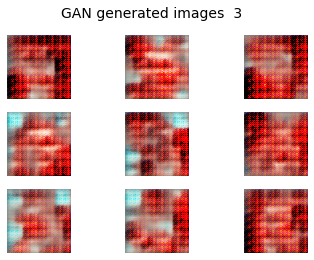

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 1/156 [00:00<00:26,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.45it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.60it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:01<00:22,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 10/156 [00:01<00:21,  6.69it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 11/156 [00:01<00:21,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:21,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 13/156 [00:02<00:21,  6.69it/s]

1/1 [==============================] - 0s 14ms/step


  9%|▉         | 14/156 [00:02<00:21,  6.60it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:21,  6.65it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:20,  6.65it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 18/156 [00:02<00:20,  6.67it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 19/156 [00:02<00:20,  6.68it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:03<00:20,  6.67it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 21/156 [00:03<00:20,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:20,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.47it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:03<00:21,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.50it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:19,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 20%|█▉        | 31/156 [00:04<00:19,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 32/156 [00:04<00:18,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:18,  6.56it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:18,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 35/156 [00:05<00:18,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.56it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 38/156 [00:05<00:18,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:06<00:17,  6.55it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.29it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.38it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 44/156 [00:06<00:17,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:17,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 46/156 [00:07<00:16,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 30%|███       | 47/156 [00:07<00:16,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 31%|███       | 48/156 [00:07<00:16,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███▏      | 49/156 [00:07<00:15,  6.71it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 51/156 [00:07<00:16,  6.51it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 52/156 [00:08<00:15,  6.52it/s]

1/1 [==============================] - 0s 17ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.69it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:15,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 36%|███▌      | 56/156 [00:08<00:15,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:08<00:15,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:08<00:15,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 59/156 [00:09<00:14,  6.53it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:09<00:14,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:09<00:14,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:09<00:13,  6.67it/s]

1/1 [==============================] - 0s 16ms/step


 41%|████      | 64/156 [00:09<00:13,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.49it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:10<00:13,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 69/156 [00:10<00:13,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 70/156 [00:10<00:12,  6.64it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 71/156 [00:10<00:12,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:11<00:12,  6.66it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.71it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.64it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 76/156 [00:11<00:12,  6.58it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:11<00:11,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:11<00:11,  6.74it/s]

1/1 [==============================] - 0s 13ms/step


 51%|█████     | 79/156 [00:12<00:11,  6.88it/s]

1/1 [==============================] - 0s 14ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.81it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.68it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.69it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:12<00:11,  6.49it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 84/156 [00:12<00:11,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:13<00:10,  6.49it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.33it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:13<00:10,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 91/156 [00:13<00:10,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:14<00:09,  6.45it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.63it/s]

1/1 [==============================] - 0s 14ms/step


 62%|██████▏   | 96/156 [00:14<00:09,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:14<00:08,  6.64it/s]

1/1 [==============================] - 0s 18ms/step


 63%|██████▎   | 98/156 [00:15<00:08,  6.72it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 99/156 [00:15<00:08,  6.71it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.73it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:15<00:08,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 66%|██████▌   | 103/156 [00:15<00:08,  6.35it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:16<00:08,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:16<00:09,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


 69%|██████▊   | 107/156 [00:16<00:08,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 108/156 [00:16<00:08,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:16<00:08,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:17<00:08,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 111/156 [00:17<00:08,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:17<00:08,  5.48it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 113/156 [00:17<00:07,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:17<00:07,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:18<00:07,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 116/156 [00:18<00:07,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 75%|███████▌  | 117/156 [00:18<00:07,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:18<00:06,  5.52it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:18<00:06,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 77%|███████▋  | 120/156 [00:18<00:06,  5.44it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 121/156 [00:19<00:06,  5.49it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 122/156 [00:19<00:06,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:19<00:05,  5.55it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 125/156 [00:19<00:05,  5.65it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████  | 126/156 [00:20<00:05,  5.82it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  6.30it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  6.47it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  6.53it/s]

1/1 [==============================] - 0s 15ms/step


 90%|█████████ | 141/156 [00:22<00:02,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:22<00:02,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:22<00:02,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:22<00:01,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  6.36it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 146/156 [00:23<00:01,  6.41it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.41it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 96%|█████████▌| 150/156 [00:23<00:00,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:24<00:00,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  6.34it/s]

1/1 [==============================] - 0s 18ms/step


100%|██████████| 156/156 [00:24<00:00,  6.33it/s]


1/1 [==============================] - 0s 21ms/step


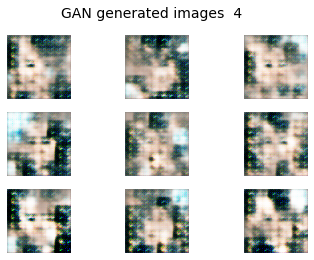

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/156 [00:00<00:26,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:23,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 4/156 [00:00<00:23,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 7/156 [00:01<00:22,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.54it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 9/156 [00:01<00:22,  6.66it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▋         | 10/156 [00:01<00:21,  6.65it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:21,  6.59it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:21,  6.63it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:02<00:21,  6.55it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:21,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:22,  6.37it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 16/156 [00:02<00:21,  6.38it/s]

1/1 [==============================] - 0s 17ms/step


 11%|█         | 17/156 [00:02<00:21,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.51it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 19/156 [00:02<00:21,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 20/156 [00:03<00:20,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:20,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▍        | 23/156 [00:03<00:20,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 16%|█▌        | 25/156 [00:03<00:20,  6.41it/s]

1/1 [==============================] - 0s 13ms/step


 17%|█▋        | 26/156 [00:04<00:19,  6.56it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:19,  6.59it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:19,  6.55it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 29/156 [00:04<00:19,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 30/156 [00:04<00:19,  6.59it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 31/156 [00:04<00:18,  6.62it/s]

1/1 [==============================] - 0s 16ms/step


 21%|██        | 32/156 [00:04<00:19,  6.51it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 33/156 [00:05<00:18,  6.57it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 24%|██▎       | 37/156 [00:05<00:18,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 38/156 [00:05<00:17,  6.61it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:06<00:17,  6.60it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 40/156 [00:06<00:17,  6.62it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▋       | 41/156 [00:06<00:17,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.69it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:06<00:17,  6.50it/s]

1/1 [==============================] - 0s 14ms/step


 28%|██▊       | 44/156 [00:06<00:18,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 45/156 [00:06<00:17,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:17,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 48/156 [00:07<00:17,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:07<00:16,  6.35it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 50/156 [00:07<00:16,  6.46it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:07<00:15,  6.58it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 52/156 [00:08<00:15,  6.57it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 53/156 [00:08<00:15,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▍      | 54/156 [00:08<00:15,  6.41it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:15,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 36%|███▌      | 56/156 [00:08<00:15,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:08<00:15,  6.40it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 58/156 [00:08<00:15,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 59/156 [00:09<00:14,  6.51it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 60/156 [00:09<00:14,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:09<00:14,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 40%|███▉      | 62/156 [00:09<00:14,  6.58it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:09<00:14,  6.50it/s]

1/1 [==============================] - 0s 14ms/step


 41%|████      | 64/156 [00:09<00:14,  6.52it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 66/156 [00:10<00:13,  6.43it/s]

1/1 [==============================] - 0s 13ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.48it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 69/156 [00:10<00:13,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 45%|████▍     | 70/156 [00:10<00:13,  6.46it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 71/156 [00:10<00:13,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.49it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:11<00:12,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:11<00:12,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.54it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:12<00:11,  6.44it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 83/156 [00:12<00:11,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.44it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:13<00:10,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:13<00:10,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 56%|█████▋    | 88/156 [00:13<00:10,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:13<00:10,  6.35it/s]

1/1 [==============================] - 0s 14ms/step


 58%|█████▊    | 90/156 [00:13<00:10,  6.31it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:14<00:09,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 95/156 [00:14<00:09,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:14<00:09,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 99/156 [00:15<00:09,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:15<00:09,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:15<00:08,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:15<00:08,  6.32it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 105/156 [00:16<00:08,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:16<00:07,  6.43it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▉   | 108/156 [00:16<00:07,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:16<00:07,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.42it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 111/156 [00:17<00:07,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 112/156 [00:17<00:07,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:17<00:06,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 73%|███████▎  | 114/156 [00:17<00:06,  6.50it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 115/156 [00:17<00:06,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:18<00:05,  6.53it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▌  | 118/156 [00:18<00:05,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▋  | 119/156 [00:18<00:05,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:18<00:05,  6.38it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:18<00:05,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 78%|███████▊  | 122/156 [00:18<00:05,  6.42it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  6.41it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:19<00:04,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:19<00:04,  6.50it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:19<00:04,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:19<00:04,  6.45it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:19<00:04,  6.57it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  6.54it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:20<00:03,  6.60it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:20<00:03,  6.48it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▍ | 132/156 [00:20<00:03,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 85%|████████▌ | 133/156 [00:20<00:03,  6.55it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:20<00:03,  6.44it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:20<00:03,  6.56it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.62it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:21<00:02,  6.61it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 138/156 [00:21<00:02,  6.64it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:21<00:02,  6.66it/s]

1/1 [==============================] - 0s 13ms/step


 90%|████████▉ | 140/156 [00:21<00:02,  6.65it/s]

1/1 [==============================] - 0s 16ms/step


 90%|█████████ | 141/156 [00:21<00:02,  6.59it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:22<00:03,  4.58it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:22<00:02,  5.00it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:22<00:02,  5.38it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 145/156 [00:22<00:01,  5.66it/s]

1/1 [==============================] - 0s 14ms/step


 94%|█████████▎| 146/156 [00:22<00:01,  5.83it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 150/156 [00:23<00:00,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 151/156 [00:23<00:00,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:23<00:00,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 153/156 [00:23<00:00,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  6.32it/s]

1/1 [==============================] - 0s 14ms/step


100%|██████████| 156/156 [00:24<00:00,  6.38it/s]


1/1 [==============================] - 0s 27ms/step


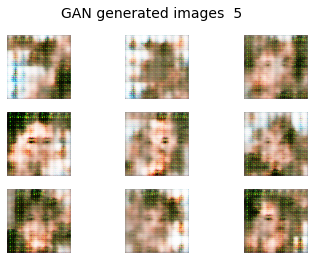

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/156 [00:00<00:25,  5.98it/s]

1/1 [==============================] - 0s 14ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


  2%|▏         | 3/156 [00:00<00:25,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.47it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 7/156 [00:01<00:22,  6.58it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:22,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


  6%|▌         | 9/156 [00:01<00:22,  6.43it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:22,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:22,  6.47it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 12/156 [00:01<00:22,  6.44it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 13/156 [00:02<00:22,  6.48it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 14/156 [00:02<00:22,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 10%|▉         | 15/156 [00:02<00:21,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 10%|█         | 16/156 [00:02<00:21,  6.52it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 17/156 [00:02<00:21,  6.42it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 18/156 [00:02<00:21,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 19/156 [00:02<00:21,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 20/156 [00:03<00:21,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 15%|█▌        | 24/156 [00:03<00:20,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:03<00:20,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:04<00:20,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 32/156 [00:05<00:20,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:19,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▎       | 37/156 [00:05<00:19,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 43/156 [00:06<00:18,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 44/156 [00:06<00:18,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:07<00:17,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 48/156 [00:07<00:17,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:07<00:17,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


 32%|███▏      | 50/156 [00:07<00:17,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 35%|███▌      | 55/156 [00:08<00:16,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:08<00:16,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 57/156 [00:09<00:15,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 58/156 [00:09<00:15,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 62/156 [00:09<00:15,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:10<00:14,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:10<00:15,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 65/156 [00:10<00:15,  6.03it/s]

1/1 [==============================] - 0s 13ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:14,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▎     | 68/156 [00:10<00:14,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.42it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.46it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:11<00:12,  6.45it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.46it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:11<00:12,  6.38it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:12<00:12,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.42it/s]

1/1 [==============================] - 0s 17ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 52%|█████▏    | 81/156 [00:12<00:11,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:11,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:13<00:11,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:14<00:10,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:14<00:09,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:15<00:09,  6.29it/s]

1/1 [==============================] - 0s 14ms/step


 61%|██████    | 95/156 [00:15<00:09,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 99/156 [00:15<00:09,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:15<00:08,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▍   | 101/156 [00:16<00:08,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.42it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:16<00:08,  6.37it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:16<00:07,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 107/156 [00:17<00:07,  6.43it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 111/156 [00:17<00:07,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:17<00:07,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 72%|███████▏  | 113/156 [00:18<00:06,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 75%|███████▌  | 117/156 [00:18<00:06,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 118/156 [00:18<00:06,  6.30it/s]

1/1 [==============================] - 0s 23ms/step


 76%|███████▋  | 119/156 [00:18<00:06,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.21it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:19<00:05,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 80%|████████  | 125/156 [00:19<00:04,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:20<00:05,  5.67it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  5.75it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  5.73it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  5.91it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 131/156 [00:20<00:04,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:21<00:03,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 138/156 [00:22<00:02,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:22<00:02,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:22<00:02,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 143/156 [00:22<00:02,  5.73it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 144/156 [00:23<00:02,  5.52it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 145/156 [00:23<00:02,  5.38it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 146/156 [00:23<00:01,  5.23it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  5.31it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  5.33it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 150/156 [00:24<00:01,  5.36it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  5.26it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 98%|█████████▊| 153/156 [00:24<00:00,  5.15it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  5.36it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:25<00:00,  6.13it/s]


1/1 [==============================] - 0s 33ms/step


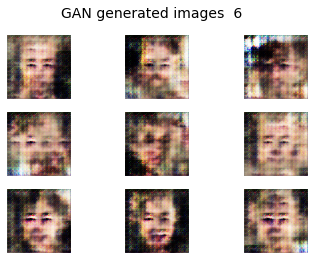

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 37ms/step


  1%|          | 1/156 [00:00<00:31,  4.97it/s]

1/1 [==============================] - 0s 29ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.25it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 3/156 [00:00<00:31,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 4/156 [00:00<00:30,  4.96it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:29,  5.06it/s]

1/1 [==============================] - 0s 17ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 16ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  6%|▋         | 10/156 [00:01<00:24,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


  8%|▊         | 12/156 [00:02<00:23,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.15it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:22,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:22,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:02<00:22,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 18/156 [00:03<00:22,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 15%|█▌        | 24/156 [00:04<00:21,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 16%|█▌        | 25/156 [00:04<00:20,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.37it/s]

1/1 [==============================] - 0s 15ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 19%|█▉        | 30/156 [00:05<00:20,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 32/156 [00:05<00:19,  6.33it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 33/156 [00:05<00:19,  6.16it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.32it/s]

1/1 [==============================] - 0s 17ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.40it/s]

1/1 [==============================] - 0s 18ms/step


 24%|██▎       | 37/156 [00:06<00:18,  6.41it/s]

1/1 [==============================] - 0s 15ms/step


 24%|██▍       | 38/156 [00:06<00:18,  6.51it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 39/156 [00:06<00:18,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 41/156 [00:06<00:17,  6.40it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.44it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 43/156 [00:07<00:17,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:17,  6.49it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 45/156 [00:07<00:16,  6.53it/s]

1/1 [==============================] - 0s 14ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.39it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:07<00:17,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 48/156 [00:07<00:17,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 31%|███▏      | 49/156 [00:07<00:17,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:08<00:16,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 33%|███▎      | 51/156 [00:08<00:16,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.31it/s]

1/1 [==============================] - 0s 14ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.22it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 35%|███▌      | 55/156 [00:08<00:16,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 37%|███▋      | 57/156 [00:09<00:15,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 58/156 [00:09<00:15,  6.27it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 40%|███▉      | 62/156 [00:10<00:14,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 63/156 [00:10<00:14,  6.40it/s]

1/1 [==============================] - 0s 19ms/step


 41%|████      | 64/156 [00:10<00:14,  6.52it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 66/156 [00:10<00:13,  6.47it/s]

1/1 [==============================] - 0s 15ms/step


 43%|████▎     | 67/156 [00:10<00:13,  6.37it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▎     | 68/156 [00:10<00:13,  6.48it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 69/156 [00:11<00:13,  6.47it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.52it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 71/156 [00:11<00:12,  6.60it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.38it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 74/156 [00:11<00:12,  6.38it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:12<00:12,  6.43it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:12<00:13,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 51%|█████▏    | 80/156 [00:12<00:11,  6.38it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 81/156 [00:13<00:11,  6.36it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 82/156 [00:13<00:11,  6.42it/s]

1/1 [==============================] - 0s 14ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.38it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.33it/s]

1/1 [==============================] - 0s 16ms/step


 55%|█████▌    | 86/156 [00:13<00:11,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▌    | 87/156 [00:13<00:11,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▋    | 88/156 [00:14<00:10,  6.39it/s]

1/1 [==============================] - 0s 15ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.35it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.39it/s]

1/1 [==============================] - 0s 14ms/step


 59%|█████▉    | 92/156 [00:14<00:10,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 60%|█████▉    | 93/156 [00:14<00:10,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 61%|██████    | 95/156 [00:15<00:09,  6.23it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 99/156 [00:15<00:09,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 64%|██████▍   | 100/156 [00:16<00:08,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▍   | 101/156 [00:16<00:08,  6.34it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.39it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 67%|██████▋   | 105/156 [00:16<00:08,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▊   | 107/156 [00:17<00:07,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.30it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 110/156 [00:17<00:07,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 111/156 [00:17<00:07,  6.35it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 112/156 [00:17<00:07,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:18<00:06,  6.32it/s]

1/1 [==============================] - 0s 16ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.32it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.24it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▍  | 116/156 [00:18<00:06,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:18<00:06,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 118/156 [00:18<00:06,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 119/156 [00:19<00:05,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 123/156 [00:19<00:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:19<00:05,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.25it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:20<00:04,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 130/156 [00:20<00:04,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  5.97it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:21<00:03,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 87%|████████▋ | 136/156 [00:21<00:03,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  6.18it/s]

1/1 [==============================] - 0s 17ms/step


 88%|████████▊ | 138/156 [00:22<00:02,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:22<00:02,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 142/156 [00:22<00:02,  6.18it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.27it/s]

1/1 [==============================] - 0s 14ms/step


 92%|█████████▏| 144/156 [00:23<00:01,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


 93%|█████████▎| 145/156 [00:23<00:01,  6.39it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 146/156 [00:23<00:01,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 147/156 [00:23<00:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 95%|█████████▍| 148/156 [00:23<00:01,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:23<00:01,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.33it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  6.34it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  6.29it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:24<00:00,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 99%|█████████▊| 154/156 [00:24<00:00,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▉| 155/156 [00:24<00:00,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 156/156 [00:25<00:00,  6.22it/s]


1/1 [==============================] - 0s 35ms/step


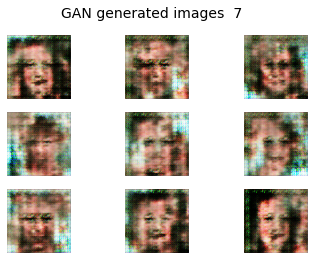

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 1/156 [00:00<00:26,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.26it/s]

1/1 [==============================] - 0s 14ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.26it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.35it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


  7%|▋         | 11/156 [00:01<00:24,  6.04it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 12/156 [00:01<00:23,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.02it/s]

1/1 [==============================] - 0s 16ms/step


 10%|▉         | 15/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 11%|█         | 17/156 [00:02<00:23,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 12%|█▏        | 18/156 [00:02<00:23,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 12%|█▏        | 19/156 [00:03<00:22,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 20/156 [00:03<00:22,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 16%|█▌        | 25/156 [00:04<00:20,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 18%|█▊        | 28/156 [00:04<00:20,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.27it/s]

1/1 [==============================] - 0s 15ms/step


 20%|█▉        | 31/156 [00:05<00:19,  6.34it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:05<00:19,  6.36it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 33/156 [00:05<00:19,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.33it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 23%|██▎       | 36/156 [00:05<00:18,  6.32it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 25%|██▌       | 39/156 [00:06<00:18,  6.22it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 43/156 [00:06<00:18,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 30%|███       | 47/156 [00:07<00:17,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 48/156 [00:07<00:17,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:07<00:17,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:08<00:16,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 39%|███▉      | 61/156 [00:09<00:15,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.25it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:15,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 41%|████      | 64/156 [00:10<00:15,  6.02it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:15,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 43%|████▎     | 67/156 [00:10<00:14,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▎     | 68/156 [00:11<00:14,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 44%|████▍     | 69/156 [00:11<00:13,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 45%|████▍     | 70/156 [00:11<00:13,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  6.08it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.14it/s]

1/1 [==============================] - 0s 22ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:14<00:10,  6.29it/s]

1/1 [==============================] - 0s 16ms/step


 57%|█████▋    | 89/156 [00:14<00:10,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 61%|██████    | 95/156 [00:15<00:09,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.31it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 98/156 [00:15<00:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 104/156 [00:16<00:08,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  5.99it/s]

1/1 [==============================] - 0s 15ms/step


 69%|██████▉   | 108/156 [00:17<00:08,  5.89it/s]

1/1 [==============================] - 0s 15ms/step


 70%|██████▉   | 109/156 [00:17<00:08,  5.76it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 111/156 [00:18<00:08,  5.59it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  5.70it/s]

1/1 [==============================] - 0s 17ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  5.68it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:18<00:07,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▋  | 119/156 [00:19<00:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:19<00:05,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.26it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 128/156 [00:20<00:04,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 134/156 [00:21<00:03,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  5.88it/s]

1/1 [==============================] - 0s 16ms/step


 88%|████████▊ | 138/156 [00:22<00:03,  5.88it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 90%|████████▉ | 140/156 [00:22<00:02,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:23<00:02,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 91%|█████████ | 142/156 [00:23<00:02,  5.79it/s]

1/1 [==============================] - 0s 16ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:23<00:02,  5.87it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 145/156 [00:23<00:01,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  6.00it/s]

1/1 [==============================] - 0s 15ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:24<00:00,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


100%|██████████| 156/156 [00:25<00:00,  6.08it/s]


1/1 [==============================] - 0s 25ms/step


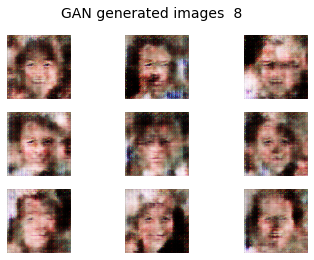

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 1/156 [00:00<00:26,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


  3%|▎         | 4/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 5/156 [00:00<00:25,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:24,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.81it/s]

1/1 [==============================] - 0s 15ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.80it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.87it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:23,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 17/156 [00:02<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.51it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 19/156 [00:03<00:25,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 20/156 [00:03<00:25,  5.41it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 21/156 [00:03<00:25,  5.35it/s]

1/1 [==============================] - 0s 49ms/step


 14%|█▍        | 22/156 [00:03<00:27,  4.90it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 23/156 [00:04<00:27,  4.87it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 24/156 [00:04<00:27,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:26,  4.94it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 26/156 [00:04<00:30,  4.25it/s]

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 27/156 [00:05<00:28,  4.49it/s]

1/1 [==============================] - 0s 53ms/step


 18%|█▊        | 28/156 [00:05<00:29,  4.37it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 29/156 [00:05<00:28,  4.53it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 30/156 [00:05<00:27,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:26,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 32/156 [00:06<00:26,  4.66it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 33/156 [00:06<00:25,  4.83it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 34/156 [00:06<00:27,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 35/156 [00:06<00:25,  4.68it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 36/156 [00:06<00:25,  4.70it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 37/156 [00:07<00:24,  4.77it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 38/156 [00:07<00:25,  4.62it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:07<00:24,  4.80it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:07<00:22,  5.06it/s]

1/1 [==============================] - 0s 16ms/step


 26%|██▋       | 41/156 [00:07<00:21,  5.36it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 42/156 [00:08<00:20,  5.51it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 43/156 [00:08<00:19,  5.67it/s]

1/1 [==============================] - 0s 18ms/step


 28%|██▊       | 44/156 [00:08<00:19,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 45/156 [00:08<00:18,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 46/156 [00:08<00:18,  5.91it/s]

1/1 [==============================] - 0s 16ms/step


 30%|███       | 47/156 [00:08<00:18,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███       | 48/156 [00:09<00:17,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███▏      | 49/156 [00:09<00:17,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 32%|███▏      | 50/156 [00:09<00:17,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 33%|███▎      | 51/156 [00:09<00:16,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 33%|███▎      | 52/156 [00:09<00:16,  6.24it/s]

1/1 [==============================] - 0s 15ms/step


 34%|███▍      | 53/156 [00:09<00:17,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 35%|███▍      | 54/156 [00:10<00:16,  6.12it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:10<00:16,  6.26it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▌      | 56/156 [00:10<00:16,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 57/156 [00:10<00:16,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 37%|███▋      | 58/156 [00:10<00:16,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 59/156 [00:10<00:15,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 60/156 [00:10<00:15,  6.28it/s]

1/1 [==============================] - 0s 15ms/step


 39%|███▉      | 61/156 [00:11<00:15,  6.33it/s]

1/1 [==============================] - 0s 14ms/step


 40%|███▉      | 62/156 [00:11<00:14,  6.35it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:11<00:14,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 41%|████      | 64/156 [00:11<00:14,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 65/156 [00:11<00:14,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:11<00:14,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 67/156 [00:12<00:14,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▎     | 68/156 [00:12<00:14,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 44%|████▍     | 69/156 [00:12<00:14,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 70/156 [00:12<00:13,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 46%|████▌     | 71/156 [00:12<00:13,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 46%|████▌     | 72/156 [00:12<00:13,  6.11it/s]

1/1 [==============================] - 0s 14ms/step


 47%|████▋     | 73/156 [00:13<00:13,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 47%|████▋     | 74/156 [00:13<00:13,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:13<00:13,  5.97it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▊     | 76/156 [00:13<00:12,  6.18it/s]

1/1 [==============================] - 0s 15ms/step


 49%|████▉     | 77/156 [00:13<00:12,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:13<00:12,  6.18it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:14<00:12,  6.11it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████▏    | 80/156 [00:14<00:12,  6.09it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 81/156 [00:14<00:12,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 83/156 [00:14<00:11,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 54%|█████▍    | 84/156 [00:14<00:11,  6.25it/s]

1/1 [==============================] - 0s 16ms/step


 54%|█████▍    | 85/156 [00:15<00:11,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 55%|█████▌    | 86/156 [00:15<00:11,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 89/156 [00:15<00:10,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 90/156 [00:15<00:10,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 91/156 [00:16<00:10,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  6.09it/s]

1/1 [==============================] - 0s 16ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 60%|██████    | 94/156 [00:16<00:10,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 95/156 [00:16<00:09,  6.31it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:16<00:09,  6.19it/s]

1/1 [==============================] - 0s 15ms/step


 62%|██████▏   | 97/156 [00:17<00:09,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▍   | 101/156 [00:17<00:08,  6.21it/s]

1/1 [==============================] - 0s 14ms/step


 65%|██████▌   | 102/156 [00:17<00:08,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:08,  6.16it/s]

1/1 [==============================] - 0s 14ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  6.20it/s]

1/1 [==============================] - 0s 15ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 69%|██████▊   | 107/156 [00:18<00:07,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 69%|██████▉   | 108/156 [00:18<00:07,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:07,  6.19it/s]

1/1 [==============================] - 0s 16ms/step


 71%|███████   | 111/156 [00:19<00:07,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 113/156 [00:19<00:06,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 73%|███████▎  | 114/156 [00:19<00:06,  6.25it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:19<00:06,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  6.14it/s]

1/1 [==============================] - 0s 15ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  6.12it/s]

1/1 [==============================] - 0s 14ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  6.12it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 77%|███████▋  | 120/156 [00:20<00:05,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:20<00:05,  6.29it/s]

1/1 [==============================] - 0s 15ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  6.24it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  6.27it/s]

1/1 [==============================] - 0s 16ms/step


 80%|████████  | 125/156 [00:21<00:04,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.41it/s]

1/1 [==============================] - 0s 14ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.28it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.43it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  6.30it/s]

1/1 [==============================] - 0s 17ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 84%|████████▍ | 131/156 [00:22<00:03,  6.36it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 132/156 [00:22<00:03,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  6.12it/s]

1/1 [==============================] - 0s 15ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  6.12it/s]

1/1 [==============================] - 0s 24ms/step


 88%|████████▊ | 138/156 [00:23<00:02,  6.01it/s]

1/1 [==============================] - 0s 15ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.00it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 90%|█████████ | 141/156 [00:24<00:02,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 91%|█████████ | 142/156 [00:24<00:02,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 144/156 [00:24<00:01,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.23it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  6.15it/s]

1/1 [==============================] - 0s 17ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  6.21it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:25<00:00,  6.26it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.23it/s]

1/1 [==============================] - 0s 13ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  6.21it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:26<00:00,  5.87it/s]


1/1 [==============================] - 0s 24ms/step


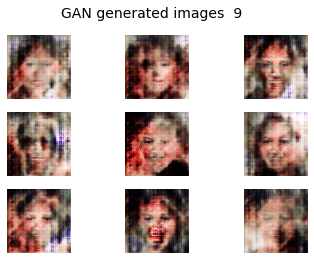

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 1/156 [00:00<00:26,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


  1%|▏         | 2/156 [00:00<00:24,  6.30it/s]

1/1 [==============================] - 0s 18ms/step


  2%|▏         | 3/156 [00:00<00:24,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.07it/s]

1/1 [==============================] - 0s 14ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 12/156 [00:01<00:24,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


 10%|▉         | 15/156 [00:02<00:22,  6.13it/s]

1/1 [==============================] - 0s 15ms/step


 10%|█         | 16/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 11%|█         | 17/156 [00:02<00:22,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 18/156 [00:02<00:22,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.03it/s]

1/1 [==============================] - 0s 15ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.08it/s]

1/1 [==============================] - 0s 14ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 21%|██        | 32/156 [00:05<00:20,  6.02it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:20,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.07it/s]

1/1 [==============================] - 0s 27ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.28it/s]

1/1 [==============================] - 0s 14ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.36it/s]

1/1 [==============================] - 0s 17ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 43/156 [00:07<00:17,  6.30it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:17,  6.25it/s]

1/1 [==============================] - 0s 17ms/step


 29%|██▉       | 45/156 [00:07<00:17,  6.21it/s]

1/1 [==============================] - 0s 16ms/step


 29%|██▉       | 46/156 [00:07<00:17,  6.15it/s]

1/1 [==============================] - 0s 14ms/step


 30%|███       | 47/156 [00:07<00:17,  6.06it/s]

1/1 [==============================] - 0s 14ms/step


 31%|███       | 48/156 [00:07<00:17,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.04it/s]

1/1 [==============================] - 0s 15ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 36%|███▌      | 56/156 [00:09<00:16,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 37%|███▋      | 57/156 [00:09<00:16,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 59/156 [00:09<00:16,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 39%|███▉      | 61/156 [00:10<00:15,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 40%|████      | 63/156 [00:10<00:15,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 41%|████      | 64/156 [00:10<00:15,  5.94it/s]

1/1 [==============================] - 0s 14ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 42%|████▏     | 66/156 [00:10<00:15,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.83it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.96it/s]

1/1 [==============================] - 0s 15ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.95it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 71/156 [00:11<00:14,  6.05it/s]

1/1 [==============================] - 0s 17ms/step


 46%|████▌     | 72/156 [00:11<00:14,  5.98it/s]

1/1 [==============================] - 0s 16ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.00it/s]

1/1 [==============================] - 0s 14ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 49%|████▊     | 76/156 [00:12<00:13,  6.15it/s]

1/1 [==============================] - 0s 16ms/step


 49%|████▉     | 77/156 [00:12<00:12,  6.20it/s]

1/1 [==============================] - 0s 24ms/step


 50%|█████     | 78/156 [00:12<00:12,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 51%|█████     | 79/156 [00:12<00:12,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.21it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 83/156 [00:13<00:12,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 84/156 [00:13<00:11,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 54%|█████▍    | 85/156 [00:13<00:11,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.80it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  5.93it/s]

1/1 [==============================] - 0s 18ms/step


 57%|█████▋    | 89/156 [00:14<00:11,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 58%|█████▊    | 91/156 [00:14<00:10,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  6.07it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:15<00:10,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:15<00:10,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 97/156 [00:15<00:09,  6.03it/s]

1/1 [==============================] - 0s 14ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  5.99it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.14it/s]

1/1 [==============================] - 0s 14ms/step


 64%|██████▍   | 100/156 [00:16<00:08,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▍   | 101/156 [00:16<00:08,  6.30it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 66%|██████▌   | 103/156 [00:16<00:08,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 69%|██████▊   | 107/156 [00:17<00:07,  6.19it/s]

1/1 [==============================] - 0s 17ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.09it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:17<00:07,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:18<00:07,  5.94it/s]

1/1 [==============================] - 0s 16ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 73%|███████▎  | 114/156 [00:18<00:06,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.09it/s]

1/1 [==============================] - 0s 15ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.01it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  6.06it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  5.96it/s]

1/1 [==============================] - 0s 25ms/step


 77%|███████▋  | 120/156 [00:19<00:06,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.03it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  5.98it/s]

1/1 [==============================] - 0s 17ms/step


 80%|████████  | 125/156 [00:20<00:05,  5.91it/s]

1/1 [==============================] - 0s 17ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.04it/s]

1/1 [==============================] - 0s 16ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:21<00:03,  6.20it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▌ | 133/156 [00:21<00:03,  6.26it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.99it/s]

1/1 [==============================] - 0s 14ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  6.02it/s]

1/1 [==============================] - 0s 15ms/step


 88%|████████▊ | 138/156 [00:22<00:02,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 89%|████████▉ | 139/156 [00:22<00:02,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:23<00:02,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:23<00:02,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 144/156 [00:23<00:01,  6.27it/s]

1/1 [==============================] - 0s 17ms/step


 93%|█████████▎| 145/156 [00:23<00:01,  6.23it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 97%|█████████▋| 151/156 [00:24<00:00,  6.08it/s]

1/1 [==============================] - 0s 15ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  6.10it/s]

1/1 [==============================] - 0s 16ms/step


100%|██████████| 156/156 [00:25<00:00,  6.07it/s]


1/1 [==============================] - 0s 23ms/step


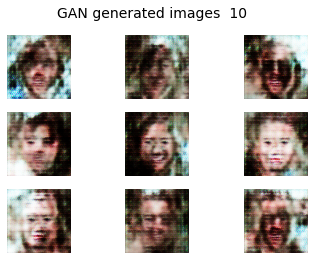

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 1/156 [00:00<00:28,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.05it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.20it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.27it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.16it/s]

1/1 [==============================] - 0s 17ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


  7%|▋         | 11/156 [00:01<00:23,  6.14it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 12/156 [00:01<00:23,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.13it/s]

1/1 [==============================] - 0s 17ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 15/156 [00:02<00:24,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:23,  5.87it/s]

1/1 [==============================] - 0s 14ms/step


 11%|█         | 17/156 [00:02<00:23,  5.95it/s]

1/1 [==============================] - 0s 17ms/step


 12%|█▏        | 18/156 [00:02<00:22,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 22/156 [00:03<00:22,  6.07it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.11it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.13it/s]

1/1 [==============================] - 0s 14ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.03it/s]

1/1 [==============================] - 0s 27ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.84it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 19%|█▉        | 30/156 [00:04<00:21,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 32/156 [00:05<00:20,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 21%|██        | 33/156 [00:05<00:20,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 35/156 [00:05<00:20,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:05<00:20,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.89it/s]

1/1 [==============================] - 0s 16ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.30it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 42/156 [00:06<00:18,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.00it/s]

1/1 [==============================] - 0s 17ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 47/156 [00:07<00:18,  5.94it/s]

1/1 [==============================] - 0s 17ms/step


 31%|███       | 48/156 [00:08<00:18,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 52/156 [00:08<00:19,  5.39it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 53/156 [00:08<00:19,  5.34it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 54/156 [00:09<00:19,  5.23it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 55/156 [00:09<00:19,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 56/156 [00:09<00:19,  5.22it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 57/156 [00:09<00:19,  5.11it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 58/156 [00:09<00:20,  4.88it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 59/156 [00:10<00:19,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 60/156 [00:10<00:19,  4.96it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 61/156 [00:10<00:19,  4.84it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 62/156 [00:10<00:19,  4.81it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 63/156 [00:10<00:18,  4.95it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 64/156 [00:11<00:19,  4.83it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 65/156 [00:11<00:19,  4.65it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 66/156 [00:11<00:19,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 67/156 [00:11<00:18,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 68/156 [00:12<00:17,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 44%|████▍     | 69/156 [00:12<00:17,  4.94it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 70/156 [00:12<00:17,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 71/156 [00:12<00:16,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 72/156 [00:12<00:17,  4.85it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 73/156 [00:13<00:16,  4.93it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:13<00:15,  5.23it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 75/156 [00:13<00:15,  5.21it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.62it/s]

1/1 [==============================] - 0s 16ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.68it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:14<00:13,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:14<00:12,  5.98it/s]

1/1 [==============================] - 0s 18ms/step


 52%|█████▏    | 81/156 [00:14<00:12,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 53%|█████▎    | 83/156 [00:14<00:11,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 54%|█████▍    | 84/156 [00:14<00:11,  6.13it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 85/156 [00:15<00:11,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:15<00:11,  5.92it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.86it/s]

1/1 [==============================] - 0s 16ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.81it/s]

1/1 [==============================] - 0s 16ms/step


 58%|█████▊    | 91/156 [00:16<00:10,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 60%|██████    | 94/156 [00:16<00:10,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 97/156 [00:17<00:09,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  5.99it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.98it/s]

1/1 [==============================] - 0s 15ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.98it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 103/156 [00:18<00:08,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:08,  5.85it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:18<00:07,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 109/156 [00:19<00:07,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 71%|███████   | 110/156 [00:19<00:07,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:19<00:07,  6.19it/s]

1/1 [==============================] - 0s 18ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  6.19it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 113/156 [00:19<00:06,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:19<00:06,  6.20it/s]

1/1 [==============================] - 0s 14ms/step


 74%|███████▎  | 115/156 [00:20<00:06,  6.18it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  6.17it/s]

1/1 [==============================] - 0s 14ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  6.17it/s]

1/1 [==============================] - 0s 15ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  6.20it/s]

1/1 [==============================] - 0s 16ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  6.11it/s]

1/1 [==============================] - 0s 15ms/step


 77%|███████▋  | 120/156 [00:20<00:05,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:21<00:05,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  6.08it/s]

1/1 [==============================] - 0s 16ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  6.14it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:21<00:05,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 127/156 [00:22<00:04,  6.18it/s]

1/1 [==============================] - 0s 18ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  6.16it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  6.10it/s]

1/1 [==============================] - 0s 14ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  6.13it/s]

1/1 [==============================] - 0s 18ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 85%|████████▍ | 132/156 [00:22<00:03,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:23<00:02,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  6.11it/s]

1/1 [==============================] - 0s 17ms/step


 90%|█████████ | 141/156 [00:24<00:02,  6.22it/s]

1/1 [==============================] - 0s 14ms/step


 91%|█████████ | 142/156 [00:24<00:02,  6.23it/s]

1/1 [==============================] - 0s 15ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 92%|█████████▏| 144/156 [00:24<00:01,  6.17it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  6.21it/s]

1/1 [==============================] - 0s 18ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  6.13it/s]

1/1 [==============================] - 0s 16ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:25<00:00,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  6.15it/s]

1/1 [==============================] - 0s 15ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  6.04it/s]

1/1 [==============================] - 0s 18ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  6.01it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.94it/s]

1/1 [==============================] - 0s 15ms/step


100%|██████████| 156/156 [00:26<00:00,  5.83it/s]


1/1 [==============================] - 0s 26ms/step


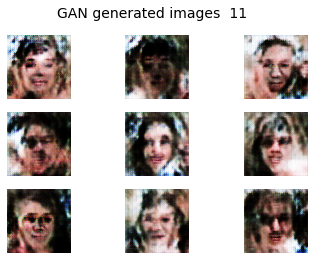

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 1/156 [00:00<00:26,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:25,  6.10it/s]

1/1 [==============================] - 0s 19ms/step


  2%|▏         | 3/156 [00:00<00:25,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/156 [00:01<00:26,  5.74it/s]

1/1 [==============================] - 0s 18ms/step


  4%|▍         | 7/156 [00:01<00:24,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  5%|▌         | 8/156 [00:01<00:24,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 9/156 [00:01<00:24,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:23,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


  7%|▋         | 11/156 [00:01<00:24,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 10%|█         | 16/156 [00:02<00:23,  5.92it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 17/156 [00:02<00:22,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 18/156 [00:02<00:22,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 19/156 [00:03<00:21,  6.23it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 20/156 [00:03<00:21,  6.21it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:21,  6.22it/s]

1/1 [==============================] - 0s 18ms/step


 14%|█▍        | 22/156 [00:03<00:21,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:03<00:21,  6.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 24/156 [00:03<00:21,  6.28it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.22it/s]

1/1 [==============================] - 0s 15ms/step


 17%|█▋        | 26/156 [00:04<00:20,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 17%|█▋        | 27/156 [00:04<00:20,  6.19it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.10it/s]

1/1 [==============================] - 0s 15ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 21%|██        | 32/156 [00:05<00:19,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:19,  6.18it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 34/156 [00:05<00:19,  6.30it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 19ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.20it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 38/156 [00:06<00:18,  6.29it/s]

1/1 [==============================] - 0s 17ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 40/156 [00:06<00:18,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 42/156 [00:06<00:17,  6.36it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 28%|██▊       | 44/156 [00:07<00:17,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.05it/s]

1/1 [==============================] - 0s 18ms/step


 30%|███       | 47/156 [00:07<00:17,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:07<00:17,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 49/156 [00:07<00:17,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 51/156 [00:08<00:18,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 52/156 [00:08<00:18,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 34%|███▍      | 53/156 [00:08<00:17,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.06it/s]

1/1 [==============================] - 0s 15ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.11it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 58/156 [00:09<00:15,  6.17it/s]

1/1 [==============================] - 0s 18ms/step


 38%|███▊      | 59/156 [00:09<00:15,  6.12it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 61/156 [00:10<00:15,  6.02it/s]

1/1 [==============================] - 0s 19ms/step


 40%|███▉      | 62/156 [00:10<00:15,  5.97it/s]

1/1 [==============================] - 0s 16ms/step


 40%|████      | 63/156 [00:10<00:15,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████      | 64/156 [00:10<00:14,  6.17it/s]

1/1 [==============================] - 0s 16ms/step


 42%|████▏     | 65/156 [00:10<00:15,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.01it/s]

1/1 [==============================] - 0s 16ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:11<00:14,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:11<00:14,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.01it/s]

1/1 [==============================] - 0s 18ms/step


 47%|████▋     | 73/156 [00:11<00:13,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 74/156 [00:12<00:13,  6.07it/s]

1/1 [==============================] - 0s 15ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.86it/s]

1/1 [==============================] - 0s 17ms/step


 49%|████▉     | 77/156 [00:12<00:13,  5.79it/s]

1/1 [==============================] - 0s 19ms/step


 50%|█████     | 78/156 [00:12<00:13,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.81it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.92it/s]

1/1 [==============================] - 0s 17ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 83/156 [00:13<00:12,  5.85it/s]

1/1 [==============================] - 0s 18ms/step


 54%|█████▍    | 84/156 [00:13<00:12,  5.99it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  5.86it/s]

1/1 [==============================] - 0s 15ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 56%|█████▋    | 88/156 [00:14<00:11,  5.83it/s]

1/1 [==============================] - 0s 17ms/step


 57%|█████▋    | 89/156 [00:14<00:11,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:14<00:10,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  6.14it/s]

1/1 [==============================] - 0s 17ms/step


 60%|█████▉    | 93/156 [00:15<00:10,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 60%|██████    | 94/156 [00:15<00:10,  6.09it/s]

1/1 [==============================] - 0s 24ms/step


 61%|██████    | 95/156 [00:15<00:10,  5.95it/s]

1/1 [==============================] - 0s 16ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  6.04it/s]

1/1 [==============================] - 0s 17ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  6.05it/s]

1/1 [==============================] - 0s 15ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  6.02it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:16<00:09,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.10it/s]

1/1 [==============================] - 0s 17ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 69%|██████▉   | 108/156 [00:17<00:07,  6.04it/s]

1/1 [==============================] - 0s 14ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:18<00:07,  6.09it/s]

1/1 [==============================] - 0s 17ms/step


 71%|███████   | 111/156 [00:18<00:07,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  6.01it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 114/156 [00:18<00:07,  5.94it/s]

1/1 [==============================] - 0s 19ms/step


 74%|███████▎  | 115/156 [00:18<00:06,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▍  | 116/156 [00:19<00:06,  6.07it/s]

1/1 [==============================] - 0s 24ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  6.17it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  6.22it/s]

1/1 [==============================] - 0s 19ms/step


 76%|███████▋  | 119/156 [00:19<00:05,  6.23it/s]

1/1 [==============================] - 0s 24ms/step


 77%|███████▋  | 120/156 [00:19<00:05,  6.12it/s]

1/1 [==============================] - 0s 19ms/step


 78%|███████▊  | 121/156 [00:19<00:05,  6.27it/s]

1/1 [==============================] - 0s 18ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  6.25it/s]

1/1 [==============================] - 0s 14ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  6.24it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  6.31it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:20<00:04,  6.28it/s]

1/1 [==============================] - 0s 16ms/step


 81%|████████  | 126/156 [00:20<00:04,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████▏ | 127/156 [00:20<00:04,  6.18it/s]

1/1 [==============================] - 0s 16ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.24it/s]

1/1 [==============================] - 0s 25ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.23it/s]

1/1 [==============================] - 0s 14ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.16it/s]

1/1 [==============================] - 0s 16ms/step


 85%|████████▍ | 132/156 [00:21<00:05,  4.34it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:22<00:04,  4.67it/s]

1/1 [==============================] - 0s 17ms/step


 86%|████████▌ | 134/156 [00:22<00:04,  5.06it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  5.72it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:22<00:03,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  5.99it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 141/156 [00:23<00:02,  6.03it/s]

1/1 [==============================] - 0s 16ms/step


 91%|█████████ | 142/156 [00:23<00:02,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 144/156 [00:23<00:02,  5.93it/s]

1/1 [==============================] - 0s 16ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  5.98it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  5.96it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:24<00:00,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  6.08it/s]

1/1 [==============================] - 0s 17ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  6.05it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 156/156 [00:25<00:00,  6.02it/s]


1/1 [==============================] - 0s 27ms/step


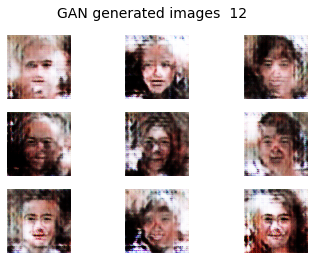

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1/156 [00:00<00:28,  5.50it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:25,  5.96it/s]

1/1 [==============================] - 0s 16ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 6/156 [00:00<00:24,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 8/156 [00:01<00:24,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 10/156 [00:01<00:26,  5.48it/s]

1/1 [==============================] - 0s 15ms/step


  7%|▋         | 11/156 [00:01<00:26,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.89it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:23,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 14/156 [00:02<00:23,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 10%|▉         | 15/156 [00:02<00:22,  6.17it/s]

1/1 [==============================] - 0s 17ms/step


 10%|█         | 16/156 [00:02<00:22,  6.10it/s]

1/1 [==============================] - 0s 18ms/step


 11%|█         | 17/156 [00:02<00:22,  6.15it/s]

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 18/156 [00:03<00:22,  6.08it/s]

1/1 [==============================] - 0s 18ms/step


 12%|█▏        | 19/156 [00:03<00:22,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:22,  6.07it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.05it/s]

1/1 [==============================] - 0s 14ms/step


 14%|█▍        | 22/156 [00:03<00:22,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:03<00:22,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.95it/s]

1/1 [==============================] - 0s 18ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.10it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.12it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:04<00:20,  6.23it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:19,  6.24it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:19,  6.18it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 34/156 [00:05<00:20,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:05<00:20,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:05<00:19,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.19it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:06<00:18,  6.30it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 26%|██▌       | 40/156 [00:06<00:19,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:06<00:19,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:06<00:19,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:20,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 47/156 [00:07<00:18,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:18,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.89it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:08<00:17,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 53/156 [00:08<00:17,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 56/156 [00:09<00:16,  6.19it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.16it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 59/156 [00:09<00:16,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:15,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 61/156 [00:10<00:15,  6.15it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 40%|████      | 63/156 [00:10<00:14,  6.20it/s]

1/1 [==============================] - 0s 18ms/step


 41%|████      | 64/156 [00:10<00:15,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:10<00:15,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.75it/s]

1/1 [==============================] - 0s 18ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.82it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▎     | 68/156 [00:11<00:14,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.63it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 70/156 [00:11<00:16,  5.32it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 71/156 [00:11<00:15,  5.37it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 72/156 [00:12<00:16,  5.19it/s]

1/1 [==============================] - 0s 22ms/step


 47%|████▋     | 73/156 [00:12<00:16,  5.05it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 74/156 [00:12<00:16,  4.85it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 75/156 [00:12<00:16,  4.96it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 76/156 [00:13<00:16,  4.71it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 77/156 [00:13<00:16,  4.76it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 78/156 [00:13<00:16,  4.80it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 79/156 [00:13<00:16,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 80/156 [00:13<00:16,  4.58it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 81/156 [00:14<00:16,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 82/156 [00:14<00:16,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 83/156 [00:14<00:15,  4.70it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 84/156 [00:14<00:16,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 85/156 [00:15<00:17,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 86/156 [00:15<00:18,  3.84it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 87/156 [00:15<00:17,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 88/156 [00:15<00:16,  4.20it/s]

1/1 [==============================] - 0s 27ms/step


 57%|█████▋    | 89/156 [00:16<00:16,  3.96it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:16<00:15,  4.38it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:16<00:13,  4.64it/s]

1/1 [==============================] - 0s 21ms/step


 59%|█████▉    | 92/156 [00:16<00:13,  4.90it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 93/156 [00:16<00:12,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


 60%|██████    | 94/156 [00:16<00:11,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 61%|██████    | 95/156 [00:17<00:10,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 96/156 [00:17<00:10,  5.71it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 97/156 [00:17<00:10,  5.75it/s]

1/1 [==============================] - 0s 16ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  5.80it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 65%|██████▍   | 101/156 [00:18<00:09,  6.09it/s]

1/1 [==============================] - 0s 26ms/step


 65%|██████▌   | 102/156 [00:18<00:09,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 66%|██████▌   | 103/156 [00:18<00:09,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 104/156 [00:18<00:08,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 107/156 [00:19<00:07,  6.16it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:19<00:08,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:07,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 71%|███████   | 110/156 [00:19<00:07,  6.09it/s]

1/1 [==============================] - 0s 18ms/step


 71%|███████   | 111/156 [00:19<00:07,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  6.02it/s]

1/1 [==============================] - 0s 24ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 115/156 [00:20<00:06,  6.03it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.85it/s]

1/1 [==============================] - 0s 17ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.87it/s]

1/1 [==============================] - 0s 18ms/step


 76%|███████▋  | 119/156 [00:21<00:06,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:21<00:06,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 78%|███████▊  | 121/156 [00:21<00:05,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:21<00:05,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  6.16it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  6.22it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:22<00:04,  6.20it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████  | 126/156 [00:22<00:04,  6.26it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:22<00:04,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  6.24it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  6.36it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  6.26it/s]

1/1 [==============================] - 0s 26ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  6.05it/s]

1/1 [==============================] - 0s 19ms/step


 85%|████████▍ | 132/156 [00:23<00:03,  6.17it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 133/156 [00:23<00:03,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.90it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████▊ | 138/156 [00:24<00:02,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  6.14it/s]

1/1 [==============================] - 0s 19ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  6.02it/s]

1/1 [==============================] - 0s 18ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.99it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:24<00:02,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 144/156 [00:25<00:01,  6.00it/s]

1/1 [==============================] - 0s 25ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.80it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.93it/s]

1/1 [==============================] - 0s 15ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:27<00:00,  5.72it/s]


1/1 [==============================] - 0s 23ms/step


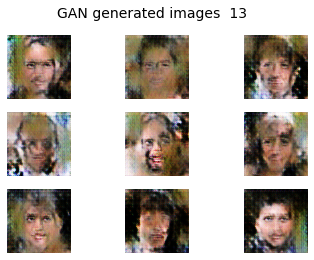

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 1/156 [00:00<00:26,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:26,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:24,  6.28it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:23,  6.39it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 6/156 [00:00<00:23,  6.35it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 7/156 [00:01<00:23,  6.24it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 8/156 [00:01<00:23,  6.29it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:23,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:24,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.77it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 12/156 [00:01<00:25,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 16/156 [00:02<00:24,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:02<00:24,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:22,  6.03it/s]

1/1 [==============================] - 0s 17ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 23/156 [00:03<00:23,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 26/156 [00:04<00:21,  5.99it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.05it/s]

1/1 [==============================] - 0s 27ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.09it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 30/156 [00:05<00:20,  6.06it/s]

1/1 [==============================] - 0s 18ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.21it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 32/156 [00:05<00:19,  6.23it/s]

1/1 [==============================] - 0s 17ms/step


 21%|██        | 33/156 [00:05<00:20,  6.12it/s]

1/1 [==============================] - 0s 18ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:05<00:20,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.00it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:06<00:18,  6.15it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 42/156 [00:07<00:18,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:18,  6.13it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 44/156 [00:07<00:18,  6.11it/s]

1/1 [==============================] - 0s 18ms/step


 29%|██▉       | 45/156 [00:07<00:18,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:07<00:18,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:07<00:17,  6.07it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 48/156 [00:08<00:17,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:08<00:16,  6.26it/s]

1/1 [==============================] - 0s 18ms/step


 33%|███▎      | 52/156 [00:08<00:16,  6.24it/s]

1/1 [==============================] - 0s 18ms/step


 34%|███▍      | 53/156 [00:08<00:16,  6.16it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:08<00:16,  6.19it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 55/156 [00:09<00:16,  6.11it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:09<00:15,  6.27it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 57/156 [00:09<00:15,  6.31it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:09<00:16,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 60/156 [00:09<00:15,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 61/156 [00:10<00:15,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:10<00:15,  6.15it/s]

1/1 [==============================] - 0s 18ms/step


 40%|████      | 63/156 [00:10<00:15,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:10<00:14,  6.30it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 65/156 [00:10<00:14,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:10<00:14,  6.06it/s]

1/1 [==============================] - 0s 17ms/step


 43%|████▎     | 67/156 [00:11<00:14,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▎     | 68/156 [00:11<00:14,  6.23it/s]

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 69/156 [00:11<00:13,  6.21it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 70/156 [00:11<00:14,  6.04it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 71/156 [00:11<00:13,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 72/156 [00:11<00:13,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.01it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:12<00:13,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 49%|████▉     | 77/156 [00:12<00:13,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 50%|█████     | 78/156 [00:12<00:13,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 51%|█████     | 79/156 [00:13<00:12,  6.02it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  6.11it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 83/156 [00:13<00:11,  6.14it/s]

1/1 [==============================] - 0s 26ms/step


 54%|█████▍    | 84/156 [00:13<00:12,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  6.04it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 86/156 [00:14<00:12,  5.56it/s]

1/1 [==============================] - 0s 18ms/step


 56%|█████▌    | 87/156 [00:14<00:12,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:14<00:12,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:14<00:11,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 90/156 [00:14<00:11,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:15<00:10,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:15<00:10,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


 60%|█████▉    | 93/156 [00:15<00:11,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:15<00:10,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 61%|██████    | 95/156 [00:15<00:10,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:15<00:09,  6.11it/s]

1/1 [==============================] - 0s 21ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.99it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 98/156 [00:16<00:09,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 63%|██████▎   | 99/156 [00:16<00:09,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 64%|██████▍   | 100/156 [00:16<00:09,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 65%|██████▍   | 101/156 [00:16<00:09,  6.01it/s]

1/1 [==============================] - 0s 17ms/step


 65%|██████▌   | 102/156 [00:16<00:08,  6.15it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.17it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


 67%|██████▋   | 105/156 [00:17<00:08,  6.13it/s]

1/1 [==============================] - 0s 21ms/step


 68%|██████▊   | 106/156 [00:17<00:08,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 107/156 [00:17<00:08,  6.02it/s]

1/1 [==============================] - 0s 26ms/step


 69%|██████▉   | 108/156 [00:17<00:08,  5.97it/s]

1/1 [==============================] - 0s 18ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:18<00:07,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:18<00:07,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


 72%|███████▏  | 112/156 [00:18<00:07,  5.91it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 113/156 [00:18<00:07,  5.66it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 74%|███████▎  | 115/156 [00:19<00:07,  5.77it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 116/156 [00:19<00:07,  5.60it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 117/156 [00:19<00:06,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:19<00:06,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 76%|███████▋  | 119/156 [00:19<00:06,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.62it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 121/156 [00:20<00:06,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:20<00:05,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:20<00:05,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 79%|███████▉  | 124/156 [00:20<00:05,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 80%|████████  | 125/156 [00:20<00:05,  6.01it/s]

1/1 [==============================] - 0s 19ms/step


 81%|████████  | 126/156 [00:21<00:04,  6.07it/s]

1/1 [==============================] - 0s 18ms/step


 81%|████████▏ | 127/156 [00:21<00:04,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:21<00:04,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 83%|████████▎ | 129/156 [00:21<00:04,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 130/156 [00:21<00:04,  6.03it/s]

1/1 [==============================] - 0s 19ms/step


 84%|████████▍ | 131/156 [00:21<00:04,  6.13it/s]

1/1 [==============================] - 0s 25ms/step


 85%|████████▍ | 132/156 [00:22<00:03,  6.18it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▌ | 133/156 [00:22<00:03,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 86%|████████▌ | 134/156 [00:22<00:03,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:22<00:03,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:22<00:03,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 137/156 [00:22<00:03,  5.66it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 138/156 [00:23<00:03,  5.70it/s]

1/1 [==============================] - 0s 18ms/step


 89%|████████▉ | 139/156 [00:23<00:02,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:23<00:02,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 90%|█████████ | 141/156 [00:23<00:02,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 91%|█████████ | 142/156 [00:23<00:02,  6.08it/s]

1/1 [==============================] - 0s 19ms/step


 92%|█████████▏| 143/156 [00:23<00:02,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 145/156 [00:24<00:01,  5.83it/s]

1/1 [==============================] - 0s 16ms/step


 94%|█████████▎| 146/156 [00:24<00:01,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 94%|█████████▍| 147/156 [00:24<00:01,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 95%|█████████▍| 148/156 [00:24<00:01,  5.96it/s]

1/1 [==============================] - 0s 18ms/step


 96%|█████████▌| 149/156 [00:24<00:01,  6.04it/s]

1/1 [==============================] - 0s 19ms/step


 96%|█████████▌| 150/156 [00:25<00:00,  6.10it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 151/156 [00:25<00:00,  6.18it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:25<00:00,  6.17it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:25<00:00,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:25<00:00,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:25<00:00,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:26<00:00,  5.96it/s]


1/1 [==============================] - 0s 24ms/step


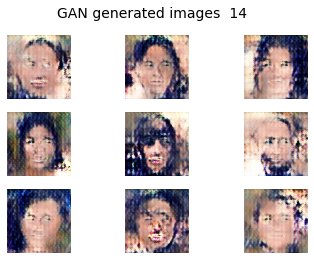

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 1/156 [00:00<00:27,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:25,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 4/156 [00:00<00:25,  5.95it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 5/156 [00:00<00:24,  6.10it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/156 [00:01<00:25,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.14it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.86it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▋         | 10/156 [00:01<00:24,  5.90it/s]

1/1 [==============================] - 0s 19ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.93it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:23,  5.95it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 16/156 [00:02<00:24,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.78it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 20/156 [00:03<00:22,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:22,  5.94it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 22/156 [00:03<00:22,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 23/156 [00:03<00:22,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:21,  6.04it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:04<00:21,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 32/156 [00:05<00:21,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:20,  6.02it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:05<00:20,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:19,  6.09it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 37/156 [00:06<00:19,  6.14it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 38/156 [00:06<00:19,  5.93it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:06<00:19,  6.01it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:06<00:19,  5.94it/s]

1/1 [==============================] - 0s 18ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 47/156 [00:07<00:18,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.88it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 52/156 [00:08<00:18,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 53/156 [00:08<00:17,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 57/156 [00:09<00:16,  5.91it/s]

1/1 [==============================] - 0s 18ms/step


 37%|███▋      | 58/156 [00:09<00:16,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:15,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 64/156 [00:10<00:15,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 65/156 [00:11<00:15,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.57it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 48%|████▊     | 75/156 [00:12<00:13,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:12<00:13,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.74it/s]

1/1 [==============================] - 0s 23ms/step


 52%|█████▏    | 81/156 [00:13<00:12,  5.96it/s]

1/1 [==============================] - 0s 21ms/step


 53%|█████▎    | 82/156 [00:13<00:12,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


 55%|█████▌    | 86/156 [00:14<00:11,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 56%|█████▌    | 87/156 [00:14<00:12,  5.70it/s]

1/1 [==============================] - 0s 28ms/step


 56%|█████▋    | 88/156 [00:15<00:12,  5.57it/s]

1/1 [==============================] - 0s 26ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.59it/s]

1/1 [==============================] - 0s 28ms/step


 58%|█████▊    | 90/156 [00:15<00:12,  5.41it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.43it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 92/156 [00:15<00:12,  5.32it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 93/156 [00:15<00:12,  5.14it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 94/156 [00:16<00:12,  5.04it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 95/156 [00:16<00:12,  4.90it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 96/156 [00:16<00:12,  4.84it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 97/156 [00:16<00:12,  4.69it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 98/156 [00:17<00:12,  4.68it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 99/156 [00:17<00:11,  4.80it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 100/156 [00:17<00:11,  4.80it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 101/156 [00:17<00:12,  4.58it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 102/156 [00:17<00:11,  4.67it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 103/156 [00:18<00:11,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 104/156 [00:18<00:11,  4.69it/s]

1/1 [==============================] - 0s 53ms/step


 67%|██████▋   | 105/156 [00:18<00:11,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 106/156 [00:18<00:11,  4.23it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▊   | 107/156 [00:19<00:13,  3.76it/s]

1/1 [==============================] - 0s 20ms/step


 69%|██████▉   | 108/156 [00:19<00:11,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 70%|██████▉   | 109/156 [00:19<00:10,  4.51it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 110/156 [00:19<00:09,  4.77it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:19<00:08,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


 72%|███████▏  | 112/156 [00:20<00:08,  5.21it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:20<00:07,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 73%|███████▎  | 114/156 [00:20<00:07,  5.53it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.59it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▌  | 118/156 [00:21<00:06,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:21<00:07,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


 77%|███████▋  | 120/156 [00:21<00:07,  5.10it/s]

1/1 [==============================] - 0s 26ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.48it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:22<00:05,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:04,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 134/156 [00:24<00:04,  5.49it/s]

1/1 [==============================] - 0s 19ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


 90%|████████▉ | 140/156 [00:25<00:03,  5.30it/s]

1/1 [==============================] - 0s 25ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.34it/s]

1/1 [==============================] - 0s 26ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.60it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.59it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.68it/s]

1/1 [==============================] - 0s 25ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.83it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


100%|██████████| 156/156 [00:27<00:00,  5.59it/s]


1/1 [==============================] - 0s 34ms/step


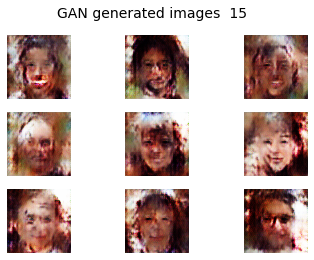

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 1/156 [00:00<00:27,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.43it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3/156 [00:00<00:27,  5.61it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/156 [00:00<00:26,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5/156 [00:00<00:26,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 7/156 [00:01<00:24,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.88it/s]

1/1 [==============================] - 0s 18ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.83it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 10/156 [00:01<00:24,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:24,  5.79it/s]

1/1 [==============================] - 0s 18ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 16/156 [00:02<00:24,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 17/156 [00:02<00:24,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 27/156 [00:04<00:21,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 29/156 [00:04<00:21,  5.90it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.70it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 31/156 [00:05<00:21,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██        | 32/156 [00:05<00:21,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 33/156 [00:05<00:21,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 35/156 [00:06<00:20,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:19,  5.96it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 38/156 [00:06<00:19,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 39/156 [00:06<00:19,  6.05it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 40/156 [00:06<00:19,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.91it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.87it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 44/156 [00:07<00:18,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.83it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 47/156 [00:08<00:18,  5.99it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:18,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.91it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 50/156 [00:08<00:18,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 51/156 [00:08<00:17,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 52/156 [00:08<00:17,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.80it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 56/156 [00:09<00:16,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:09<00:16,  6.08it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 58/156 [00:09<00:16,  6.09it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 59/156 [00:10<00:15,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 60/156 [00:10<00:15,  6.11it/s]

1/1 [==============================] - 0s 20ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:10<00:16,  5.77it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 64/156 [00:10<00:16,  5.62it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 65/156 [00:11<00:15,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.82it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 69/156 [00:11<00:14,  5.85it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 70/156 [00:11<00:14,  5.91it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 73/156 [00:12<00:13,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 75/156 [00:12<00:14,  5.64it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.76it/s]

1/1 [==============================] - 0s 24ms/step


 52%|█████▏    | 81/156 [00:13<00:13,  5.66it/s]

1/1 [==============================] - 0s 25ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:14<00:12,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:14<00:11,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 59%|█████▉    | 92/156 [00:15<00:11,  5.67it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.46it/s]

1/1 [==============================] - 0s 26ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 98/156 [00:16<00:10,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.73it/s]

1/1 [==============================] - 0s 19ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.96it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:17<00:08,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  5.98it/s]

1/1 [==============================] - 0s 20ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  5.90it/s]

1/1 [==============================] - 0s 24ms/step


 71%|███████   | 110/156 [00:18<00:07,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 71%|███████   | 111/156 [00:19<00:07,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


 74%|███████▎  | 115/156 [00:19<00:07,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 74%|███████▍  | 116/156 [00:19<00:07,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.59it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.49it/s]

1/1 [==============================] - 0s 27ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.65it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 121/156 [00:20<00:06,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 123/156 [00:21<00:06,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.49it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 126/156 [00:21<00:05,  5.68it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:21<00:05,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 82%|████████▏ | 128/156 [00:22<00:04,  5.74it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.46it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:22<00:04,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.60it/s]

1/1 [==============================] - 0s 19ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


 88%|████████▊ | 138/156 [00:23<00:02,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.92it/s]

1/1 [==============================] - 0s 21ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.85it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.74it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 143/156 [00:24<00:02,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


 92%|█████████▏| 144/156 [00:24<00:02,  5.58it/s]

1/1 [==============================] - 0s 26ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.62it/s]

1/1 [==============================] - 0s 21ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.67it/s]

1/1 [==============================] - 0s 23ms/step


 96%|█████████▌| 149/156 [00:25<00:01,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


 96%|█████████▌| 150/156 [00:25<00:01,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.98it/s]

1/1 [==============================] - 0s 23ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  6.10it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:26<00:00,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:26<00:00,  5.78it/s]


1/1 [==============================] - 0s 23ms/step


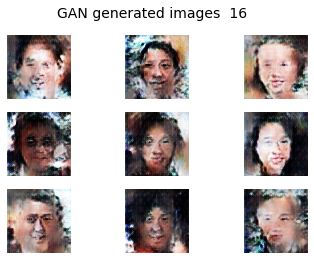

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1/156 [00:00<00:29,  5.22it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2/156 [00:00<00:27,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:26,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 4/156 [00:00<00:25,  6.07it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5/156 [00:00<00:25,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 6/156 [00:01<00:25,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 7/156 [00:01<00:25,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 11/156 [00:01<00:25,  5.66it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 12/156 [00:02<00:26,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 13/156 [00:02<00:25,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.70it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 16/156 [00:02<00:23,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:02<00:23,  6.00it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:22,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.94it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.75it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 23/156 [00:03<00:22,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:22,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 25/156 [00:04<00:21,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 26/156 [00:04<00:21,  6.04it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 28/156 [00:04<00:21,  6.08it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:04<00:20,  6.06it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 30/156 [00:05<00:20,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 31/156 [00:05<00:20,  6.06it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:20,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 33/156 [00:05<00:21,  5.70it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 34/156 [00:05<00:20,  5.88it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 35/156 [00:05<00:20,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.85it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▎       | 37/156 [00:06<00:21,  5.65it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 38/156 [00:06<00:21,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 39/156 [00:06<00:20,  5.66it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▌       | 40/156 [00:06<00:20,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 41/156 [00:07<00:20,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 42/156 [00:07<00:20,  5.69it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 43/156 [00:07<00:20,  5.46it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.72it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 46/156 [00:07<00:18,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 47/156 [00:08<00:18,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 48/156 [00:08<00:18,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 49/156 [00:08<00:18,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.89it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.06it/s]

1/1 [==============================] - 0s 19ms/step


 33%|███▎      | 52/156 [00:08<00:17,  6.07it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 53/156 [00:09<00:17,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 54/156 [00:09<00:18,  5.65it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.52it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 58/156 [00:09<00:17,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.89it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 63/156 [00:10<00:15,  5.87it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:15,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.39it/s]

1/1 [==============================] - 0s 21ms/step


 43%|████▎     | 67/156 [00:11<00:16,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:11<00:15,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.96it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.85it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.86it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 75/156 [00:12<00:13,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 49%|████▊     | 76/156 [00:13<00:13,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.75it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.48it/s]

1/1 [==============================] - 0s 25ms/step


 51%|█████     | 79/156 [00:13<00:13,  5.54it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:13<00:13,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


 52%|█████▏    | 81/156 [00:14<00:13,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:13,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:13,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.55it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:14<00:13,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 55%|█████▌    | 86/156 [00:14<00:12,  5.49it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.93it/s]

1/1 [==============================] - 0s 25ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.72it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 92/156 [00:15<00:11,  5.78it/s]

1/1 [==============================] - 0s 23ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.60it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:16<00:11,  5.63it/s]

1/1 [==============================] - 0s 27ms/step


 61%|██████    | 95/156 [00:16<00:11,  5.51it/s]

1/1 [==============================] - 0s 25ms/step


 62%|██████▏   | 96/156 [00:16<00:11,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.45it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.44it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 100/156 [00:17<00:10,  5.25it/s]

1/1 [==============================] - 0s 27ms/step


 65%|██████▍   | 101/156 [00:17<00:10,  5.23it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 102/156 [00:17<00:10,  5.22it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 103/156 [00:18<00:10,  5.22it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 104/156 [00:18<00:10,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 105/156 [00:18<00:10,  4.86it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 106/156 [00:18<00:10,  4.62it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 107/156 [00:18<00:10,  4.54it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 108/156 [00:19<00:10,  4.54it/s]

1/1 [==============================] - 0s 23ms/step


 70%|██████▉   | 109/156 [00:19<00:09,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 110/156 [00:19<00:09,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 111/156 [00:19<00:09,  4.78it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 112/156 [00:19<00:09,  4.87it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 113/156 [00:20<00:08,  4.89it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 114/156 [00:20<00:08,  4.80it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 115/156 [00:20<00:08,  4.82it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 116/156 [00:20<00:08,  4.74it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 117/156 [00:20<00:08,  4.79it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 118/156 [00:21<00:08,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


 76%|███████▋  | 119/156 [00:21<00:07,  4.88it/s]

1/1 [==============================] - 0s 23ms/step


 77%|███████▋  | 120/156 [00:21<00:07,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.11it/s]

1/1 [==============================] - 0s 23ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 123/156 [00:22<00:06,  5.10it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 124/156 [00:22<00:05,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


 80%|████████  | 125/156 [00:22<00:05,  5.62it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.72it/s]

1/1 [==============================] - 0s 22ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:23<00:05,  5.54it/s]

1/1 [==============================] - 0s 19ms/step


 83%|████████▎ | 129/156 [00:23<00:04,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 130/156 [00:23<00:04,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:04,  5.82it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.83it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:03,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 86%|████████▌ | 134/156 [00:24<00:03,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.57it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 139/156 [00:24<00:03,  5.63it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 140/156 [00:25<00:02,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▎| 146/156 [00:26<00:01,  5.74it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.81it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


 97%|█████████▋| 151/156 [00:27<00:00,  5.74it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.84it/s]

1/1 [==============================] - 0s 26ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


100%|██████████| 156/156 [00:27<00:00,  5.59it/s]


1/1 [==============================] - 0s 24ms/step


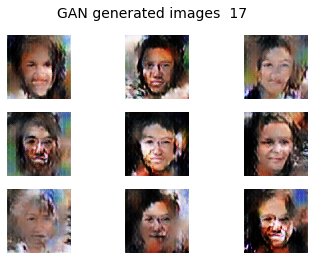

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 1/156 [00:00<00:29,  5.18it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 2/156 [00:00<00:29,  5.30it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 4/156 [00:00<00:27,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 5/156 [00:00<00:27,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 6/156 [00:01<00:27,  5.47it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:27,  5.39it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 9/156 [00:01<00:26,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 11/156 [00:01<00:24,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 14/156 [00:02<00:24,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 15/156 [00:02<00:25,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 16/156 [00:02<00:24,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 17/156 [00:03<00:24,  5.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 18/156 [00:03<00:23,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 19/156 [00:03<00:23,  5.77it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 20/156 [00:03<00:23,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 21/156 [00:03<00:23,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 22/156 [00:03<00:23,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 23/156 [00:04<00:23,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:23,  5.56it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:24,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:24,  5.37it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 28/156 [00:05<00:24,  5.32it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 29/156 [00:05<00:23,  5.40it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 30/156 [00:05<00:22,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.50it/s]

1/1 [==============================] - 0s 19ms/step


 21%|██        | 33/156 [00:05<00:22,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 34/156 [00:06<00:21,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 36/156 [00:06<00:20,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.84it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.92it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 40/156 [00:07<00:19,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 41/156 [00:07<00:19,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 43/156 [00:07<00:19,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 45/156 [00:07<00:19,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:18,  5.80it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 47/156 [00:08<00:18,  5.97it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███       | 48/156 [00:08<00:17,  6.04it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 49/156 [00:08<00:17,  5.97it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 50/156 [00:08<00:17,  5.92it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:17,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:17,  5.93it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.80it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.88it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 57/156 [00:10<00:17,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 58/156 [00:10<00:16,  5.84it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 60/156 [00:10<00:16,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 61/156 [00:10<00:16,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 40%|████      | 63/156 [00:11<00:15,  5.83it/s]

1/1 [==============================] - 0s 21ms/step


 41%|████      | 64/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 66/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 25ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 73/156 [00:12<00:13,  6.05it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 74/156 [00:12<00:13,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 75/156 [00:13<00:13,  5.94it/s]

1/1 [==============================] - 0s 20ms/step


 49%|████▊     | 76/156 [00:13<00:13,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


 49%|████▉     | 77/156 [00:13<00:13,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:13<00:13,  5.91it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████     | 79/156 [00:13<00:12,  6.05it/s]

1/1 [==============================] - 0s 20ms/step


 51%|█████▏    | 80/156 [00:13<00:12,  5.99it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 81/156 [00:14<00:12,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.97it/s]

1/1 [==============================] - 0s 22ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.85it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.87it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 85/156 [00:14<00:12,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 55%|█████▌    | 86/156 [00:15<00:12,  5.55it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 87/156 [00:15<00:12,  5.32it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▋    | 88/156 [00:15<00:13,  5.23it/s]

1/1 [==============================] - 0s 20ms/step


 57%|█████▋    | 89/156 [00:15<00:12,  5.44it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:11,  5.80it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 93/156 [00:16<00:11,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.90it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  6.05it/s]

1/1 [==============================] - 0s 24ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.93it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 97/156 [00:16<00:10,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 98/156 [00:17<00:10,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 63%|██████▎   | 99/156 [00:17<00:10,  5.56it/s]

1/1 [==============================] - 0s 20ms/step


 64%|██████▍   | 100/156 [00:17<00:10,  5.50it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 65%|██████▌   | 102/156 [00:17<00:09,  5.76it/s]

1/1 [==============================] - 0s 26ms/step


 66%|██████▌   | 103/156 [00:17<00:09,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 67%|██████▋   | 104/156 [00:18<00:09,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


 67%|██████▋   | 105/156 [00:18<00:09,  5.56it/s]

1/1 [==============================] - 0s 19ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 69%|██████▊   | 107/156 [00:18<00:08,  5.87it/s]

1/1 [==============================] - 0s 24ms/step


 69%|██████▉   | 108/156 [00:18<00:08,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 70%|██████▉   | 109/156 [00:19<00:08,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 110/156 [00:19<00:07,  5.82it/s]

1/1 [==============================] - 0s 21ms/step


 71%|███████   | 111/156 [00:19<00:07,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.75it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.76it/s]

1/1 [==============================] - 0s 21ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 74%|███████▎  | 115/156 [00:20<00:07,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


 74%|███████▍  | 116/156 [00:20<00:06,  5.84it/s]

1/1 [==============================] - 0s 20ms/step


 75%|███████▌  | 117/156 [00:20<00:06,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▌  | 118/156 [00:20<00:06,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 76%|███████▋  | 119/156 [00:20<00:06,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 77%|███████▋  | 120/156 [00:20<00:06,  5.77it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 121/156 [00:21<00:06,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 78%|███████▊  | 122/156 [00:21<00:06,  5.64it/s]

1/1 [==============================] - 0s 20ms/step


 79%|███████▉  | 123/156 [00:21<00:05,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 79%|███████▉  | 124/156 [00:21<00:05,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 80%|████████  | 125/156 [00:21<00:05,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


 81%|████████  | 126/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 21ms/step


 81%|████████▏ | 127/156 [00:22<00:05,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 82%|████████▏ | 128/156 [00:22<00:05,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 129/156 [00:22<00:04,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


 83%|████████▎ | 130/156 [00:22<00:04,  5.63it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:22<00:04,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.61it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.66it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:23<00:03,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 87%|████████▋ | 136/156 [00:23<00:03,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 88%|████████▊ | 137/156 [00:23<00:03,  5.79it/s]

1/1 [==============================] - 0s 21ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.77it/s]

1/1 [==============================] - 0s 20ms/step


 90%|█████████ | 141/156 [00:24<00:02,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


 91%|█████████ | 142/156 [00:24<00:02,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.69it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:25<00:01,  5.61it/s]

1/1 [==============================] - 0s 21ms/step


 95%|█████████▍| 148/156 [00:25<00:01,  5.67it/s]

1/1 [==============================] - 0s 24ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.56it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.78it/s]

1/1 [==============================] - 0s 20ms/step


 97%|█████████▋| 152/156 [00:26<00:00,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 98%|█████████▊| 153/156 [00:26<00:00,  5.80it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:26<00:00,  5.60it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


100%|██████████| 156/156 [00:27<00:00,  5.71it/s]


1/1 [==============================] - 0s 26ms/step


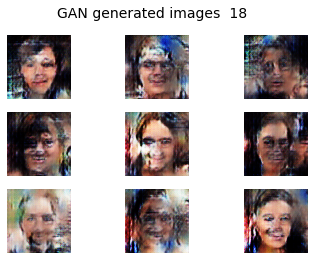

  0%|          | 0/156 [00:00<?, ?it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1/156 [00:00<00:27,  5.57it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 2/156 [00:00<00:28,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3/156 [00:00<00:28,  5.28it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 4/156 [00:00<00:32,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5/156 [00:00<00:29,  5.04it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 6/156 [00:01<00:28,  5.27it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 7/156 [00:01<00:27,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 8/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 9/156 [00:01<00:25,  5.78it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 10/156 [00:01<00:25,  5.74it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 11/156 [00:02<00:25,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 12/156 [00:02<00:25,  5.70it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 13/156 [00:02<00:24,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 14/156 [00:02<00:23,  5.96it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 15/156 [00:02<00:23,  5.94it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 16/156 [00:02<00:25,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 17/156 [00:03<00:24,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 18/156 [00:03<00:25,  5.48it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 19/156 [00:03<00:24,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 20/156 [00:03<00:24,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 21/156 [00:03<00:24,  5.60it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 22/156 [00:03<00:24,  5.40it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 23/156 [00:04<00:24,  5.47it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 24/156 [00:04<00:23,  5.59it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 25/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 26/156 [00:04<00:22,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 27/156 [00:04<00:21,  6.05it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 28/156 [00:04<00:22,  5.76it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 29/156 [00:05<00:22,  5.75it/s]

1/1 [==============================] - 0s 26ms/step


 19%|█▉        | 30/156 [00:05<00:21,  5.75it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 31/156 [00:05<00:22,  5.66it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 32/156 [00:05<00:22,  5.56it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 33/156 [00:05<00:22,  5.55it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 34/156 [00:06<00:22,  5.50it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 35/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 36/156 [00:06<00:21,  5.62it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 37/156 [00:06<00:20,  5.75it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 38/156 [00:06<00:20,  5.75it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 39/156 [00:06<00:19,  5.91it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 40/156 [00:07<00:19,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 41/156 [00:07<00:19,  6.03it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 42/156 [00:07<00:19,  5.86it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 43/156 [00:07<00:18,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 44/156 [00:07<00:19,  5.89it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 45/156 [00:07<00:18,  5.93it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 46/156 [00:08<00:18,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 47/156 [00:08<00:18,  5.89it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 48/156 [00:08<00:17,  6.01it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 49/156 [00:08<00:17,  6.09it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 50/156 [00:08<00:17,  6.03it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 51/156 [00:08<00:17,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 52/156 [00:09<00:17,  6.08it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 53/156 [00:09<00:17,  6.02it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 54/156 [00:09<00:17,  5.71it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 55/156 [00:09<00:17,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 56/156 [00:09<00:17,  5.81it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 57/156 [00:09<00:17,  5.82it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 58/156 [00:10<00:17,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 59/156 [00:10<00:16,  5.89it/s]

1/1 [==============================] - 0s 19ms/step


 38%|███▊      | 60/156 [00:10<00:15,  6.03it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 61/156 [00:10<00:15,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 40%|███▉      | 62/156 [00:10<00:16,  5.79it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 63/156 [00:10<00:15,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


 41%|████      | 64/156 [00:11<00:16,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 65/156 [00:11<00:16,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 66/156 [00:11<00:16,  5.61it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 67/156 [00:11<00:15,  5.67it/s]

1/1 [==============================] - 0s 20ms/step


 44%|████▎     | 68/156 [00:11<00:15,  5.84it/s]

1/1 [==============================] - 0s 19ms/step


 44%|████▍     | 69/156 [00:12<00:15,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 45%|████▍     | 70/156 [00:12<00:14,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 46%|████▌     | 71/156 [00:12<00:14,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 46%|████▌     | 72/156 [00:12<00:14,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 47%|████▋     | 73/156 [00:12<00:14,  5.81it/s]

1/1 [==============================] - 0s 20ms/step


 47%|████▋     | 74/156 [00:12<00:14,  5.78it/s]

1/1 [==============================] - 0s 19ms/step


 48%|████▊     | 75/156 [00:13<00:14,  5.74it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 76/156 [00:13<00:14,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


 49%|████▉     | 77/156 [00:13<00:14,  5.33it/s]

1/1 [==============================] - 0s 20ms/step


 50%|█████     | 78/156 [00:13<00:14,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


 51%|█████     | 79/156 [00:13<00:14,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


 51%|█████▏    | 80/156 [00:14<00:13,  5.70it/s]

1/1 [==============================] - 0s 21ms/step


 52%|█████▏    | 81/156 [00:14<00:12,  5.82it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 82/156 [00:14<00:12,  5.71it/s]

1/1 [==============================] - 0s 20ms/step


 53%|█████▎    | 83/156 [00:14<00:12,  5.79it/s]

1/1 [==============================] - 0s 20ms/step


 54%|█████▍    | 84/156 [00:14<00:12,  5.85it/s]

1/1 [==============================] - 0s 21ms/step


 54%|█████▍    | 85/156 [00:14<00:11,  5.92it/s]

1/1 [==============================] - 0s 19ms/step


 55%|█████▌    | 86/156 [00:15<00:11,  5.86it/s]

1/1 [==============================] - 0s 20ms/step


 56%|█████▌    | 87/156 [00:15<00:11,  5.86it/s]

1/1 [==============================] - 0s 21ms/step


 56%|█████▋    | 88/156 [00:15<00:11,  5.69it/s]

1/1 [==============================] - 0s 21ms/step


 57%|█████▋    | 89/156 [00:15<00:11,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 90/156 [00:15<00:11,  5.80it/s]

1/1 [==============================] - 0s 21ms/step


 58%|█████▊    | 91/156 [00:15<00:11,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 59%|█████▉    | 92/156 [00:16<00:10,  6.00it/s]

1/1 [==============================] - 0s 20ms/step


 60%|█████▉    | 93/156 [00:16<00:10,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


 60%|██████    | 94/156 [00:16<00:10,  5.72it/s]

1/1 [==============================] - 0s 20ms/step


 61%|██████    | 95/156 [00:16<00:10,  5.95it/s]

1/1 [==============================] - 0s 20ms/step


 62%|██████▏   | 96/156 [00:16<00:10,  5.82it/s]

1/1 [==============================] - 0s 22ms/step


 62%|██████▏   | 97/156 [00:16<00:09,  5.95it/s]

1/1 [==============================] - 0s 24ms/step


 63%|██████▎   | 98/156 [00:17<00:09,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


 63%|██████▎   | 99/156 [00:17<00:09,  5.97it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 100/156 [00:17<00:09,  5.97it/s]

1/1 [==============================] - 0s 20ms/step


 65%|██████▍   | 101/156 [00:17<00:09,  6.11it/s]

1/1 [==============================] - 0s 19ms/step


 65%|██████▌   | 102/156 [00:17<00:08,  6.17it/s]

1/1 [==============================] - 0s 20ms/step


 66%|██████▌   | 103/156 [00:17<00:08,  6.13it/s]

1/1 [==============================] - 0s 20ms/step


 67%|██████▋   | 104/156 [00:18<00:08,  6.28it/s]

1/1 [==============================] - 0s 22ms/step


 67%|██████▋   | 105/156 [00:18<00:08,  6.23it/s]

1/1 [==============================] - 0s 22ms/step


 68%|██████▊   | 106/156 [00:18<00:08,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▊   | 107/156 [00:18<00:07,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 69%|██████▉   | 108/156 [00:18<00:07,  6.06it/s]

1/1 [==============================] - 0s 26ms/step


 70%|██████▉   | 109/156 [00:18<00:07,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 110/156 [00:19<00:07,  6.19it/s]

1/1 [==============================] - 0s 22ms/step


 71%|███████   | 111/156 [00:19<00:07,  6.10it/s]

1/1 [==============================] - 0s 20ms/step


 72%|███████▏  | 112/156 [00:19<00:07,  5.97it/s]

1/1 [==============================] - 0s 21ms/step


 72%|███████▏  | 113/156 [00:19<00:07,  5.78it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 114/156 [00:19<00:07,  5.54it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 115/156 [00:19<00:07,  5.37it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 116/156 [00:20<00:07,  5.32it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 117/156 [00:20<00:07,  5.15it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 118/156 [00:20<00:07,  4.76it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 119/156 [00:20<00:07,  4.75it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 120/156 [00:21<00:07,  4.75it/s]

1/1 [==============================] - 0s 27ms/step


 78%|███████▊  | 121/156 [00:21<00:07,  4.87it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 122/156 [00:21<00:07,  4.78it/s]

1/1 [==============================] - 0s 26ms/step


 79%|███████▉  | 123/156 [00:21<00:06,  4.92it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 124/156 [00:21<00:06,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 80%|████████  | 125/156 [00:22<00:06,  4.66it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 126/156 [00:22<00:06,  4.45it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 127/156 [00:22<00:06,  4.53it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 128/156 [00:22<00:06,  4.50it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 129/156 [00:22<00:05,  4.55it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 130/156 [00:23<00:05,  4.60it/s]

1/1 [==============================] - 0s 20ms/step


 84%|████████▍ | 131/156 [00:23<00:05,  4.88it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▍ | 132/156 [00:23<00:04,  5.07it/s]

1/1 [==============================] - 0s 20ms/step


 85%|████████▌ | 133/156 [00:23<00:04,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


 86%|████████▌ | 134/156 [00:23<00:03,  5.52it/s]

1/1 [==============================] - 0s 24ms/step


 87%|████████▋ | 135/156 [00:24<00:03,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


 87%|████████▋ | 136/156 [00:24<00:03,  5.65it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 137/156 [00:24<00:03,  5.57it/s]

1/1 [==============================] - 0s 20ms/step


 88%|████████▊ | 138/156 [00:24<00:03,  5.73it/s]

1/1 [==============================] - 0s 24ms/step


 89%|████████▉ | 139/156 [00:24<00:02,  5.88it/s]

1/1 [==============================] - 0s 20ms/step


 90%|████████▉ | 140/156 [00:24<00:02,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████ | 141/156 [00:25<00:02,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


 91%|█████████ | 142/156 [00:25<00:02,  5.70it/s]

1/1 [==============================] - 0s 20ms/step


 92%|█████████▏| 143/156 [00:25<00:02,  5.73it/s]

1/1 [==============================] - 0s 21ms/step


 92%|█████████▏| 144/156 [00:25<00:02,  5.51it/s]

1/1 [==============================] - 0s 20ms/step


 93%|█████████▎| 145/156 [00:25<00:01,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


 94%|█████████▎| 146/156 [00:25<00:01,  5.68it/s]

1/1 [==============================] - 0s 20ms/step


 94%|█████████▍| 147/156 [00:26<00:01,  5.62it/s]

1/1 [==============================] - 0s 19ms/step


 95%|█████████▍| 148/156 [00:26<00:01,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 149/156 [00:26<00:01,  5.57it/s]

1/1 [==============================] - 0s 21ms/step


 96%|█████████▌| 150/156 [00:26<00:01,  5.58it/s]

1/1 [==============================] - 0s 21ms/step


 97%|█████████▋| 151/156 [00:26<00:00,  5.77it/s]

1/1 [==============================] - 0s 26ms/step


 97%|█████████▋| 152/156 [00:27<00:00,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


 98%|█████████▊| 153/156 [00:27<00:00,  5.73it/s]

1/1 [==============================] - 0s 20ms/step


 99%|█████████▊| 154/156 [00:27<00:00,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 155/156 [00:27<00:00,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


100%|██████████| 156/156 [00:27<00:00,  5.62it/s]


1/1 [==============================] - 0s 23ms/step


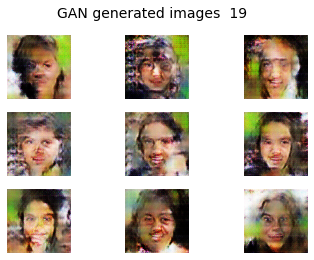

In [ ]:
## Build and train the model (need around 10 epochs to start seeing some results)

latent_dim = 256
discriminator, generator, gan = build_gan(dataset.shape[1:], latent_dim, filters=128)
dataset_scaled = load_real_samples(scale=True)

train_gan(generator, discriminator, gan, dataset_scaled, latent_dim, n_epochs=20)

## Kaggle Simpsons Faces

Download the dataset from [Kaggle](https://www.kaggle.com/datasets/kostastokis/simpsons-faces) and extract the contents to the working directory as a folder named `archive_simpsons`. The folder should contain the following subfolders: `cropped` and `simplified`. 

In [2]:
# We wrote this function based on https://www.pyimagedata.com/how-to-create-numpy-image-dataset/

def create_dataset():
    dataset = list()
    for image_name in tqdm(glob('archive_simpsons/cropped/*.png')):
        image_name = image_name.replace("\\","/")
        # load image with opencv
        image = cv2.imread(image_name, cv2.IMREAD_COLOR)
        
        # resize the image dimention with opencv
        if image is not None:
            image = cv2.resize(image, (64, 64))
        
            # append images and labels to python list
            dataset.append(image)
            
    np.random.shuffle(dataset) # shuffle the dataset

    return np.array(dataset)

100%|█████████████████████████████████████████████████████████████████████████████| 9877/9877 [00:23<00:00, 421.61it/s]


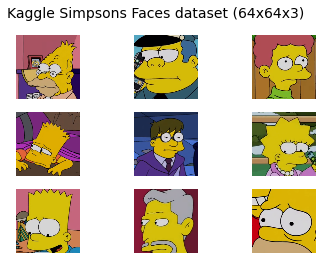

In [3]:
def load_real_samples(scale=False):
    X = create_dataset()
    # Scale samples in range [-127, 127]
    if scale:
        X = (X - 127.5) * 2
    # Reverse colour channels to get correct colours
    for imno in range(len(X)):
      for row in range(64):
        for col in range(64):
          temp = X[imno][row][col][0]
          X[imno][row][col][0] = X[imno][row][col][2]
          X[imno][row][col][2] = temp
    return X / 255.

# We will use this function to display the output of our models throughout this notebook
def grid_plot(images, epoch='', name='', n=3, save=False, scale=False):
    if scale:
        images = (images + 1) / 2.0
    for index in range(n * n):
        plt.subplot(n, n, 1 + index)
        plt.axis('off')
        plt.imshow(images[index])
    fig = plt.gcf()
    fig.suptitle(name + '  '+ str(epoch), fontsize=14)
    if save:
        filename = 'results/generated_plot_e%03d_f.png' % (epoch+1)
        plt.savefig(filename)
        plt.close()
    plt.show()

dataset = load_real_samples()
grid_plot(dataset[np.random.randint(0, 1000, 9)], name='Kaggle Simpsons Faces dataset (64x64x3)', n=3)

In [4]:
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Conv2DTranspose, Reshape

def build_conv_net(in_shape, out_shape, n_downsampling_layers=4, filters=128, out_activation='sigmoid'):
    """
    Build a basic convolutional network
    """
    model = tf.keras.Sequential()
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')

    model.add(Conv2D(input_shape=in_shape, **default_args, filters=filters))

    for _ in range(n_downsampling_layers):
        model.add(Conv2D(**default_args, filters=filters))

    model.add(Flatten())
    model.add(Dense(out_shape, activation=out_activation) )
    model.summary()
    return model


def build_deconv_net(latent_dim, n_upsampling_layers=4, filters=128, activation_out='sigmoid'):
    """
    Build a deconvolutional network for decoding/upscaling latent vectors

    When building the deconvolutional architecture, usually it is best to use the same layer sizes that 
    were used in the downsampling network and the Conv2DTranspose layers are used instead of Conv2D layers. 
    Using identical layers and hyperparameters ensures that the dimensionality of our output matches the
    shape of our input images. 
    """

    model = tf.keras.Sequential()
    model.add(Dense(4 * 4 * 64, input_dim=latent_dim)) 
    model.add(Reshape((4, 4, 64))) # This matches the output size of the downsampling architecture
    default_args=dict(kernel_size=(3,3), strides=(2,2), padding='same', activation='relu')
    
    for i in range(n_upsampling_layers):
        model.add(Conv2DTranspose(**default_args, filters=filters))

    # This last convolutional layer converts back to 3 channel RGB image
    model.add(Conv2D(filters=3, kernel_size=(3,3), activation=activation_out, padding='same'))
    model.summary()
    return model

In [5]:
class Sampling(tf.keras.layers.Layer):
    """
    Custom layer for the variational autoencoder
    It takes two vectors as input - one for means and other for variances of the latent variables described by a multimodal gaussian
    Its output is a latent vector randomly sampled from this distribution
    """
    def call(self, inputs):
        z_mean, z_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_var) * epsilon

def build_vae(data_shape, latent_dim, filters=128):

    # Building the encoder - starts with a simple downsampling convolutional network  
    encoder = build_conv_net(data_shape, latent_dim*2, filters=filters) # n_downsampling_layers=3?
    
    # Adding special sampling layer that uses the reparametrization trick 
    z_mean = Dense(latent_dim)(encoder.output)
    z_var = Dense(latent_dim)(encoder.output)
    z = Sampling()([z_mean, z_var])
    
    # Connecting the two encoder parts
    encoder = tf.keras.Model(inputs=encoder.input, outputs=z)

    # Defining the decoder which is a regular upsampling deconvolutional network
    decoder = build_deconv_net(latent_dim, activation_out='sigmoid', filters=filters)
    vae = tf.keras.Model(inputs=encoder.input, outputs=decoder(z))
    
    # Adding the special loss term
    kl_loss = -0.5 * tf.reduce_sum(z_var - tf.square(z_mean) - tf.exp(z_var) + 1)
    vae.add_loss(kl_loss/tf.cast(tf.keras.backend.prod(data_shape), tf.float32))

    vae.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3), loss='binary_crossentropy')

    return encoder, decoder, vae


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 32, 32, 128)       3584      
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 16, 128)       147584    
                                                                 
 conv2d_8 (Conv2D)           (None, 8, 8, 128)         147584    
                                                                 
 conv2d_9 (Conv2D)           (None, 4, 4, 128)         147584    
                                                                 
 conv2d_10 (Conv2D)          (None, 2, 2, 128)         147584    
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_4 (Dense)             (None, 64)               

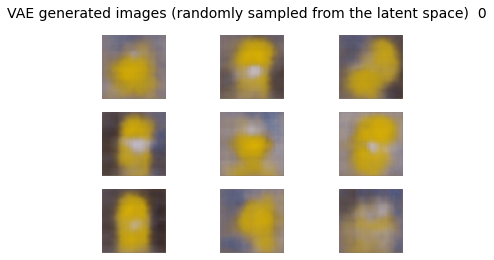

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5961


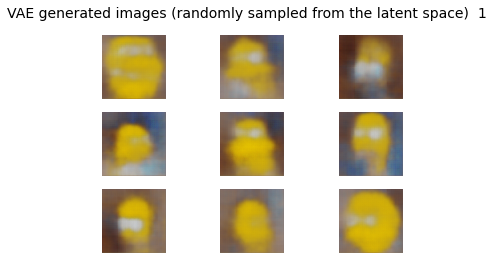

1235/1235 [==============================] - 58s 47ms/step - loss: 0.5903


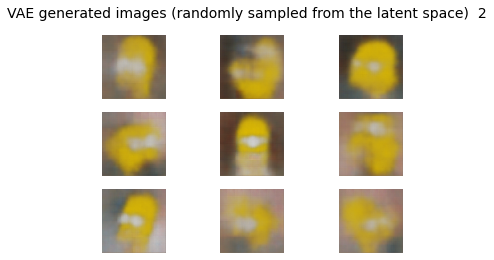

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5874


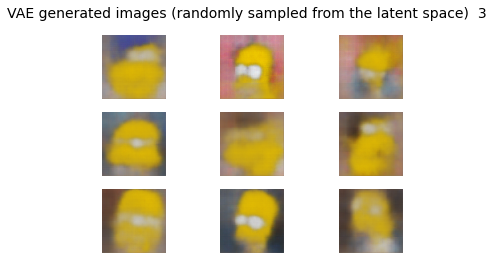

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5859


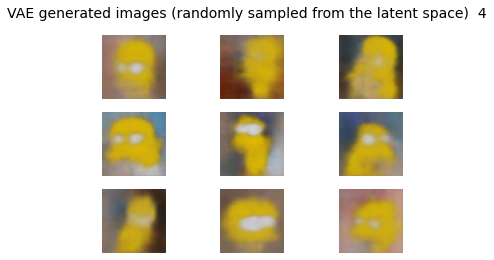

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5848


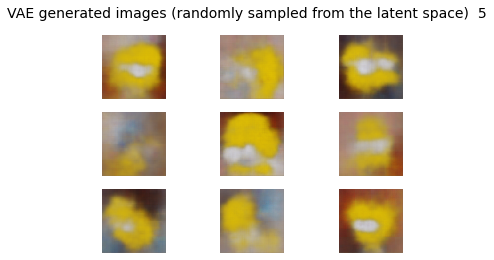

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5839


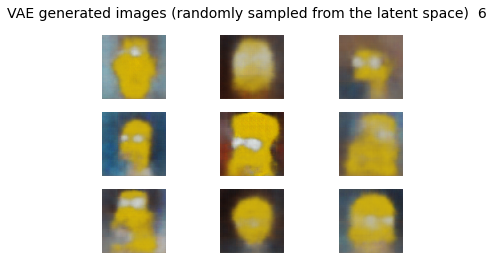

1235/1235 [==============================] - 57s 46ms/step - loss: 0.5832


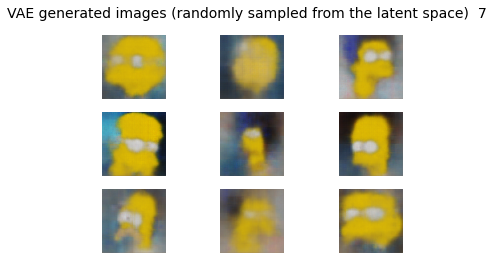

1235/1235 [==============================] - 58s 47ms/step - loss: 0.5825


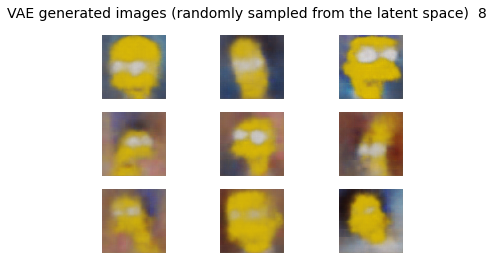

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5820


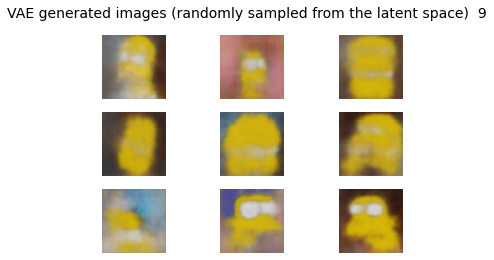

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5814


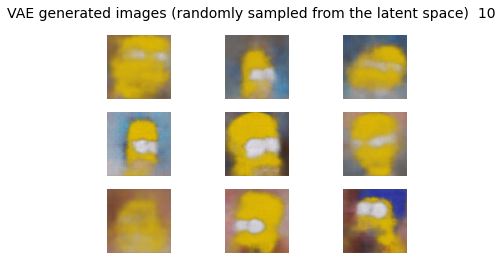

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5810


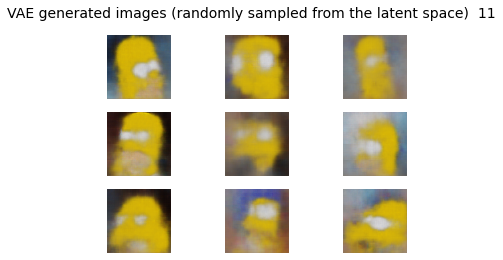

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5807


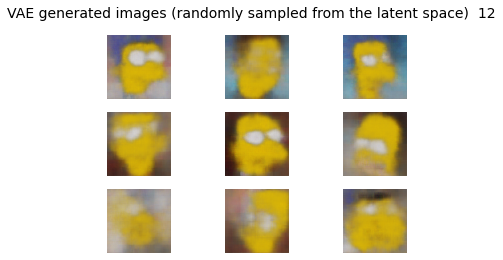

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5802


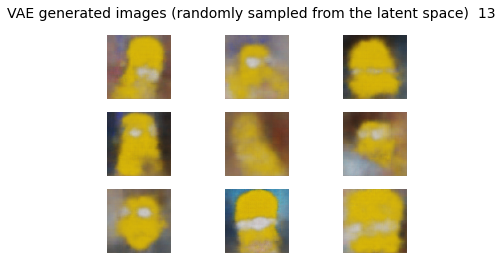

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5799


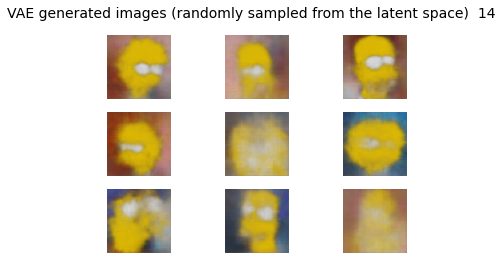

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5795


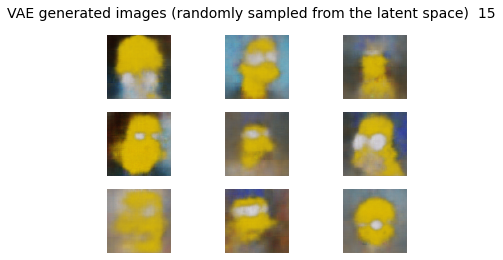

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5794


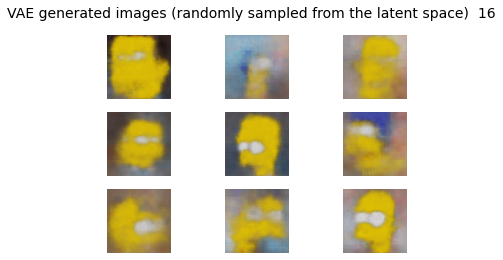

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5790


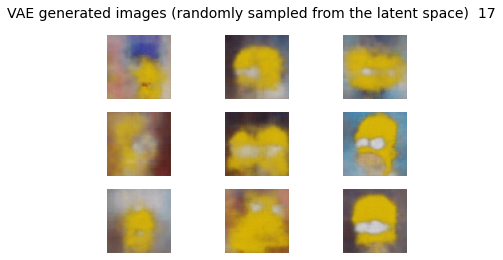

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5788


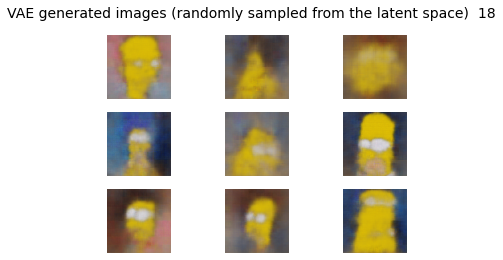

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5786


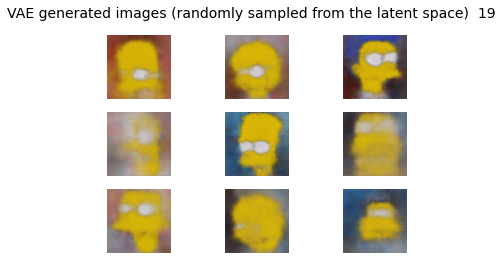

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5784


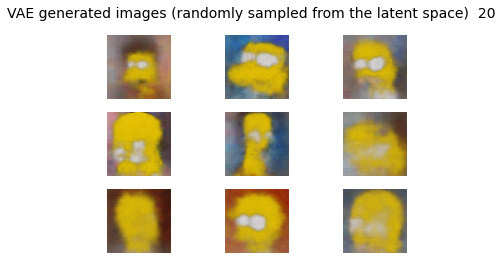

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5782


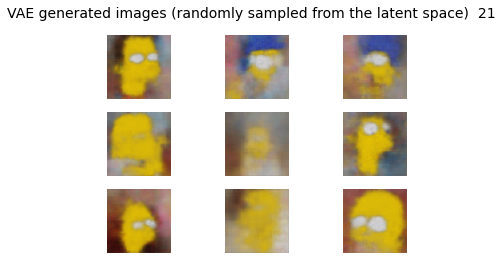

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5778


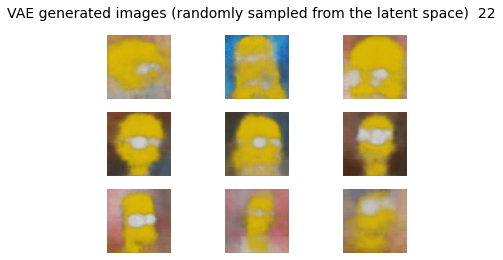

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5777


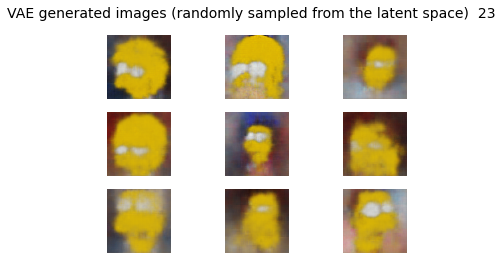

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5775


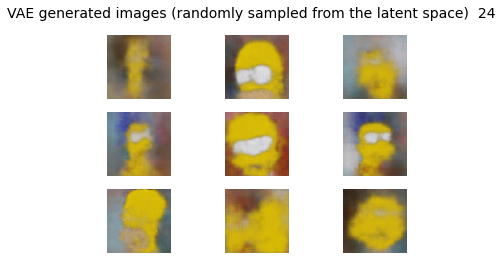

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5774


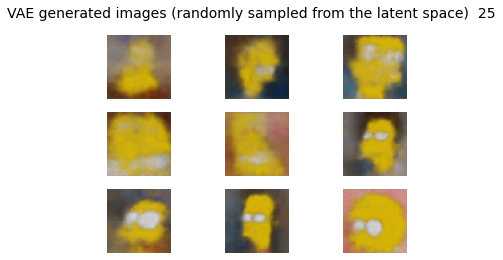

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5771


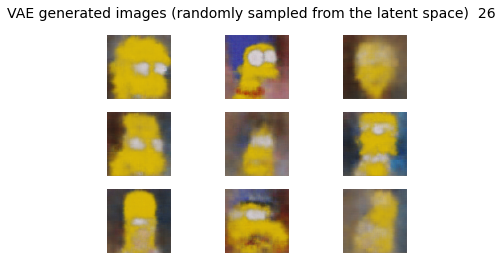

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5771


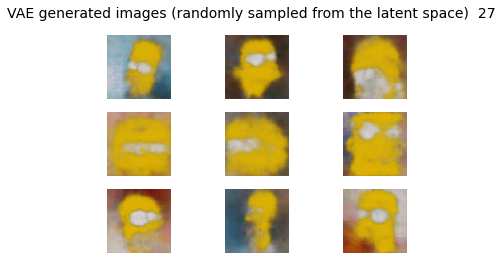

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5768


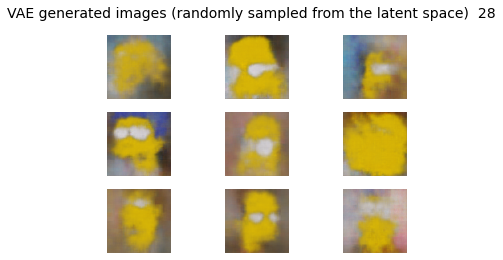

1235/1235 [==============================] - 56s 46ms/step - loss: 0.5767


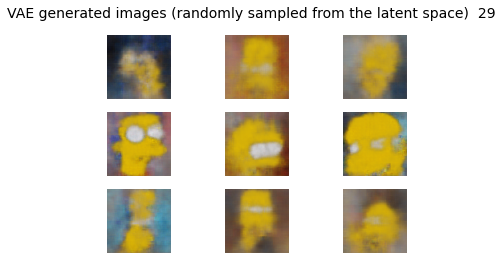

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5766


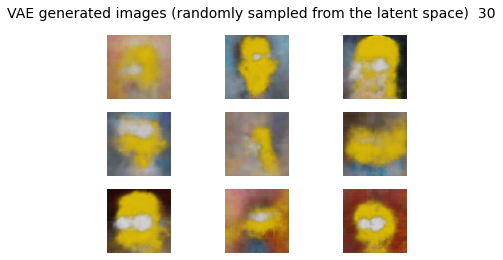

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5764


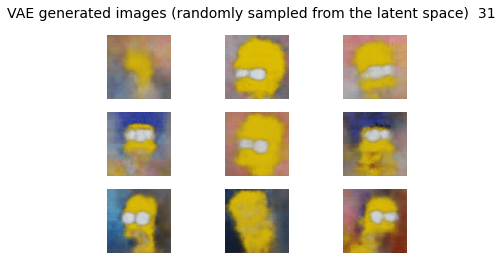

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5762


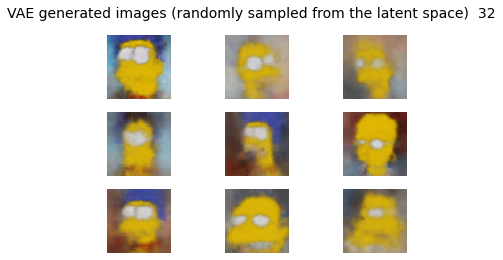

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5762


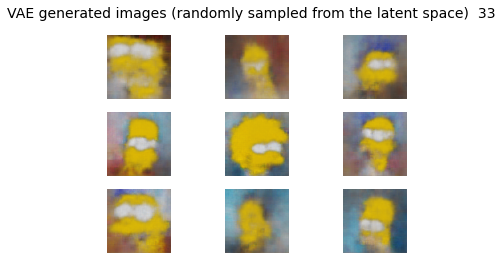

1235/1235 [==============================] - 56s 45ms/step - loss: 0.5760


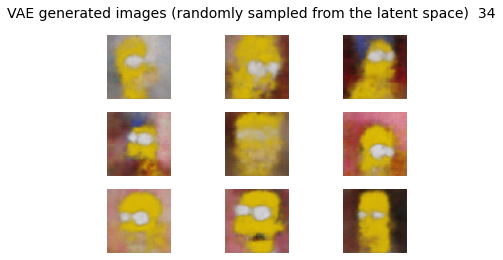

1235/1235 [==============================] - 857s 694ms/step - loss: 0.5759


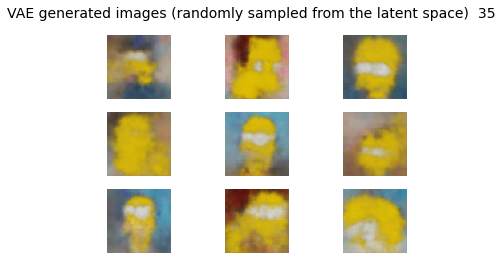

1235/1235 [==============================] - 54s 44ms/step - loss: 0.5758


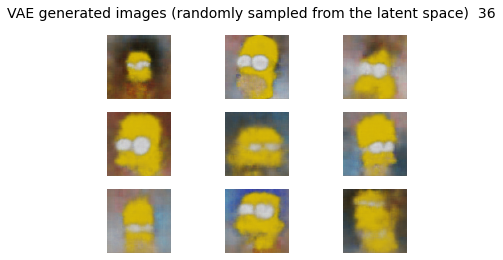

1235/1235 [==============================] - 46s 37ms/step - loss: 0.5755


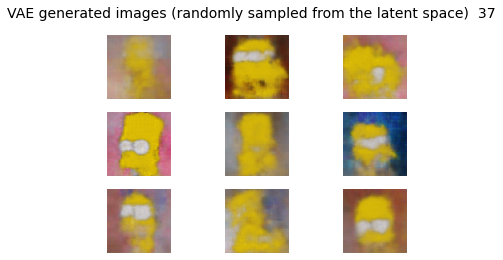

1235/1235 [==============================] - 46s 37ms/step - loss: 0.5755


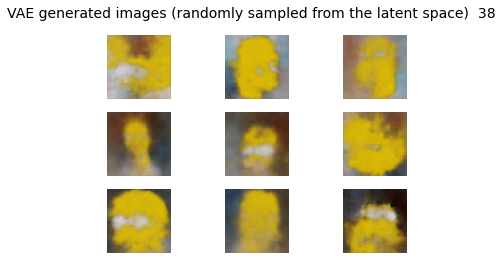

1235/1235 [==============================] - 46s 37ms/step - loss: 0.5755


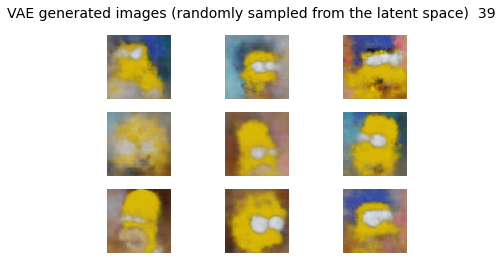

In [17]:
# Training the VAE model

latent_dim = 32
encoder, decoder, vae = build_vae(dataset.shape[1:], latent_dim, filters=128)

# Generate random vectors that we will use to sample our latent space
for epoch in range(40):
    latent_vectors = np.random.randn(9, latent_dim)
    vae.fit(x=dataset, y=dataset, epochs=1, batch_size=8)
    
    images = decoder(latent_vectors)
    grid_plot(images, epoch, name='VAE generated images (randomly sampled from the latent space)', n=3, save=False)

### Visualisation of interpolating between two points in latent space

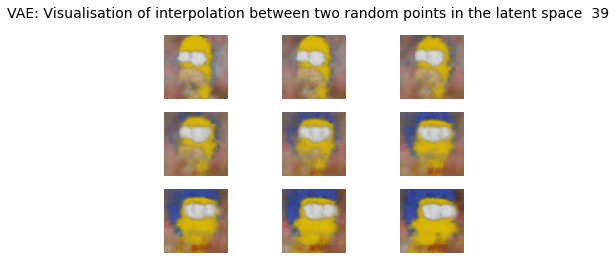

In [78]:
points = np.random.randn(2, latent_dim) # two random points in the latent space
diff = points[1]-points[0]
interpolated_points = np.array([points[0] + (i/9)*diff for i in range(9)])
images = decoder(interpolated_points)
grid_plot(images, epoch, name='VAE: Visualisation of interpolation between two random points in the latent space', n=3, save=False)

In [79]:
def build_gan(data_shape, latent_dim, filters=128, lr=0.0002, beta_1=0.5):
    optimizer = tf.optimizers.Adam(learning_rate=lr, beta_1=beta_1)

    # Usually thew GAN generator has tanh activation function in the output layer
    generator = build_deconv_net(latent_dim, activation_out='tanh', filters=filters)
    
    # Build and compile the discriminator
    discriminator = build_conv_net(in_shape=data_shape, out_shape=1, filters=filters) # Single output for binary classification
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    # End-to-end GAN model for training the generator
    discriminator.trainable = False
    true_fake_prediction = discriminator(generator.output)
    GAN = tf.keras.Model(inputs=generator.input, outputs=true_fake_prediction)
    GAN = tf.keras.models.Sequential([generator, discriminator])
    GAN.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    return discriminator, generator, GAN

In [80]:
def run_generator(generator, n_samples=100):
    """
    Run the generator model and generate n samples of synthetic images using random latent vectors
    """
    latent_dim = generator.layers[0].input_shape[-1]
    generator_input = np.random.randn(n_samples, latent_dim)

    return generator.predict(generator_input)
    

def get_batch(generator, dataset, batch_size=64):
    """
    Gets a single batch of samples (X) and labels (y) for the training the discriminator.
    One half from the real dataset (labeled as 1s), the other created by the generator model (labeled as 0s).
    """
    batch_size //= 2 # Split evenly among fake and real samples

    fake_data = run_generator(generator, n_samples=batch_size)
    real_data = dataset[np.random.randint(0, dataset.shape[0], batch_size)]

    X = np.concatenate([fake_data, real_data], axis=0)
    y = np.concatenate([np.zeros([batch_size, 1]), np.ones([batch_size, 1])], axis=0)

    return X, y


def train_gan(generator, discriminator, gan, dataset, latent_dim, n_epochs=20, batch_size=64):

    batches_per_epoch = int(dataset.shape[0] / batch_size / 2)
    for epoch in range(n_epochs):
        for batch in tqdm(range(batches_per_epoch)):
            
            # 1) Train discriminator both on real and synthesized images
            X, y = get_batch(generator, dataset, batch_size=batch_size)
            discriminator_loss = discriminator.train_on_batch(X, y)

            # 2) Train generator (note that now the label of synthetic images is reversed to 1)
            X_gan = np.random.randn(batch_size, latent_dim)
            y_gan = np.ones([batch_size, 1])
            generator_loss = gan.train_on_batch(X_gan, y_gan)

        noise = np.random.randn(16, latent_dim)
        images = generator.predict(noise)
        grid_plot(images, epoch, name='GAN: Visualisation of interpolation between two random points in the latent space', n=3, save=False, scale=True)


Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_12 (Dense)            (None, 1024)              263168    
                                                                 
 reshape_4 (Reshape)         (None, 4, 4, 64)          0         
                                                                 
 conv2d_transpose_16 (Conv2D  (None, 8, 8, 128)        73856     
 Transpose)                                                      
                                                                 
 conv2d_transpose_17 (Conv2D  (None, 16, 16, 128)      147584    
 Transpose)                                                      
                                                                 
 conv2d_transpose_18 (Conv2D  (None, 32, 32, 128)      147584    
 Transpose)                                                      
                                                     

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 482ms/step


  1%|█                                                                                  | 1/77 [00:05<06:45,  5.33s/it]

1/1 [==============================] - 0s 63ms/step


  3%|██▏                                                                                | 2/77 [00:05<03:06,  2.49s/it]

1/1 [==============================] - 0s 63ms/step


  4%|███▏                                                                               | 3/77 [00:06<01:57,  1.58s/it]

1/1 [==============================] - 0s 71ms/step


  5%|████▎                                                                              | 4/77 [00:06<01:24,  1.16s/it]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:07<01:05,  1.09it/s]

1/1 [==============================] - 0s 38ms/step


  8%|██████▍                                                                            | 6/77 [00:07<00:54,  1.30it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:08<00:47,  1.47it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:08<00:43,  1.60it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█████████▋                                                                         | 9/77 [00:09<00:39,  1.71it/s]

1/1 [==============================] - 0s 32ms/step


 13%|██████████▋                                                                       | 10/77 [00:09<00:36,  1.82it/s]

1/1 [==============================] - 0s 72ms/step


 14%|███████████▋                                                                      | 11/77 [00:10<00:34,  1.90it/s]

1/1 [==============================] - 0s 41ms/step


 16%|████████████▊                                                                     | 12/77 [00:10<00:33,  1.96it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:11<00:31,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:11<00:31,  2.02it/s]

1/1 [==============================] - 0s 63ms/step


 19%|███████████████▉                                                                  | 15/77 [00:12<00:30,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████████████                                                                 | 16/77 [00:12<00:30,  2.01it/s]

1/1 [==============================] - 0s 61ms/step


 22%|██████████████████                                                                | 17/77 [00:13<00:29,  2.01it/s]

1/1 [==============================] - 0s 63ms/step


 23%|███████████████████▏                                                              | 18/77 [00:13<00:29,  2.02it/s]

1/1 [==============================] - 0s 63ms/step


 25%|████████████████████▏                                                             | 19/77 [00:14<00:28,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:14<00:27,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:15<00:27,  2.06it/s]

1/1 [==============================] - 0s 67ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:15<00:26,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:16<00:26,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:16<00:25,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:17<00:25,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:17<00:24,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:18<00:24,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:18<00:23,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:18<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:19<00:22,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:19<00:22,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:20<00:21,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:20<00:21,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:21<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:21<00:20,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:22<00:20,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:22<00:19,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:23<00:18,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:23<00:18,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:24<00:18,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:24<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:25<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:25<00:16,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:26<00:15,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:26<00:15,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:28<00:26,  1.15it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:29<00:22,  1.33it/s]

1/1 [==============================] - 0s 49ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:29<00:19,  1.49it/s]

1/1 [==============================] - 0s 55ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:29<00:17,  1.63it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:30<00:15,  1.74it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:30<00:14,  1.82it/s]

1/1 [==============================] - 0s 37ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:31<00:13,  1.90it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:31<00:12,  1.95it/s]

1/1 [==============================] - 0s 55ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:32<00:11,  1.96it/s]

1/1 [==============================] - 0s 49ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:32<00:11,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:33<00:10,  2.03it/s]

1/1 [==============================] - 0s 50ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:33<00:09,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:34<00:09,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:34<00:08,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:35<00:08,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:35<00:07,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:36<00:07,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:36<00:06,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:37<00:06,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:37<00:05,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:38<00:05,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:38<00:04,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:39<00:04,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:39<00:03,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:40<00:03,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:40<00:02,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:41<00:02,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:41<00:01,  2.07it/s]

1/1 [==============================] - 0s 35ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:42<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:42<00:00,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:43<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:43<00:00,  1.77it/s]


1/1 [==============================] - 0s 394ms/step


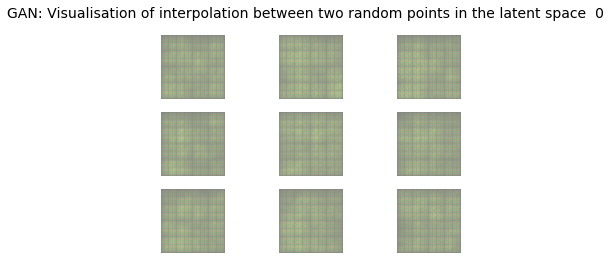

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:37,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.11it/s]

1/1 [==============================] - 0s 52ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.12it/s]

1/1 [==============================] - 0s 55ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.10it/s]

1/1 [==============================] - 0s 52ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:29,  2.13it/s]

1/1 [==============================] - 0s 58ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.10it/s]

1/1 [==============================] - 0s 34ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:28,  2.15it/s]

1/1 [==============================] - 0s 55ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 66ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.10it/s]

1/1 [==============================] - 0s 58ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.10it/s]

1/1 [==============================] - 0s 52ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.01it/s]

1/1 [==============================] - 0s 64ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:06,  1.99it/s]

1/1 [==============================] - 0s 44ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  1.98it/s]

1/1 [==============================] - 0s 64ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


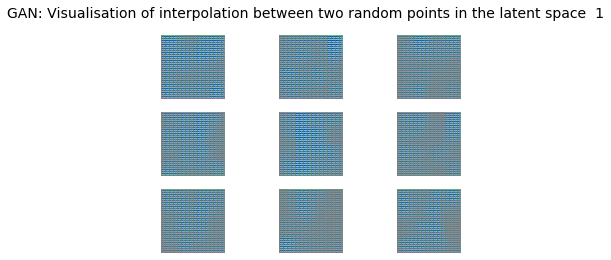

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


  1%|█                                                                                  | 1/77 [00:00<00:34,  2.20it/s]

1/1 [==============================] - 0s 50ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:34,  2.15it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.03it/s]

1/1 [==============================] - 0s 52ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 57ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 60ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 68ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.03it/s]

1/1 [==============================] - 0s 56ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.03it/s]

1/1 [==============================] - 0s 61ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.02it/s]

1/1 [==============================] - 0s 61ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.04it/s]

1/1 [==============================] - 0s 59ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 61ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.04it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.03it/s]

1/1 [==============================] - 0s 50ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.00it/s]

1/1 [==============================] - 0s 58ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.02it/s]

1/1 [==============================] - 0s 36ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.03it/s]

1/1 [==============================] - 0s 42ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


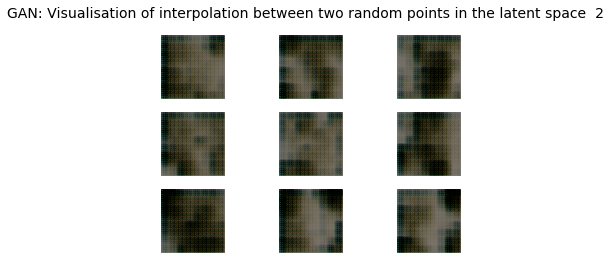

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 54ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.03it/s]

1/1 [==============================] - 0s 55ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.03it/s]

1/1 [==============================] - 0s 63ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.05it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 72ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.02it/s]

1/1 [==============================] - 0s 53ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:24,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 59ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:19,  2.11it/s]

1/1 [==============================] - 0s 63ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 57ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.05it/s]

1/1 [==============================] - 0s 60ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.11it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:11,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:10,  2.11it/s]

1/1 [==============================] - 0s 54ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.10it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.04it/s]

1/1 [==============================] - 0s 67ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.03it/s]

1/1 [==============================] - 0s 45ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.10it/s]

1/1 [==============================] - 0s 58ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.08it/s]

1/1 [==============================] - 0s 56ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


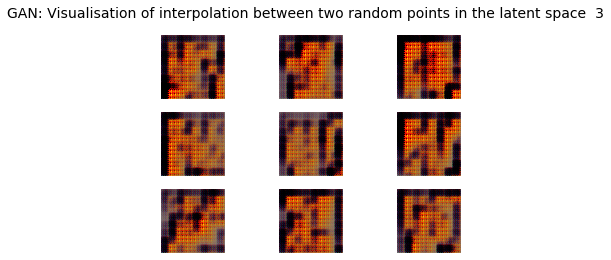

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.08it/s]

1/1 [==============================] - 0s 35ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.10it/s]

1/1 [==============================] - 0s 41ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:32,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.12it/s]

1/1 [==============================] - 0s 50ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.10it/s]

1/1 [==============================] - 0s 61ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.10it/s]

1/1 [==============================] - 0s 50ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.12it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.10it/s]

1/1 [==============================] - 0s 32ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:29,  2.15it/s]

1/1 [==============================] - 0s 49ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:28,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:10<00:25,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:24,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:23,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.10it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:23<00:12,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:10,  2.11it/s]

1/1 [==============================] - 0s 55ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:09,  2.11it/s]

1/1 [==============================] - 0s 35ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.12it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.11it/s]

1/1 [==============================] - 0s 45ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:34<00:01,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.10it/s]

1/1 [==============================] - 0s 52ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:35<00:00,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.11it/s]

1/1 [==============================] - 0s 62ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:36<00:00,  2.09it/s]


1/1 [==============================] - 0s 85ms/step


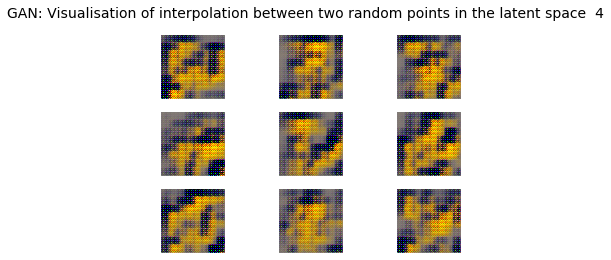

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 52ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:34,  2.19it/s]

1/1 [==============================] - 0s 55ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:33,  2.19it/s]

1/1 [==============================] - 0s 24ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:31,  2.30it/s]

1/1 [==============================] - 0s 51ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:32,  2.23it/s]

1/1 [==============================] - 0s 43ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:32,  2.16it/s]

1/1 [==============================] - 0s 50ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:32,  2.14it/s]

1/1 [==============================] - 0s 46ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:32,  2.12it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.11it/s]

1/1 [==============================] - 0s 33ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:28,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.10it/s]

1/1 [==============================] - 0s 62ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:29,  1.98it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:28,  1.97it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:28,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:27,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.03it/s]

1/1 [==============================] - 0s 57ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.09it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.10it/s]

1/1 [==============================] - 0s 62ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.00it/s]

1/1 [==============================] - 0s 51ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


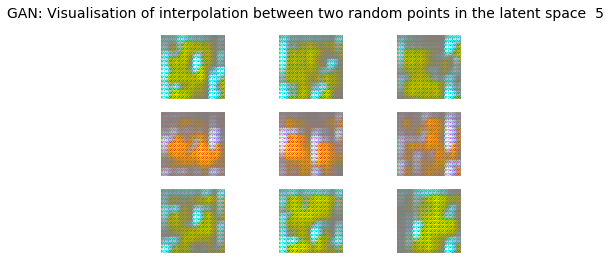

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 60ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 43ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 56ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.09it/s]

1/1 [==============================] - 0s 58ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


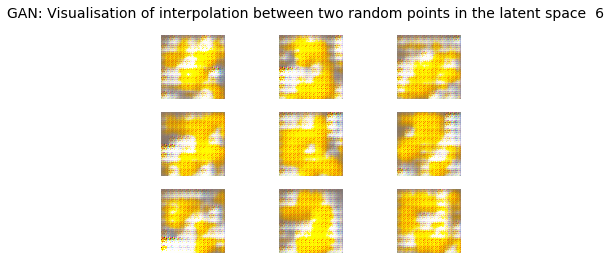

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 51ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.08it/s]

1/1 [==============================] - 0s 64ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.03it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.09it/s]

1/1 [==============================] - 0s 29ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.12it/s]

1/1 [==============================] - 0s 32ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.19it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.13it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:04,  1.99it/s]

1/1 [==============================] - 0s 98ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  1.82it/s]

1/1 [==============================] - 0s 64ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:03,  1.80it/s]

1/1 [==============================] - 0s 49ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  1.87it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:02,  1.93it/s]

1/1 [==============================] - 0s 59ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  1.96it/s]

1/1 [==============================] - 0s 54ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.00it/s]

1/1 [==============================] - 0s 41ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


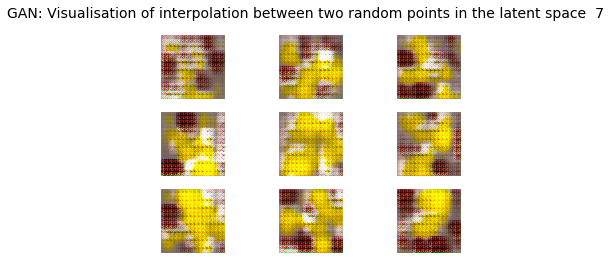

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


  1%|█                                                                                  | 1/77 [00:00<00:32,  2.33it/s]

1/1 [==============================] - 0s 36ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:33,  2.25it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.11it/s]

1/1 [==============================] - 0s 59ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.03it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.11it/s]

1/1 [==============================] - 0s 60ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 43ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 39ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:20<00:20,  1.72it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:19,  1.82it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:18,  1.88it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  1.94it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.00it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.02it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


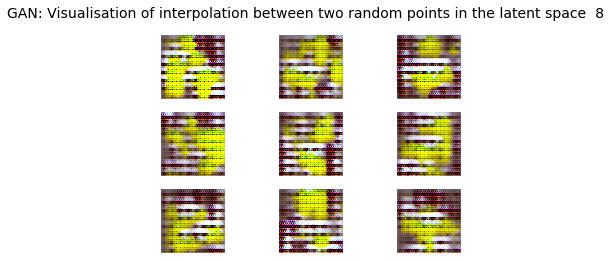

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.15it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.11it/s]

1/1 [==============================] - 0s 57ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 34ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.05it/s]

1/1 [==============================] - 0s 28ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 35ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


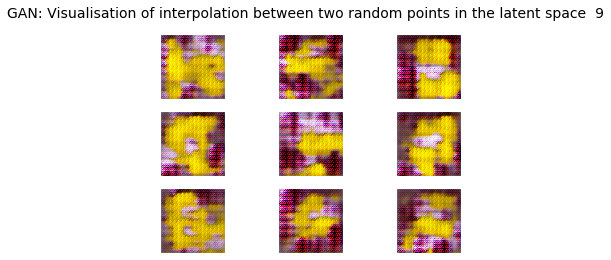

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 62ms/step


  1%|█                                                                                  | 1/77 [00:00<00:34,  2.17it/s]

1/1 [==============================] - 0s 52ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.08it/s]

1/1 [==============================] - 0s 23ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:30,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.11it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 58ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:24,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.09it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 19ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:13,  2.15it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:22<00:13,  2.13it/s]

1/1 [==============================] - 0s 55ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:23<00:12,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:11,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 26ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.11it/s]

1/1 [==============================] - 0s 57ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.10it/s]

1/1 [==============================] - 0s 50ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.11it/s]

1/1 [==============================] - 0s 53ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 65ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:35<00:00,  2.06it/s]

1/1 [==============================] - 0s 43ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


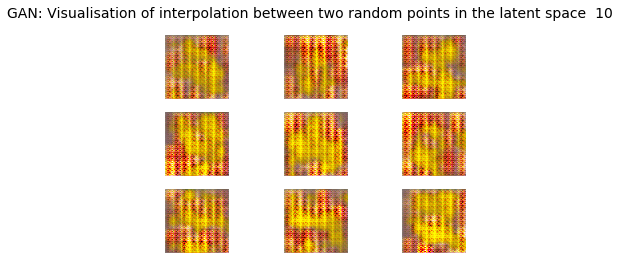

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 55ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.10it/s]

1/1 [==============================] - 0s 51ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.10it/s]

1/1 [==============================] - 0s 53ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.11it/s]

1/1 [==============================] - 0s 41ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.03it/s]

1/1 [==============================] - 0s 62ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  1.98it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:23,  2.12it/s]

1/1 [==============================] - 0s 31ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.12it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:22,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:21,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:20,  2.10it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.12it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:19,  2.12it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.12it/s]

1/1 [==============================] - 0s 42ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:18,  2.12it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.12it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.10it/s]

1/1 [==============================] - 0s 45ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.10it/s]

1/1 [==============================] - 0s 31ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.14it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.11it/s]

1/1 [==============================] - 0s 42ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.11it/s]

1/1 [==============================] - 0s 51ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 33ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.16it/s]

1/1 [==============================] - 0s 49ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:35<00:00,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.12it/s]

1/1 [==============================] - 0s 40ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


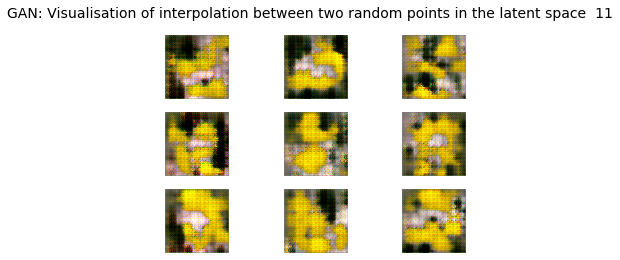

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.11it/s]

1/1 [==============================] - 0s 51ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:23,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:21,  2.14it/s]

1/1 [==============================] - 0s 44ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:21,  2.13it/s]

1/1 [==============================] - 0s 54ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 67ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:21,  2.01it/s]

1/1 [==============================] - 0s 61ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 57ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.05it/s]

1/1 [==============================] - 0s 59ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.14it/s]

1/1 [==============================] - 0s 52ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.12it/s]

1/1 [==============================] - 0s 49ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.12it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


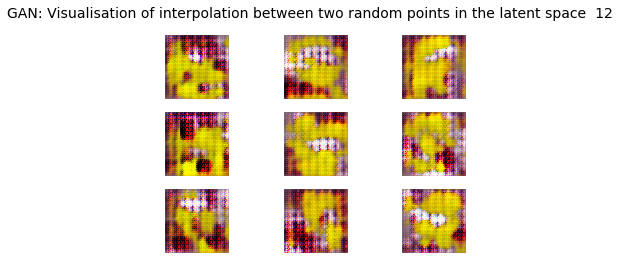

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 35ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.14it/s]

1/1 [==============================] - 0s 54ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 60ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.09it/s]

1/1 [==============================] - 0s 56ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 71ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 66ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:21,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.01it/s]

1/1 [==============================] - 0s 49ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.03it/s]

1/1 [==============================] - 0s 69ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.01it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.03it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 57ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 36ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.14it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.12it/s]

1/1 [==============================] - 0s 37ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.17it/s]

1/1 [==============================] - 0s 57ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:14,  2.14it/s]

1/1 [==============================] - 0s 59ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.11it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.10it/s]

1/1 [==============================] - 0s 57ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:13,  2.10it/s]

1/1 [==============================] - 0s 53ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.09it/s]

1/1 [==============================] - 0s 60ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.09it/s]

1/1 [==============================] - 0s 56ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:07,  2.15it/s]

1/1 [==============================] - 0s 63ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.13it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.14it/s]

1/1 [==============================] - 0s 38ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.23it/s]

1/1 [==============================] - 0s 22ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:03,  2.31it/s]

1/1 [==============================] - 0s 21ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:32<00:03,  2.33it/s]

1/1 [==============================] - 0s 29ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:02,  2.34it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:33<00:02,  2.16it/s]

1/1 [==============================] - 0s 82ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  1.92it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:02,  1.92it/s]

1/1 [==============================] - 0s 57ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  1.93it/s]

1/1 [==============================] - 0s 54ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:01,  1.96it/s]

1/1 [==============================] - 0s 49ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  1.99it/s]

1/1 [==============================] - 0s 49ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


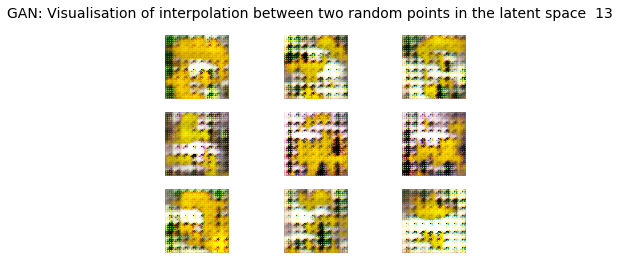

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


  1%|█                                                                                  | 1/77 [00:00<00:34,  2.18it/s]

1/1 [==============================] - 0s 50ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:34,  2.12it/s]

1/1 [==============================] - 0s 55ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.16it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:29,  2.22it/s]

1/1 [==============================] - 0s 35ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:28,  2.28it/s]

1/1 [==============================] - 0s 55ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:28,  2.24it/s]

1/1 [==============================] - 0s 52ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 64ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:31,  1.98it/s]

1/1 [==============================] - 0s 68ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:31,  1.94it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:30,  1.96it/s]

1/1 [==============================] - 0s 51ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:29,  1.99it/s]

1/1 [==============================] - 0s 46ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:28,  2.03it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:19,  2.15it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:19,  2.12it/s]

1/1 [==============================] - 0s 34ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.13it/s]

1/1 [==============================] - 0s 55ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.11it/s]

1/1 [==============================] - 0s 55ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.09it/s]

1/1 [==============================] - 0s 60ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 66ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:11,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.13it/s]

1/1 [==============================] - 0s 46ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:10,  2.11it/s]

1/1 [==============================] - 0s 59ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.14it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:09,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 36ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


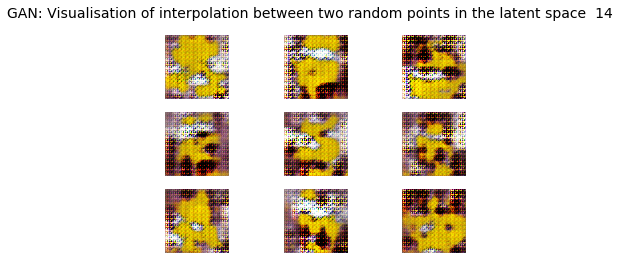

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 39ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 59ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.10it/s]

1/1 [==============================] - 0s 63ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:23,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.09it/s]

1/1 [==============================] - 0s 31ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:22,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.09it/s]

1/1 [==============================] - 0s 56ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:20,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:19,  2.11it/s]

1/1 [==============================] - 0s 54ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.11it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.11it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.11it/s]

1/1 [==============================] - 0s 61ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:22<00:13,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:23<00:12,  2.10it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:11,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 40ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 86ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.02it/s]

1/1 [==============================] - 0s 56ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.03it/s]

1/1 [==============================] - 0s 70ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.01it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.02it/s]

1/1 [==============================] - 0s 75ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  1.97it/s]

1/1 [==============================] - 0s 32ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.02it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.02it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


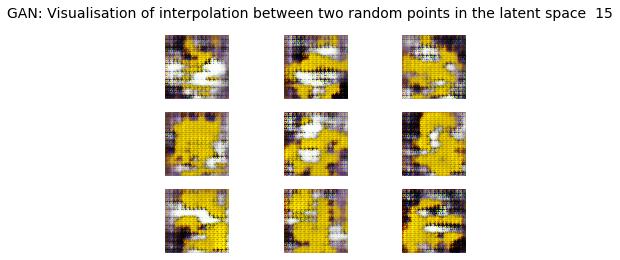

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 38ms/step


  1%|█                                                                                  | 1/77 [00:00<00:33,  2.24it/s]

1/1 [==============================] - 0s 56ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:34,  2.15it/s]

1/1 [==============================] - 0s 37ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 37ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:32,  2.15it/s]

1/1 [==============================] - 0s 50ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:32,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:32,  2.11it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 43ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.05it/s]

1/1 [==============================] - 0s 31ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.10it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.10it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:17,  2.12it/s]

1/1 [==============================] - 0s 49ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.12it/s]

1/1 [==============================] - 0s 43ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:19,  1.84it/s]

1/1 [==============================] - 0s 72ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:19,  1.82it/s]

1/1 [==============================] - 0s 79ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:21<00:19,  1.76it/s]

1/1 [==============================] - 0s 70ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:18,  1.76it/s]

1/1 [==============================] - 0s 66ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:22<00:17,  1.84it/s]

1/1 [==============================] - 0s 53ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:16,  1.86it/s]

1/1 [==============================] - 0s 89ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:23<00:17,  1.70it/s]

1/1 [==============================] - 0s 94ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:24<00:17,  1.63it/s]

1/1 [==============================] - 0s 75ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:24<00:16,  1.68it/s]

1/1 [==============================] - 0s 48ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:25<00:15,  1.78it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:25<00:13,  1.87it/s]

1/1 [==============================] - 0s 52ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:26<00:13,  1.91it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:26<00:12,  1.95it/s]

1/1 [==============================] - 0s 51ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:27<00:11,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:27<00:10,  2.03it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:29<00:08,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:33<00:04,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:34<00:03,  2.06it/s]

1/1 [==============================] - 0s 43ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:35<00:02,  2.11it/s]

1/1 [==============================] - 0s 52ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.09it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:36<00:01,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:38<00:00,  2.02it/s]

1/1 [==============================] - 0s 54ms/step


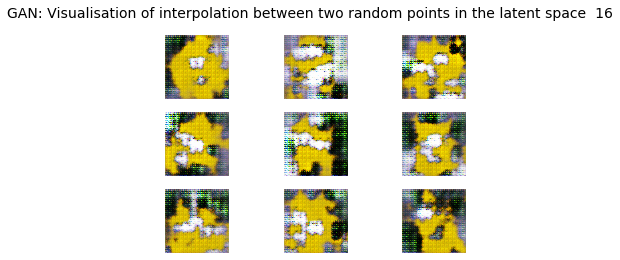

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 65ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.11it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:29,  2.15it/s]

1/1 [==============================] - 0s 40ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:28,  2.19it/s]

1/1 [==============================] - 0s 45ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.13it/s]

1/1 [==============================] - 0s 79ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:31,  1.93it/s]

1/1 [==============================] - 0s 102ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:33,  1.78it/s]

1/1 [==============================] - 0s 64ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:32,  1.83it/s]

1/1 [==============================] - 0s 69ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:31,  1.84it/s]

1/1 [==============================] - 0s 40ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:29,  1.92it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:28,  1.98it/s]

1/1 [==============================] - 0s 63ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:11<00:29,  1.87it/s]

1/1 [==============================] - 0s 97ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:31,  1.70it/s]

1/1 [==============================] - 0s 80ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:12<00:32,  1.65it/s]

1/1 [==============================] - 0s 55ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:30,  1.70it/s]

1/1 [==============================] - 0s 69ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:13<00:28,  1.79it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:26,  1.87it/s]

1/1 [==============================] - 0s 76ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:14<00:27,  1.80it/s]

1/1 [==============================] - 0s 96ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:15<00:27,  1.71it/s]

1/1 [==============================] - 0s 101ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:15<00:28,  1.64it/s]

1/1 [==============================] - 0s 50ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:16<00:27,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:16<00:25,  1.77it/s]

1/1 [==============================] - 0s 37ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:17<00:23,  1.88it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:17<00:22,  1.92it/s]

1/1 [==============================] - 0s 64ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:18<00:22,  1.89it/s]

1/1 [==============================] - 0s 115ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:19<00:24,  1.69it/s]

1/1 [==============================] - 0s 74ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:19<00:22,  1.76it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:20<00:21,  1.84it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:20<00:19,  1.90it/s]

1/1 [==============================] - 0s 48ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:21<00:19,  1.94it/s]

1/1 [==============================] - 0s 40ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:21<00:17,  2.02it/s]

1/1 [==============================] - 0s 48ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:22<00:17,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:22<00:16,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:22<00:15,  2.10it/s]

1/1 [==============================] - 0s 53ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:23<00:15,  2.05it/s]

1/1 [==============================] - 0s 59ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:23<00:15,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:24<00:14,  2.03it/s]

1/1 [==============================] - 0s 31ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:24<00:13,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:25<00:13,  2.11it/s]

1/1 [==============================] - 0s 45ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:25<00:13,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:26<00:13,  1.97it/s]

1/1 [==============================] - 0s 110ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:27<00:13,  1.85it/s]

1/1 [==============================] - 0s 38ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:27<00:12,  1.93it/s]

1/1 [==============================] - 0s 52ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:27<00:11,  2.02it/s]

1/1 [==============================] - 0s 50ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:28<00:10,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:28<00:10,  2.03it/s]

1/1 [==============================] - 0s 105ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:29<00:10,  1.84it/s]

1/1 [==============================] - 0s 82ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:30<00:10,  1.73it/s]

1/1 [==============================] - 0s 65ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:30<00:10,  1.73it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:31<00:09,  1.85it/s]

1/1 [==============================] - 0s 60ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:31<00:08,  1.91it/s]

1/1 [==============================] - 0s 40ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:32<00:07,  2.03it/s]

1/1 [==============================] - 0s 34ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:32<00:06,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:33<00:06,  2.12it/s]

1/1 [==============================] - 0s 70ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:33<00:06,  1.92it/s]

1/1 [==============================] - 0s 95ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:34<00:06,  1.79it/s]

1/1 [==============================] - 0s 57ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:34<00:05,  1.77it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:35<00:04,  1.87it/s]

1/1 [==============================] - 0s 55ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:35<00:04,  1.95it/s]

1/1 [==============================] - 0s 58ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:36<00:03,  1.96it/s]

1/1 [==============================] - 0s 55ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:36<00:03,  1.98it/s]

1/1 [==============================] - 0s 60ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:37<00:02,  1.87it/s]

1/1 [==============================] - 0s 89ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:38<00:02,  1.73it/s]

1/1 [==============================] - 0s 88ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:38<00:01,  1.72it/s]

1/1 [==============================] - 0s 58ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:39<00:01,  1.78it/s]

1/1 [==============================] - 0s 58ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:39<00:00,  1.82it/s]

1/1 [==============================] - 0s 36ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:40<00:00,  1.91it/s]

1/1 [==============================] - 0s 46ms/step


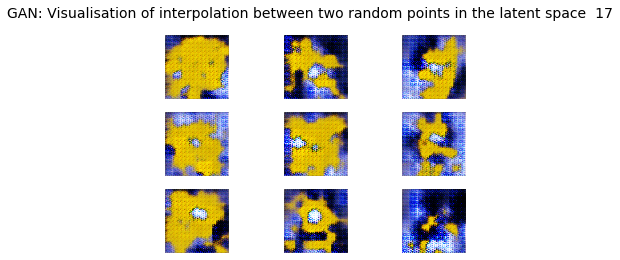

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 42ms/step


  1%|█                                                                                  | 1/77 [00:00<00:34,  2.21it/s]

1/1 [==============================] - 0s 46ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:34,  2.16it/s]

1/1 [==============================] - 0s 33ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:34,  2.17it/s]

1/1 [==============================] - 0s 55ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.11it/s]

1/1 [==============================] - 0s 65ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.02it/s]

1/1 [==============================] - 0s 102ms/step


  8%|██████▍                                                                            | 6/77 [00:03<00:38,  1.86it/s]

1/1 [==============================] - 0s 79ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:39,  1.76it/s]

1/1 [==============================] - 0s 59ms/step


 10%|████████▌                                                                          | 8/77 [00:04<00:37,  1.84it/s]

1/1 [==============================] - 0s 53ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:35,  1.91it/s]

1/1 [==============================] - 0s 39ms/step


 13%|██████████▋                                                                       | 10/77 [00:05<00:33,  2.02it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 32ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.15it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:29,  2.16it/s]

1/1 [==============================] - 0s 55ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 69ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:32,  1.93it/s]

1/1 [==============================] - 0s 84ms/step


 21%|█████████████████                                                                 | 16/77 [00:08<00:33,  1.84it/s]

1/1 [==============================] - 0s 59ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:31,  1.89it/s]

1/1 [==============================] - 0s 56ms/step


 23%|███████████████████▏                                                              | 18/77 [00:09<00:30,  1.94it/s]

1/1 [==============================] - 0s 43ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:29,  1.97it/s]

1/1 [==============================] - 0s 46ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:10<00:28,  2.02it/s]

1/1 [==============================] - 0s 76ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:12<00:26,  2.03it/s]

1/1 [==============================] - 0s 36ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:13<00:26,  1.93it/s]

1/1 [==============================] - 0s 95ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:28,  1.77it/s]

1/1 [==============================] - 0s 83ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:14<00:28,  1.74it/s]

1/1 [==============================] - 0s 56ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:26,  1.78it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:15<00:25,  1.86it/s]

1/1 [==============================] - 0s 37ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:23,  1.96it/s]

1/1 [==============================] - 0s 56ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:16<00:22,  1.99it/s]

1/1 [==============================] - 0s 111ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:24,  1.83it/s]

1/1 [==============================] - 0s 67ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:17<00:24,  1.76it/s]

1/1 [==============================] - 0s 63ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:18<00:23,  1.78it/s]

1/1 [==============================] - 0s 39ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:18<00:22,  1.85it/s]

1/1 [==============================] - 0s 59ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:19<00:20,  1.91it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:19<00:19,  1.95it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:20<00:19,  1.99it/s]

1/1 [==============================] - 0s 44ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:20<00:18,  2.00it/s]

1/1 [==============================] - 0s 53ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:21<00:17,  2.02it/s]

1/1 [==============================] - 0s 49ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:21<00:17,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:21<00:16,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:22<00:15,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:22<00:15,  2.13it/s]

1/1 [==============================] - 0s 56ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:23<00:14,  2.11it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:23<00:14,  2.10it/s]

1/1 [==============================] - 0s 34ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:24<00:13,  2.17it/s]

1/1 [==============================] - 0s 42ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:24<00:12,  2.16it/s]

1/1 [==============================] - 0s 58ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:25<00:12,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:25<00:12,  2.11it/s]

1/1 [==============================] - 0s 32ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:26<00:11,  2.15it/s]

1/1 [==============================] - 0s 46ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:26<00:11,  2.16it/s]

1/1 [==============================] - 0s 58ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:27<00:10,  2.12it/s]

1/1 [==============================] - 0s 59ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:27<00:10,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:28<00:10,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:28<00:09,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:29<00:09,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:29<00:08,  2.09it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:30<00:08,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:31<00:06,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:32<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:33<00:04,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:34<00:03,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:35<00:02,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:36<00:01,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.16it/s]

1/1 [==============================] - 0s 46ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:37<00:00,  2.14it/s]

1/1 [==============================] - 0s 39ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.13it/s]

1/1 [==============================] - 0s 63ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:38<00:00,  2.02it/s]


1/1 [==============================] - 0s 81ms/step


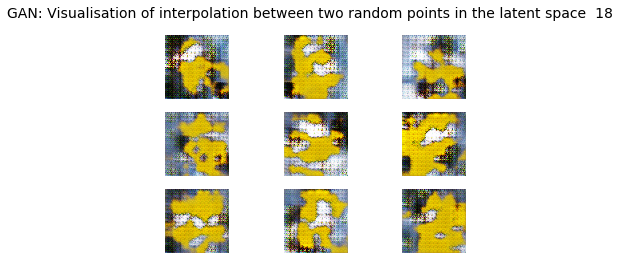

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 58ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 58ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.11it/s]

1/1 [==============================] - 0s 53ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.05it/s]

1/1 [==============================] - 0s 36ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.09it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.06it/s]

1/1 [==============================] - 0s 32ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 29ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.16it/s]

1/1 [==============================] - 0s 64ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.12it/s]

1/1 [==============================] - 0s 58ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


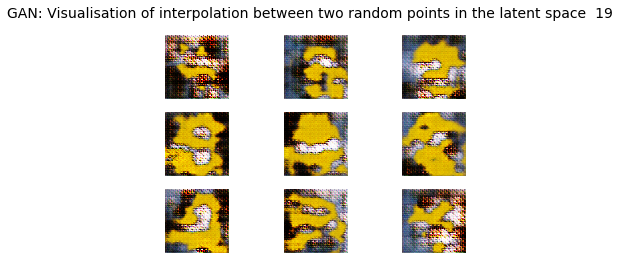

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 46ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.13it/s]

1/1 [==============================] - 0s 45ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 60ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 65ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 39ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.10it/s]

1/1 [==============================] - 0s 51ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.11it/s]

1/1 [==============================] - 0s 45ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.08it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 62ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.12it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.11it/s]

1/1 [==============================] - 0s 46ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.10it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 65ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 67ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.08it/s]

1/1 [==============================] - 0s 66ms/step


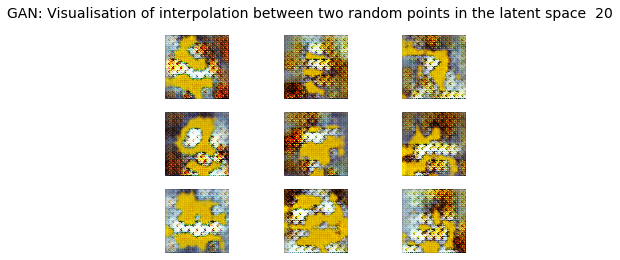

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 48ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.14it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.10it/s]

1/1 [==============================] - 0s 45ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 33ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.09it/s]

1/1 [==============================] - 0s 32ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.09it/s]

1/1 [==============================] - 0s 55ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.03it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  1.99it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:15,  2.00it/s]

1/1 [==============================] - 0s 36ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.02it/s]

1/1 [==============================] - 0s 50ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 38ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.11it/s]

1/1 [==============================] - 0s 56ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:10,  2.10it/s]

1/1 [==============================] - 0s 43ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:09,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.11it/s]

1/1 [==============================] - 0s 58ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.10it/s]

1/1 [==============================] - 0s 63ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 68ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


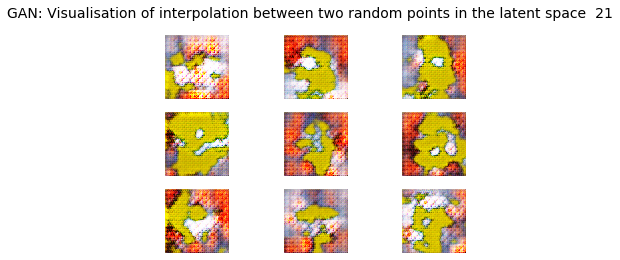

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 55ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:32,  2.12it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.11it/s]

1/1 [==============================] - 0s 59ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.13it/s]

1/1 [==============================] - 0s 49ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:29,  2.11it/s]

1/1 [==============================] - 0s 52ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.10it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.10it/s]

1/1 [==============================] - 0s 50ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.10it/s]

1/1 [==============================] - 0s 56ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:24,  2.08it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:23,  2.11it/s]

1/1 [==============================] - 0s 43ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:22,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.09it/s]

1/1 [==============================] - 0s 40ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 38ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.12it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.11it/s]

1/1 [==============================] - 0s 53ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.12it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:22<00:13,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.08it/s]

1/1 [==============================] - 0s 45ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:23<00:12,  2.13it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:11,  2.10it/s]

1/1 [==============================] - 0s 69ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 44ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.08it/s]

1/1 [==============================] - 0s 31ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.15it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 39ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.08it/s]

1/1 [==============================] - 0s 40ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.15it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.18it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:32<00:03,  2.14it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.11it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:33<00:02,  2.11it/s]

1/1 [==============================] - 0s 81ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.03it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:34<00:01,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:35<00:00,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:36<00:00,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


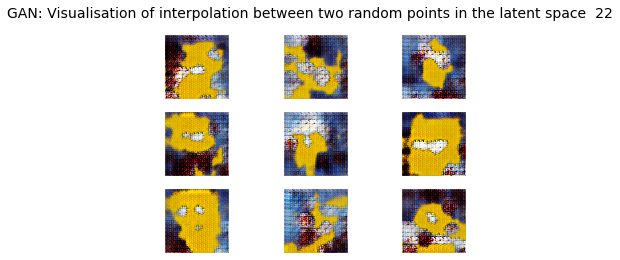

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


  1%|█                                                                                  | 1/77 [00:00<00:33,  2.27it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.13it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:34,  2.13it/s]

1/1 [==============================] - 0s 49ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:34,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.10it/s]

1/1 [==============================] - 0s 49ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 37ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.01it/s]

1/1 [==============================] - 0s 58ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.02it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 61ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.08it/s]

1/1 [==============================] - 0s 64ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 40ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 30ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.12it/s]

1/1 [==============================] - 0s 76ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 79ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


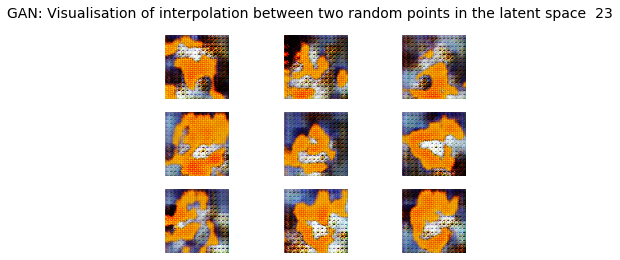

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.09it/s]

1/1 [==============================] - 0s 46ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 56ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:33,  2.12it/s]

1/1 [==============================] - 0s 36ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:32,  2.13it/s]

1/1 [==============================] - 0s 36ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:32,  2.15it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:31,  2.14it/s]

1/1 [==============================] - 0s 56ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.10it/s]

1/1 [==============================] - 0s 54ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 64ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:24,  2.11it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:23,  2.17it/s]

1/1 [==============================] - 0s 67ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 83ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:25,  1.91it/s]

1/1 [==============================] - 0s 118ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:28,  1.71it/s]

1/1 [==============================] - 0s 95ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:28,  1.66it/s]

1/1 [==============================] - 0s 79ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:27,  1.69it/s]

1/1 [==============================] - 0s 52ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:16<00:25,  1.77it/s]

1/1 [==============================] - 0s 61ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:24,  1.80it/s]

1/1 [==============================] - 0s 71ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:17<00:23,  1.79it/s]

1/1 [==============================] - 0s 63ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:23,  1.81it/s]

1/1 [==============================] - 0s 70ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:18<00:22,  1.86it/s]

1/1 [==============================] - 0s 45ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:20,  1.91it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:19<00:19,  1.96it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:19,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:20<00:18,  2.01it/s]

1/1 [==============================] - 0s 27ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:20<00:20,  1.75it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:21<00:18,  1.90it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:21<00:17,  1.97it/s]

1/1 [==============================] - 0s 45ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:22<00:16,  2.00it/s]

1/1 [==============================] - 0s 82ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:22<00:16,  1.89it/s]

1/1 [==============================] - 0s 92ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:23<00:16,  1.83it/s]

1/1 [==============================] - 0s 79ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:23<00:16,  1.82it/s]

1/1 [==============================] - 0s 50ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:24<00:15,  1.88it/s]

1/1 [==============================] - 0s 49ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:24<00:14,  1.96it/s]

1/1 [==============================] - 0s 51ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:25<00:13,  1.98it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:25<00:12,  2.00it/s]

1/1 [==============================] - 0s 38ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:26<00:11,  2.12it/s]

1/1 [==============================] - 0s 30ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:26<00:10,  2.19it/s]

1/1 [==============================] - 0s 54ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:27<00:10,  2.16it/s]

1/1 [==============================] - 0s 69ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:27<00:11,  1.98it/s]

1/1 [==============================] - 0s 83ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:28<00:11,  1.88it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:28<00:10,  1.90it/s]

1/1 [==============================] - 0s 57ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:29<00:10,  1.88it/s]

1/1 [==============================] - 0s 44ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:29<00:09,  1.97it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:30<00:08,  2.02it/s]

1/1 [==============================] - 0s 68ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:30<00:08,  1.92it/s]

1/1 [==============================] - 0s 111ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:31<00:08,  1.74it/s]

1/1 [==============================] - 0s 65ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:32<00:08,  1.72it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:32<00:07,  1.82it/s]

1/1 [==============================] - 0s 31ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:33<00:06,  1.93it/s]

1/1 [==============================] - 0s 39ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:33<00:05,  2.02it/s]

1/1 [==============================] - 0s 24ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:34<00:04,  2.12it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:34<00:04,  2.12it/s]

1/1 [==============================] - 0s 94ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:35<00:04,  1.96it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:35<00:03,  1.91it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:36<00:03,  1.93it/s]

1/1 [==============================] - 0s 53ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:36<00:02,  2.00it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:37<00:01,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:37<00:01,  2.16it/s]

1/1 [==============================] - 0s 46ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:37<00:00,  2.18it/s]

1/1 [==============================] - 0s 56ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:38<00:00,  2.05it/s]

1/1 [==============================] - 0s 79ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:39<00:00,  1.97it/s]

1/1 [==============================] - 0s 56ms/step


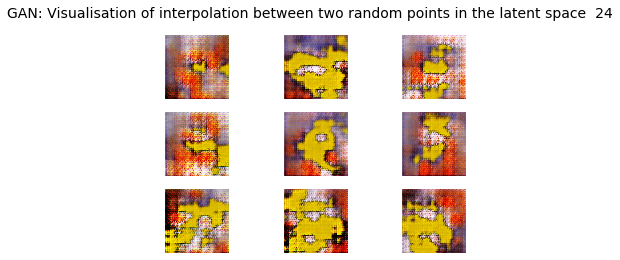

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 73ms/step


  1%|█                                                                                  | 1/77 [00:00<00:39,  1.92it/s]

1/1 [==============================] - 0s 46ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 61ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 42ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.10it/s]

1/1 [==============================] - 0s 51ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 34ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 51ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 28ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.04it/s]

1/1 [==============================] - 0s 58ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 58ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


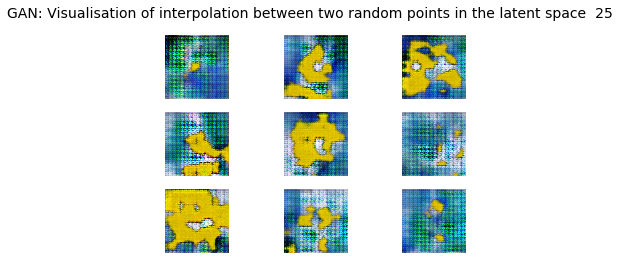

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 50ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.09it/s]

1/1 [==============================] - 0s 57ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:31,  2.12it/s]

1/1 [==============================] - 0s 61ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.11it/s]

1/1 [==============================] - 0s 57ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:30,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.09it/s]

1/1 [==============================] - 0s 35ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:29,  2.13it/s]

1/1 [==============================] - 0s 49ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.13it/s]

1/1 [==============================] - 0s 61ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.09it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:10<00:25,  2.09it/s]

1/1 [==============================] - 0s 48ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:11<00:24,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 37ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:13<00:23,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.14it/s]

1/1 [==============================] - 0s 56ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:19,  2.11it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.09it/s]

1/1 [==============================] - 0s 50ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.10it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.08it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.09it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.09it/s]

1/1 [==============================] - 0s 49ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.12it/s]

1/1 [==============================] - 0s 41ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.13it/s]

1/1 [==============================] - 0s 63ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 81ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  1.89it/s]

1/1 [==============================] - 0s 67ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.07it/s]


1/1 [==============================] - 0s 89ms/step


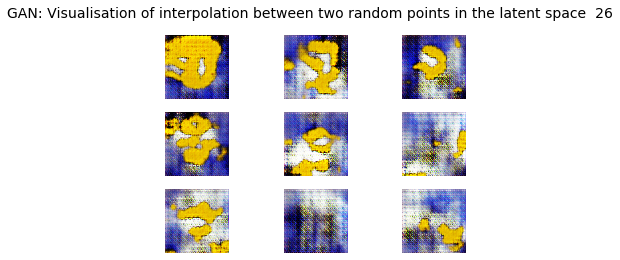

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 28ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.14it/s]

1/1 [==============================] - 0s 54ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.11it/s]

1/1 [==============================] - 0s 60ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.10it/s]

1/1 [==============================] - 0s 48ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 40ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 62ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.03it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.02it/s]

1/1 [==============================] - 0s 45ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.03it/s]

1/1 [==============================] - 0s 42ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.03it/s]

1/1 [==============================] - 0s 52ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:08,  2.00it/s]

1/1 [==============================] - 0s 49ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.03it/s]

1/1 [==============================] - 0s 62ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 65ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.04it/s]

1/1 [==============================] - 0s 45ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 34ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.03it/s]

1/1 [==============================] - 0s 56ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.03it/s]

1/1 [==============================] - 0s 44ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


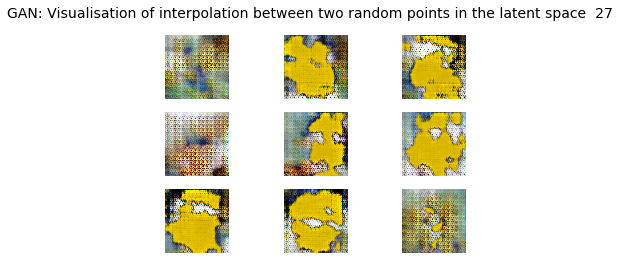

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 59ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.11it/s]

1/1 [==============================] - 0s 61ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.09it/s]

1/1 [==============================] - 0s 54ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 43ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.05it/s]

1/1 [==============================] - 0s 60ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.02it/s]

1/1 [==============================] - 0s 30ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 64ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.05it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


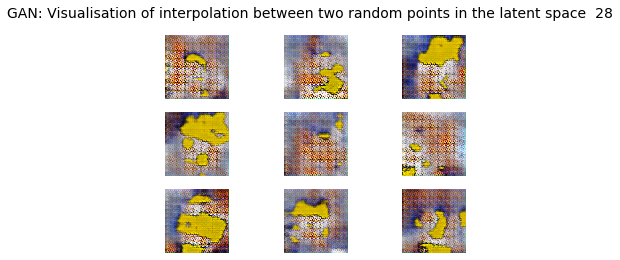

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 34ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 39ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 32ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


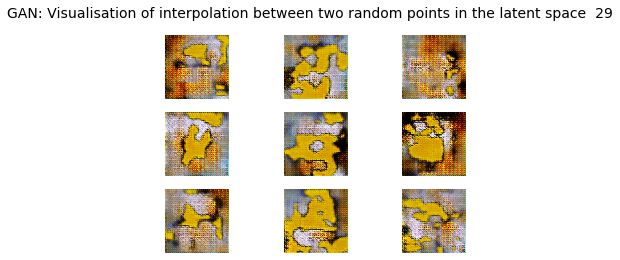

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 79ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:35,  1.97it/s]

1/1 [==============================] - 0s 52ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:34,  1.98it/s]

1/1 [==============================] - 0s 63ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:33,  2.00it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:32,  2.03it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:32,  1.98it/s]

1/1 [==============================] - 0s 36ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.07it/s]

1/1 [==============================] - 0s 41ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 42ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.03it/s]

1/1 [==============================] - 0s 62ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 44ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


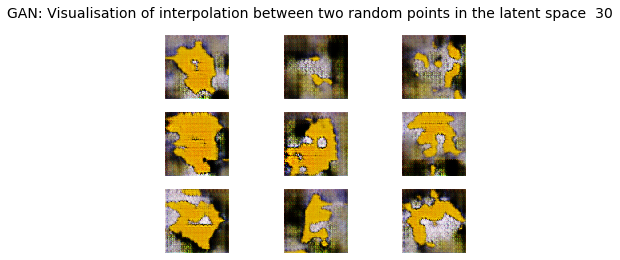

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 47ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.04it/s]

1/1 [==============================] - 0s 37ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 41ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 34ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.07it/s]

1/1 [==============================] - 0s 44ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


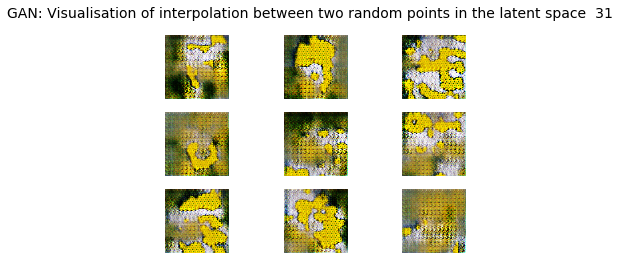

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  1%|█                                                                                  | 1/77 [00:00<00:36,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.08it/s]

1/1 [==============================] - 0s 52ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:30,  2.03it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.05it/s]

1/1 [==============================] - 0s 61ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 39ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:20<00:21,  1.71it/s]

1/1 [==============================] - 0s 47ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:19,  1.80it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:21<00:18,  1.89it/s]

1/1 [==============================] - 0s 56ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:17,  1.93it/s]

1/1 [==============================] - 0s 47ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:22<00:16,  1.97it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  1.99it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:23<00:14,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:24<00:13,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.04it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:04,  1.97it/s]

1/1 [==============================] - 0s 63ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


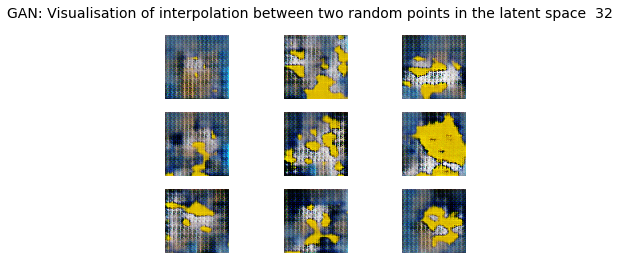

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 48ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:29,  2.14it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:29,  2.13it/s]

1/1 [==============================] - 0s 55ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:29,  2.03it/s]

1/1 [==============================] - 0s 62ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:29,  1.97it/s]

1/1 [==============================] - 0s 53ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:28,  2.00it/s]

1/1 [==============================] - 0s 63ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:27,  2.02it/s]

1/1 [==============================] - 0s 63ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.01it/s]

1/1 [==============================] - 0s 47ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.02it/s]

1/1 [==============================] - 0s 63ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:21,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.04it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.04it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.05it/s]

1/1 [==============================] - 0s 62ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 60ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.04it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 52ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.04it/s]

1/1 [==============================] - 0s 58ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


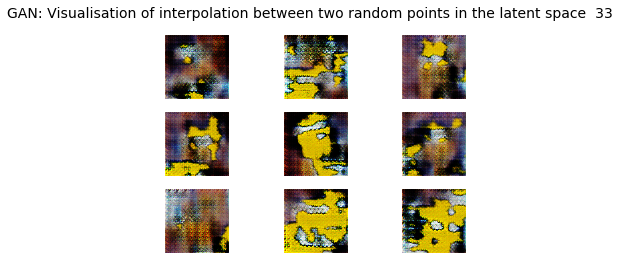

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 44ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 59ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 60ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.05it/s]

1/1 [==============================] - 0s 39ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.05it/s]

1/1 [==============================] - 0s 40ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.06it/s]

1/1 [==============================] - 0s 26ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:24,  2.14it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:24,  2.13it/s]

1/1 [==============================] - 0s 63ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.10it/s]

1/1 [==============================] - 0s 47ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:23,  2.09it/s]

1/1 [==============================] - 0s 52ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 55ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:14<00:22,  2.07it/s]

1/1 [==============================] - 0s 53ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:19,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.03it/s]

1/1 [==============================] - 0s 53ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:12,  2.00it/s]

1/1 [==============================] - 0s 55ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.03it/s]

1/1 [==============================] - 0s 63ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.04it/s]

1/1 [==============================] - 0s 66ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.05it/s]

1/1 [==============================] - 0s 35ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.05it/s]

1/1 [==============================] - 0s 43ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 64ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


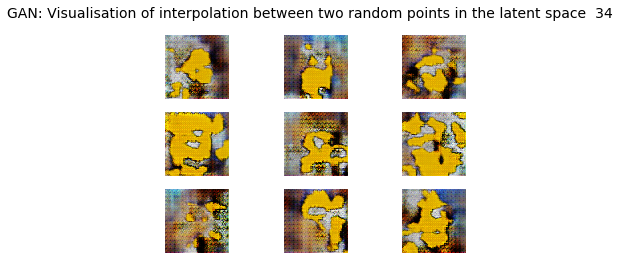

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.04it/s]

1/1 [==============================] - 0s 58ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.04it/s]

1/1 [==============================] - 0s 59ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.04it/s]

1/1 [==============================] - 0s 55ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.04it/s]

1/1 [==============================] - 0s 53ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.04it/s]

1/1 [==============================] - 0s 60ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.11it/s]

1/1 [==============================] - 0s 56ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.09it/s]

1/1 [==============================] - 0s 59ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.03it/s]

1/1 [==============================] - 0s 63ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.03it/s]

1/1 [==============================] - 0s 57ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 61ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 42ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:24,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.05it/s]

1/1 [==============================] - 0s 57ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.05it/s]

1/1 [==============================] - 0s 62ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:20,  2.04it/s]

1/1 [==============================] - 0s 40ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:19,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:18,  2.03it/s]

1/1 [==============================] - 0s 51ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.04it/s]

1/1 [==============================] - 0s 62ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.03it/s]

1/1 [==============================] - 0s 48ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 43ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 73ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


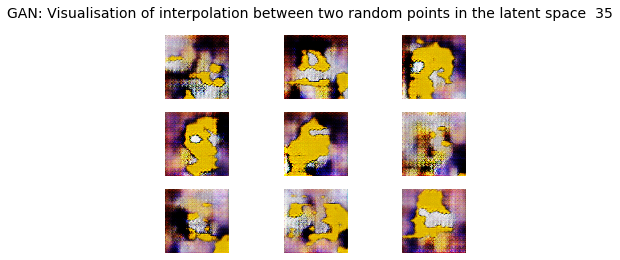

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 63ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.03it/s]

1/1 [==============================] - 0s 49ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:36,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.05it/s]

1/1 [==============================] - 0s 44ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.05it/s]

1/1 [==============================] - 0s 56ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:32,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.04it/s]

1/1 [==============================] - 0s 62ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.07it/s]

1/1 [==============================] - 0s 30ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:25,  2.15it/s]

1/1 [==============================] - 0s 58ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:25,  2.13it/s]

1/1 [==============================] - 0s 58ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.01it/s]

1/1 [==============================] - 0s 56ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.02it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:25,  2.03it/s]

1/1 [==============================] - 0s 63ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:25,  1.98it/s]

1/1 [==============================] - 0s 52ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:24,  1.97it/s]

1/1 [==============================] - 0s 50ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:24,  1.96it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:23,  1.96it/s]

1/1 [==============================] - 0s 74ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:23,  1.97it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:22,  1.98it/s]

1/1 [==============================] - 0s 71ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:22,  1.97it/s]

1/1 [==============================] - 0s 61ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:21,  1.99it/s]

1/1 [==============================] - 0s 61ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.01it/s]

1/1 [==============================] - 0s 48ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.08it/s]

1/1 [==============================] - 0s 49ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:18<00:18,  2.11it/s]

1/1 [==============================] - 0s 63ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.09it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:19<00:18,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:20<00:17,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:21<00:16,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.05it/s]

1/1 [==============================] - 0s 65ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:22<00:15,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.06it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.08it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.08it/s]

1/1 [==============================] - 0s 62ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:36<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.05it/s]

1/1 [==============================] - 0s 41ms/step


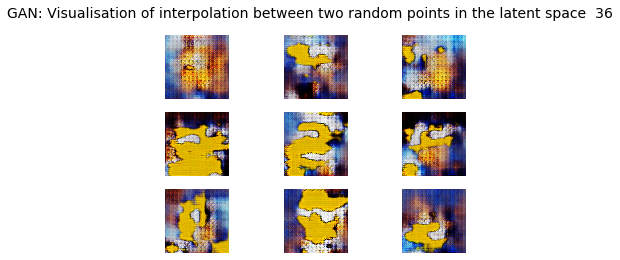

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 62ms/step


  1%|█                                                                                  | 1/77 [00:00<00:34,  2.19it/s]

1/1 [==============================] - 0s 47ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.09it/s]

1/1 [==============================] - 0s 45ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:34,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:34,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.10it/s]

1/1 [==============================] - 0s 55ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:29,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.07it/s]

1/1 [==============================] - 0s 48ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 42ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.05it/s]

1/1 [==============================] - 0s 45ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 63ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.04it/s]

1/1 [==============================] - 0s 46ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.07it/s]

1/1 [==============================] - 0s 42ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.07it/s]

1/1 [==============================] - 0s 50ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.05it/s]

1/1 [==============================] - 0s 60ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.04it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 42ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


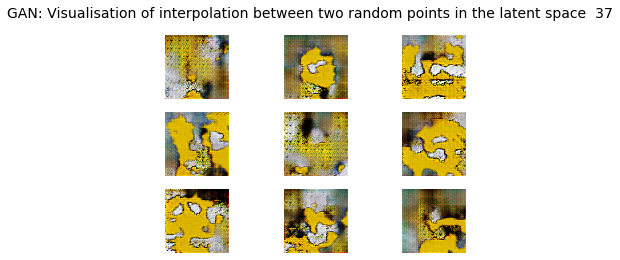

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


  1%|█                                                                                  | 1/77 [00:00<00:37,  2.02it/s]

1/1 [==============================] - 0s 45ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:36,  2.03it/s]

1/1 [==============================] - 0s 51ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.04it/s]

1/1 [==============================] - 0s 63ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 46ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 56ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:31,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.05it/s]

1/1 [==============================] - 0s 60ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.07it/s]

1/1 [==============================] - 0s 49ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:27,  2.08it/s]

1/1 [==============================] - 0s 59ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:27,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.07it/s]

1/1 [==============================] - 0s 52ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:25,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:24,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 64ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 48ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:22,  2.04it/s]

1/1 [==============================] - 0s 50ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:17<00:20,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.05it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:17,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.08it/s]

1/1 [==============================] - 0s 55ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:15,  2.08it/s]

1/1 [==============================] - 0s 56ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:14,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:13,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.06it/s]

1/1 [==============================] - 0s 50ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.06it/s]

1/1 [==============================] - 0s 61ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.05it/s]

1/1 [==============================] - 0s 57ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.05it/s]

1/1 [==============================] - 0s 76ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.03it/s]

1/1 [==============================] - 0s 59ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.05it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.05it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.05it/s]

1/1 [==============================] - 0s 62ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.06it/s]

1/1 [==============================] - 0s 63ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:33<00:04,  2.05it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.06it/s]

1/1 [==============================] - 0s 59ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:34<00:03,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 62ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:35<00:02,  2.04it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.05it/s]

1/1 [==============================] - 0s 53ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 48ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.05it/s]

1/1 [==============================] - 0s 52ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 52ms/step


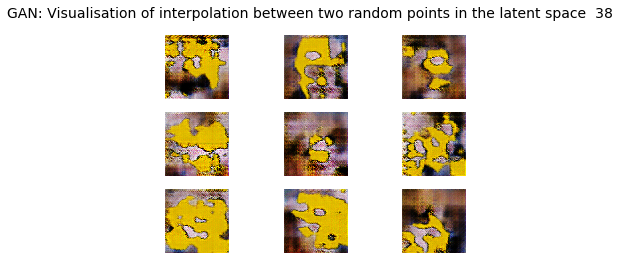

  0%|                                                                                           | 0/77 [00:00<?, ?it/s]

1/1 [==============================] - 0s 56ms/step


  1%|█                                                                                  | 1/77 [00:00<00:35,  2.12it/s]

1/1 [==============================] - 0s 52ms/step


  3%|██▏                                                                                | 2/77 [00:00<00:35,  2.09it/s]

1/1 [==============================] - 0s 63ms/step


  4%|███▏                                                                               | 3/77 [00:01<00:35,  2.07it/s]

1/1 [==============================] - 0s 61ms/step


  5%|████▎                                                                              | 4/77 [00:01<00:35,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


  6%|█████▍                                                                             | 5/77 [00:02<00:35,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


  8%|██████▍                                                                            | 6/77 [00:02<00:34,  2.07it/s]

1/1 [==============================] - 0s 51ms/step


  9%|███████▌                                                                           | 7/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 53ms/step


 10%|████████▌                                                                          | 8/77 [00:03<00:33,  2.06it/s]

1/1 [==============================] - 0s 62ms/step


 12%|█████████▋                                                                         | 9/77 [00:04<00:33,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 13%|██████████▋                                                                       | 10/77 [00:04<00:32,  2.07it/s]

1/1 [==============================] - 0s 56ms/step


 14%|███████████▋                                                                      | 11/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 53ms/step


 16%|████████████▊                                                                     | 12/77 [00:05<00:31,  2.08it/s]

1/1 [==============================] - 0s 67ms/step


 17%|█████████████▊                                                                    | 13/77 [00:06<00:30,  2.07it/s]

1/1 [==============================] - 0s 59ms/step


 18%|██████████████▉                                                                   | 14/77 [00:06<00:30,  2.06it/s]

1/1 [==============================] - 0s 56ms/step


 19%|███████████████▉                                                                  | 15/77 [00:07<00:30,  2.05it/s]

1/1 [==============================] - 0s 63ms/step


 21%|█████████████████                                                                 | 16/77 [00:07<00:29,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██████████████████                                                                | 17/77 [00:08<00:29,  2.05it/s]

1/1 [==============================] - 0s 55ms/step


 23%|███████████████████▏                                                              | 18/77 [00:08<00:28,  2.05it/s]

1/1 [==============================] - 0s 46ms/step


 25%|████████████████████▏                                                             | 19/77 [00:09<00:28,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 26%|█████████████████████▎                                                            | 20/77 [00:09<00:27,  2.06it/s]

1/1 [==============================] - 0s 64ms/step


 27%|██████████████████████▎                                                           | 21/77 [00:10<00:26,  2.08it/s]

1/1 [==============================] - 0s 54ms/step


 29%|███████████████████████▍                                                          | 22/77 [00:10<00:26,  2.06it/s]

1/1 [==============================] - 0s 58ms/step


 30%|████████████████████████▍                                                         | 23/77 [00:11<00:26,  2.04it/s]

1/1 [==============================] - 0s 53ms/step


 31%|█████████████████████████▌                                                        | 24/77 [00:11<00:26,  2.02it/s]

1/1 [==============================] - 0s 46ms/step


 32%|██████████████████████████▌                                                       | 25/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███████████████████████████▋                                                      | 26/77 [00:12<00:25,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 35%|████████████████████████████▊                                                     | 27/77 [00:13<00:24,  2.06it/s]

1/1 [==============================] - 0s 51ms/step


 36%|█████████████████████████████▊                                                    | 28/77 [00:13<00:23,  2.05it/s]

1/1 [==============================] - 0s 62ms/step


 38%|██████████████████████████████▉                                                   | 29/77 [00:14<00:23,  2.04it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███████████████████████████████▉                                                  | 30/77 [00:14<00:22,  2.06it/s]

1/1 [==============================] - 0s 54ms/step


 40%|█████████████████████████████████                                                 | 31/77 [00:15<00:22,  2.08it/s]

1/1 [==============================] - 0s 50ms/step


 42%|██████████████████████████████████                                                | 32/77 [00:15<00:21,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 43%|███████████████████████████████████▏                                              | 33/77 [00:16<00:21,  2.06it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████████████████████████████████████▏                                             | 34/77 [00:16<00:20,  2.08it/s]

1/1 [==============================] - 0s 48ms/step


 45%|█████████████████████████████████████▎                                            | 35/77 [00:16<00:20,  2.07it/s]

1/1 [==============================] - 0s 64ms/step


 47%|██████████████████████████████████████▎                                           | 36/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 48%|███████████████████████████████████████▍                                          | 37/77 [00:17<00:19,  2.06it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████████████████████████████████████████▍                                         | 38/77 [00:18<00:18,  2.06it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████████████████████████████████████████▌                                        | 39/77 [00:18<00:18,  2.05it/s]

1/1 [==============================] - 0s 54ms/step


 52%|██████████████████████████████████████████▌                                       | 40/77 [00:19<00:18,  2.05it/s]

1/1 [==============================] - 0s 32ms/step


 53%|███████████████████████████████████████████▋                                      | 41/77 [00:19<00:17,  2.11it/s]

1/1 [==============================] - 0s 48ms/step


 55%|████████████████████████████████████████████▋                                     | 42/77 [00:20<00:17,  2.05it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████████████████████████████████████████████▊                                    | 43/77 [00:20<00:16,  2.05it/s]

1/1 [==============================] - 0s 79ms/step


 57%|██████████████████████████████████████████████▊                                   | 44/77 [00:21<00:16,  2.01it/s]

1/1 [==============================] - 0s 63ms/step


 58%|███████████████████████████████████████████████▉                                  | 45/77 [00:21<00:15,  2.00it/s]

1/1 [==============================] - 0s 47ms/step


 60%|████████████████████████████████████████████████▉                                 | 46/77 [00:22<00:15,  2.02it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████████████████████████████████████████████████                                | 47/77 [00:22<00:14,  2.03it/s]

1/1 [==============================] - 0s 33ms/step


 62%|███████████████████████████████████████████████████                               | 48/77 [00:23<00:13,  2.09it/s]

1/1 [==============================] - 0s 30ms/step


 64%|████████████████████████████████████████████████████▏                             | 49/77 [00:23<00:13,  2.15it/s]

1/1 [==============================] - 0s 47ms/step


 65%|█████████████████████████████████████████████████████▏                            | 50/77 [00:24<00:12,  2.10it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████████████████████████████████████████████████████▎                           | 51/77 [00:24<00:12,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 68%|███████████████████████████████████████████████████████▍                          | 52/77 [00:25<00:12,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 69%|████████████████████████████████████████████████████████▍                         | 53/77 [00:25<00:11,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 70%|█████████████████████████████████████████████████████████▌                        | 54/77 [00:26<00:11,  2.06it/s]

1/1 [==============================] - 0s 65ms/step


 71%|██████████████████████████████████████████████████████████▌                       | 55/77 [00:26<00:10,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████████████████████████████████████████████████████████▋                      | 56/77 [00:27<00:10,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 74%|████████████████████████████████████████████████████████████▋                     | 57/77 [00:27<00:09,  2.09it/s]

1/1 [==============================] - 0s 51ms/step


 75%|█████████████████████████████████████████████████████████████▊                    | 58/77 [00:28<00:09,  2.07it/s]

1/1 [==============================] - 0s 63ms/step


 77%|██████████████████████████████████████████████████████████████▊                   | 59/77 [00:28<00:08,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████████████████████████████████████████████████████████████▉                  | 60/77 [00:29<00:08,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 79%|████████████████████████████████████████████████████████████████▉                 | 61/77 [00:29<00:07,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 81%|██████████████████████████████████████████████████████████████████                | 62/77 [00:30<00:07,  2.07it/s]

1/1 [==============================] - 0s 31ms/step


 82%|███████████████████████████████████████████████████████████████████               | 63/77 [00:30<00:06,  2.06it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████████████████████████████████████████████████████████████████▏             | 64/77 [00:31<00:06,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 84%|█████████████████████████████████████████████████████████████████████▏            | 65/77 [00:31<00:05,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 86%|██████████████████████████████████████████████████████████████████████▎           | 66/77 [00:32<00:05,  2.08it/s]

1/1 [==============================] - 0s 47ms/step


 87%|███████████████████████████████████████████████████████████████████████▎          | 67/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████████████████████████████████████████████████████████████████████▍         | 68/77 [00:32<00:04,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████████████████████████████████████████████████████████████████████▍        | 69/77 [00:33<00:03,  2.07it/s]

1/1 [==============================] - 0s 45ms/step


 91%|██████████████████████████████████████████████████████████████████████████▌       | 70/77 [00:33<00:03,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 92%|███████████████████████████████████████████████████████████████████████████▌      | 71/77 [00:34<00:02,  2.05it/s]

1/1 [==============================] - 0s 47ms/step


 94%|████████████████████████████████████████████████████████████████████████████▋     | 72/77 [00:34<00:02,  2.04it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████████████████████████████████████████████████████████████████████████▋    | 73/77 [00:35<00:01,  2.07it/s]

1/1 [==============================] - 0s 47ms/step


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 74/77 [00:35<00:01,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 97%|███████████████████████████████████████████████████████████████████████████████▊  | 75/77 [00:36<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


 99%|████████████████████████████████████████████████████████████████████████████████▉ | 76/77 [00:36<00:00,  2.03it/s]

1/1 [==============================] - 0s 47ms/step


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [00:37<00:00,  2.06it/s]

1/1 [==============================] - 0s 47ms/step


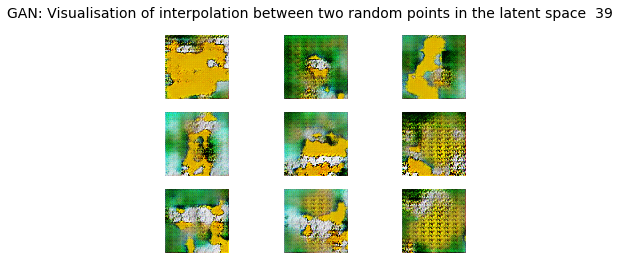

In [100]:
## Build and train the model (need around 10 epochs to start seeing some results)

latent_dim = 256
discriminator, generator, gan = build_gan(dataset.shape[1:], latent_dim, filters=128)
dataset_scaled = load_real_samples(scale=True)

train_gan(generator, discriminator, gan, dataset_scaled, latent_dim, n_epochs=40)

### Visualisation of interpolating between two points in latent space

1/1 [==============================] - 0s 62ms/step
(9, 64, 64, 3)


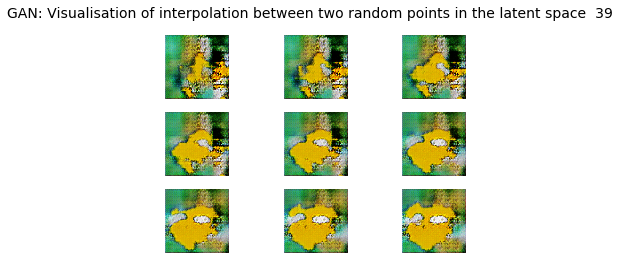

In [103]:
points = np.random.randn(2, latent_dim) # two random points in the latent space
diff = points[1]-points[0]
interpolated_points = np.array([points[0] + (i/9)*diff for i in range(9)])
images = generator.predict(interpolated_points)
print(images.shape)
grid_plot(images, epoch, name='GAN: Visualisation of interpolation between two random points in the latent space', n=3, save=False, scale=True)